# Comomo analysis : uSEIR quenched LLE (CCAA) - draft

version: 05-06-2020

author : JAH, JJG

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import matplotlib.dates as mdates
plt.rcParams["figure.figsize"] = 8, 6
plt.rcParams["font.size"     ] = 12

In [2]:
import os
import sys
import glob
import time
import warnings
import datetime 
print("Last updated on ", time.asctime())

Last updated on  Mon Jun 22 11:40:09 2020


In [3]:
import ipywidgets as widgets
from ipywidgets import IntProgress
from IPython.display import display

In [4]:
import numpy as np
import pandas as pd
import matplotlib

In [5]:
import c19.data_functions_momo as momodata
import c19.momo_analysis       as c19ma

import c19.useir            as us
import c19.kfilter          as kf
import c19.useir_ana        as usa
import c19.cfit             as cfit

#import c19.momodata         as 

import scipy          as sp
import scipy.stats    as stats
import scipy.optimize as optimize

npa     = np.array
npdate  = np.datetime64
npdtime = np.timedelta64

In [197]:
from c19.useir_comomo_llfit_ana import canames
from c19.useir_comomo_llfit_ana import ca_cases, ana_ca, plot_ana_ca
from c19.useir_comomo_llfit_ana import ana_ccaa, plot_ana_ccaa, plot_ana_ccaa_evo
from c19.useir_comomo_llfit_ana import get_dpars, plot_dpars

In [216]:
ipath = '/Users/hernando/investigacion/bio/c19/data/'
ifile = 'ccaa_8complete.csv'

def get_dpars(filename):
    
    dfr = pd.read_csv(ipath + ofile)
    dfr = dfr.rename(columns = {'Unnamed: 0': 'pars'})
    dfr = dfr.set_index('pars')
    
    def _vals(vals):
        vals = vals.replace('[', ''); vals = vals.replace(']', '')
        vals = [float(val) for val in vals.split(',')]
        return vals
    
    for icol in dfr.columns.values:
        for irow in dfr.index.values:
            vals = dfr[icol][irow]
            dfr[icol][irow] = _vals(vals)
    return dfr    


def plot_dpars(capars, canames = None):
    
    canames = capars.keys() if canames is None else canames
    
    trs    = npa([capars[caname]['tr'][-1]    for caname in canames])
    betas  = npa([capars[caname]['beta'][-1]  for caname in canames])
    gammas = npa([capars[caname]['gamma'][-1] for caname in canames])

    phis = npa([capars[caname]['phi'][-1] for caname in canames])
    s1s  = npa([capars[caname]['s1'][-1]  for caname in canames])
    t0s  = npa([capars[caname]['t0'][-1]  for caname in canames])

    plt.figure(figsize = (8, 5))
    plt.plot(trs, ls = '', marker = '*', label = r'$T_R$');
    plt.plot(trs * betas, ls = '', marker = 'o', label = r'$R_0$');
    plt.plot(trs * gammas, ls = '', marker = '^', label = r'$R_1$');
    plt.legend(); plt.grid()
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    
    plt.figure(figsize = (8, 5))
    plt.plot(100 * s1s , ls = '', marker = '^', label = r'$s_1$');
    plt.plot(100 * 10 * phis, ls = '', marker = '^', label = r'$10 \phi_m$');
    plt.legend(); plt.grid();
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    
    plt.figure(figsize = (8, 5))
    plt.plot(t0s, ls = '', marker = '^', label = r'$t_0$');
    plt.legend(); plt.grid();
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    
    chi2  = npa([capars[caname]['chi2'][-1] for caname in canames])
    
    plt.figure(figsize = (8, 5))
    plt.plot(chi2, ls = '', marker = '^', label = r'$\chi^2$');
    plt.legend(); plt.grid();
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    return


    

In [194]:
dfr = get_dpars(ipath + ifile)

,Madrid,Castilla y Leon,Castilla La Mancha,Cataluna,C. Valenciana,Aragon,Pais Vasco,Navarra,La Rioja,Cantabria,Asturias,Galicia,Murcia,Andalucia,Extremadura,Canarias,Baleares
pars,,,,,,,,,,,,,,,,,
beta,"[1.6098409304296109, 1.6572404935769236, 1.685...","[1.5713130843434273, 1.6143476183058367, 1.672...","[1.5281182551213495, 1.5269255525215304, 1.566...","[1.4844988127716987, 1.4989424179500452, 1.578...","[1.6431323492979368, 1.6461973466636977, 1.684...","[1.3669222001046748, 1.4116975474225293, 1.461...","[1.5386313590532965, 1.7258429218365892, 1.725...","[1.3147193139073101, 1.5241581227957606, 1.626...","[1.0797735263012576, 1.1467035070764666, 1.181...","[1.0256668818570356, 1.0214920151764653, 1.017...","[1.334906267534208, 1.4063015757749815, 1.4380...","[1.3629208921553346, 1.3827157520302673, 1.380...","[1.5785349776007118, 1.5227691018524765, 1.522...","[1.5849723748672335, 1.5849723833318992, 1.584...","[1.4154493200440408, 1.4546128710958428, 1.526...","[1.4728400914752773, 1.47328394816178, 1.47328...","[1.5227828966039398, 1.522931336833769, 1.5319..."
chi2,"[502.116890876941, 496.8710054432418, 480.4311...","[406.5939782714345, 170.97370942359385, 158.22...","[519.3875367446267, 440.41440696824526, 426.34...","[743.6673996706263, 734.201045322501, 702.4506...","[325.5991445278812, 324.84262599939325, 322.97...","[168.10844161387132, 166.8257687157392, 165.14...","[243.14716033462852, 233.98456473655472, 233.9...","[167.62862461817107, 156.73167299316333, 153.8...","[98.52690396370232, 98.08683617454435, 97.9046...","[104.89350061964939, 104.89190511888296, 104.8...","[179.21833673970727, 177.36470942743577, 177.3...","[261.91430522466374, 222.8990596310724, 222.88...","[205.5139938449963, 205.48319951139692, 205.48...","[438.39509090899435, 438.3927724119323, 438.39...","[260.3990427019144, 231.94197567499089, 230.27...","[205.3834223316846, 205.38228009956245, 205.38...","[178.21492313507585, 175.18432763828238, 174.8..."
gamma,"[0.23440557377695853, 0.26247923810042806, 0.2...","[0.22212828889091085, 0.2313401054681104, 0.23...","[0.239091942385512, 0.2361296142261693, 0.2390...","[0.23275151746446926, 0.2373921076945783, 0.29...","[0.20986435620551658, 0.2059212053091476, 0.20...","[0.202163470950682, 0.21070421324915356, 0.229...","[0.24282662966177596, 0.38384078248842335, 0.3...","[0.17293644726776722, 0.20903880691505283, 0.2...","[0.21819092047828947, 0.23727398756008414, 0.2...","[0.19537902376144783, 0.19506377482912635, 0.1...","[0.25795952618075507, 0.2658560216364396, 0.26...","[0.22730035036505755, 0.1733786193989829, 0.17...","[0.254465338744815, 0.25273571912897763, 0.252...","[0.20172809940222006, 0.20188828810732545, 0.2...","[0.2636344637867038, 0.22840439465818285, 0.23...","[0.2531563449257727, 0.25315634492577266, 0.25...","[0.20305528335638146, 0.22936615607640415, 0.2..."
n,"[6578079.0, 6578079.0, 6578079.0, 6578079.0, 6...","[2409164.0, 2409164.0, 2409164.0, 2409164.0, 2...","[2026807.0, 2026807.0, 2026807.0, 2026807.0, 2...","[7600065.0, 7600065.0, 7600065.0, 7600065.0, 7...","[4963703.0, 4963703.0, 4963703.0, 4963703.0, 4...","[1308728.0, 1308728.0, 1308728.0, 1308728.0, 1...","[2199088.0, 2199088.0, 2199088.0, 2199088.0, 2...","[647554.0, 647554.0, 647554.0, 647554.0, 64755...","[315675.0, 315675.0, 315675.0, 315675.0, 31567...","[580229.0, 580229.0, 580229.0, 580229.0, 58022...","[1028244.0, 1028244.0, 1028244.0, 1028244.0, 1...","[2701743.0, 2701743.0, 2701743.0, 2701743.0, 2...","[1478509.0, 1478509.0, 1478509.0, 1478509.0, 1...","[8384408.0, 8384408.0, 8384408.0, 8384408.0, 8...","[1072863.0, 1072863.0, 1072863.0, 1072863.0, 1...","[2127685.0, 2127685.0, 2127685.0, 2127685.0, 2...","[1128908.0, 1128908.0, 1128908.0, 1128908.0, 1..."
phi,"[0.007203925599851198, 0.0054602857278777395, ...","[0.007633173408523636, 0.0051587261848909825, ...","[0.008457873176374947, 0.009886049877707019, 0...","[0.006362354916723732, 0.005852474369008494, 0...","[0.004940345666236001, 0.00491728404

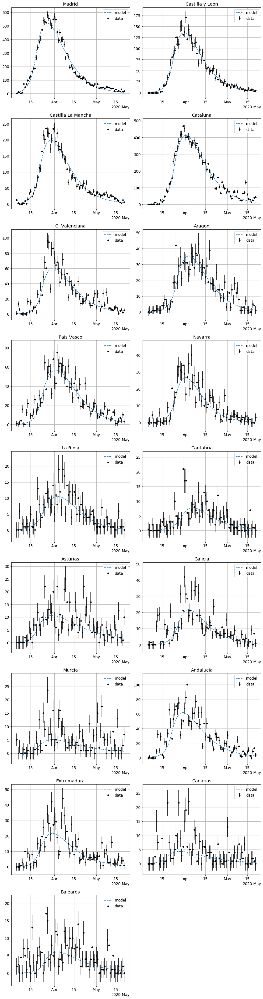

In [203]:
plot_ana_ccaa(dfr, ncols = 2)

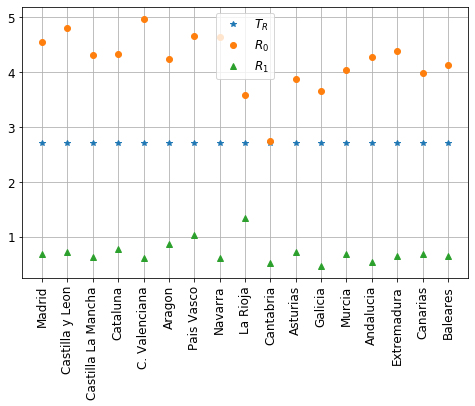

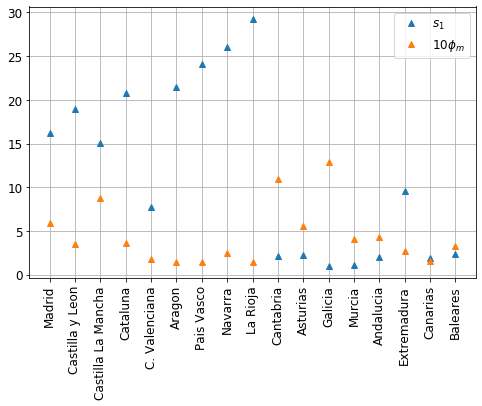

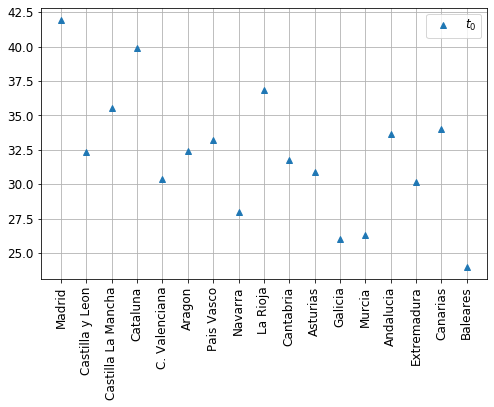

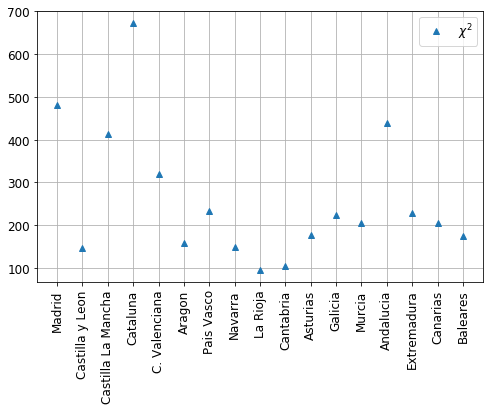

In [217]:
plot_dpars(dfr)

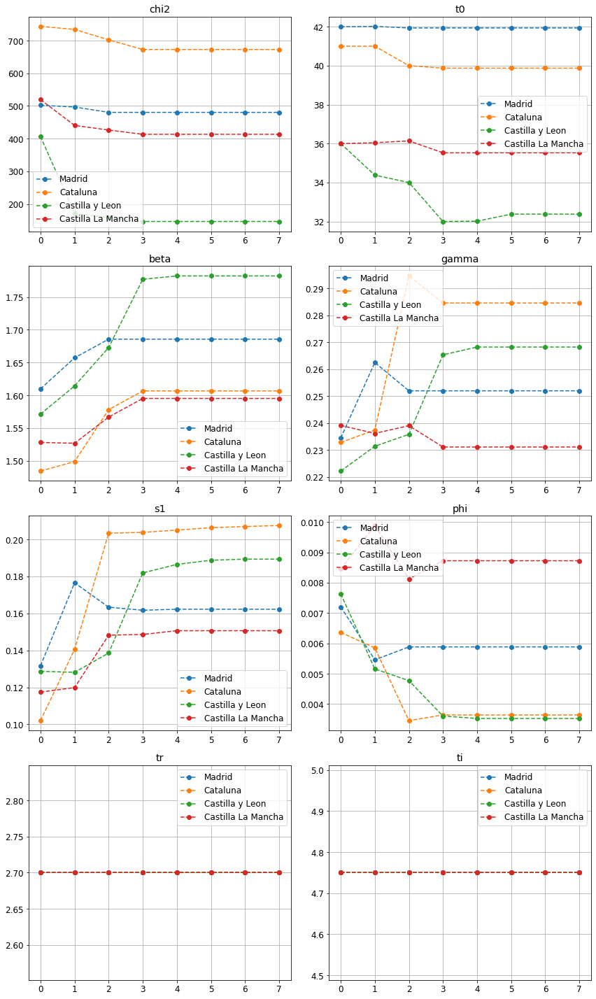

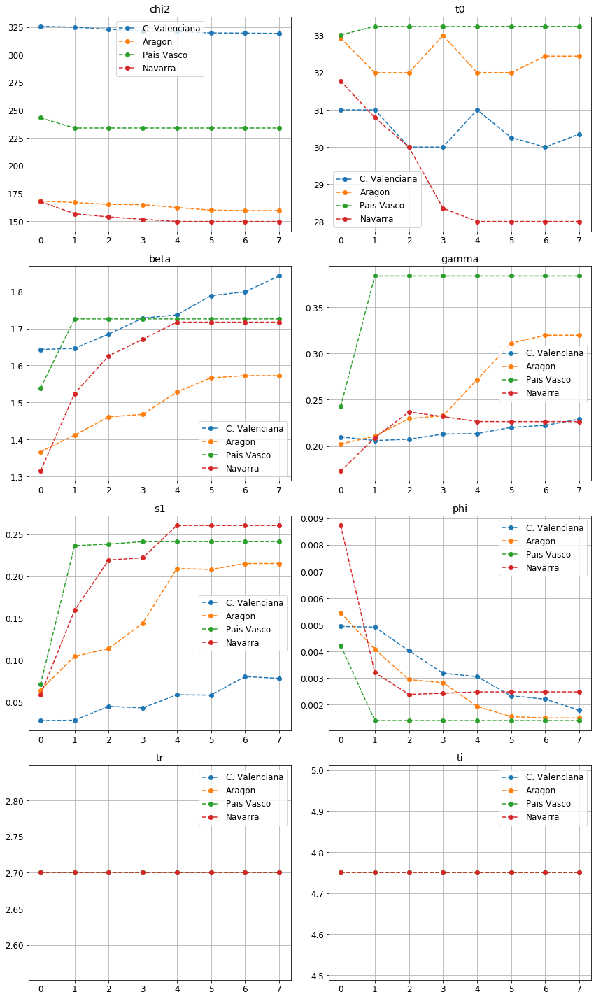

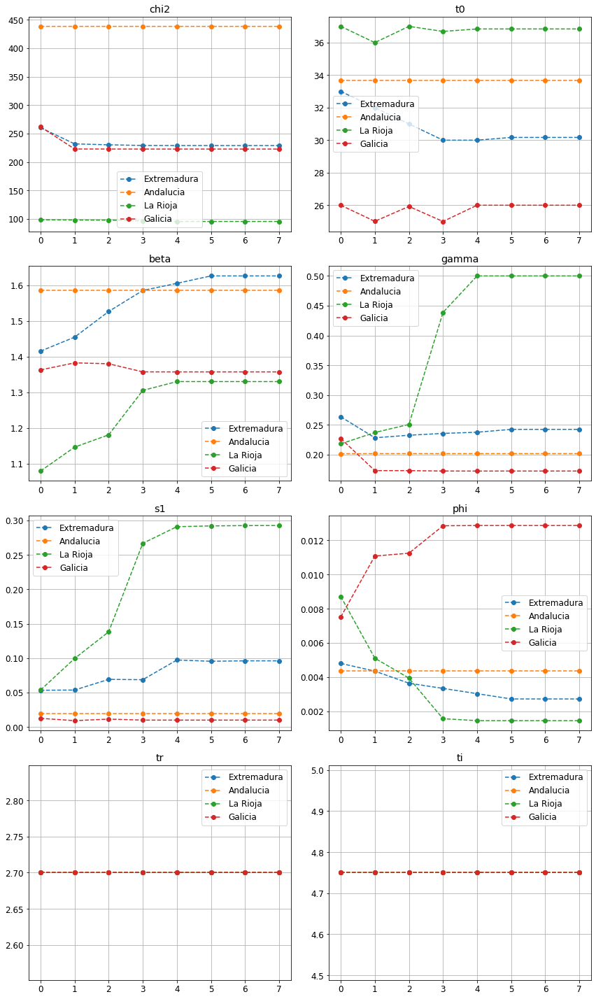

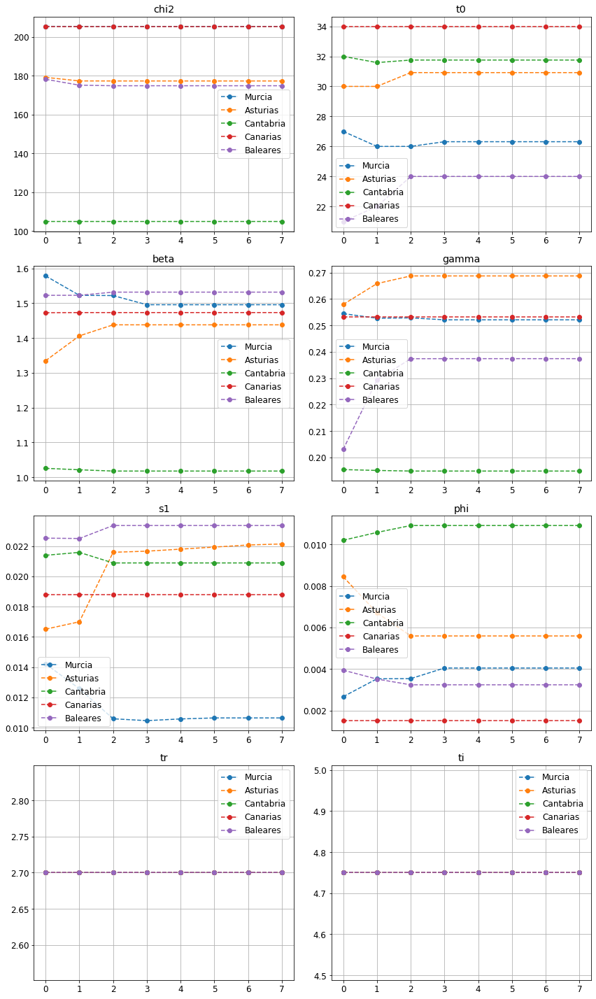

In [202]:
plot_ana_ccaa_evo(dfr, ['Madrid', 'Cataluna', 'Castilla y Leon', 'Castilla La Mancha'])
plot_ana_ccaa_evo(dfr, ['C. Valenciana', 'Aragon', 'Pais Vasco', 'Navarra'])
plot_ana_ccaa_evo(dfr, ['Extremadura', 'Andalucia', 'La Rioja', 'Galicia'])
plot_ana_ccaa_evo(dfr, ['Murcia', 'Asturias', 'Cantabria', 'Canarias', 'Baleares'])

### Complete - 0 (phi-fix)

In [189]:
dfr['Madrid']['beta']

[1.6098409304296109,
 1.6572404935769236,
 1.6856668144347395,
 1.68566504792582,
 1.6856650523543668,
 1.6856650523543668,
 1.6856650523543668,
 1.6856650523543668]

## Data

Load Data comomo

In [6]:
path = '/Users/hernando/investigacion/bio/c19/cdata/'
dfv, dfe, dfc = momodata.comomo_from_csv(path=path)

In [7]:
dfc.head()

errors                                                         \
  Andalucia       Date Aragon Asturias Baleares Canarias Cantabria   
0       0.0 2020-03-05    0.0      0.0      0.0      0.0       0.0   
1       0.0 2020-03-06    1.0      0.0      0.0      0.0       0.0   
2       0.0 2020-03-07    0.0      0.0      0.0      0.0       0.0   
3       0.0 2020-03-08    1.0      0.0      0.0      0.0       0.0   
4       0.0 2020-03-09    1.0      0.0      0.0      0.0       0.0   

                                                ...      values                \
  Castilla La Mancha Castilla y Leon Cataluna   ...    Cataluna C. Valenciana   
0                0.0             0.0      0.0   ...         0.0           1.0   
1                0.0             0.0      0.0   ...         0.0          13.0   
2                0.0             0.0      1.0   ...         1.0           6.0   
3                0.0             0.0      0.0   ...         0.0           0.0   
4                0.0             0.0      1.0   ...         1.0           0.0   

                                                                         
  Extremadura Galicia Madrid Melilla Murcia Navarra Pais Vasco La Rioja  
0         0.0     0.0    1.0     0.0    5.0     0.0        1.0      0.0  
1         0.0     0.0   12.0     0.0    0.0     1.0        0.0      0.0  
2         0.0     1.5    9.0     0.0    2.5     0.0        1.5      6.0  
3         1.0     0.0    4.0     0.0    0.0     4.5        4.0      0.0  
4         3.0     0.0    8.0     0.0    0.0     0.0       16.0      2.0  

[5 rows x 38 columns]

In [8]:
K0 = {}
K0['Madrid'] =  {'t0': 40.6631717631003, 'beta': 1.5661995670268805, 'gamma': 0.18622613570230911, 
                 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.012575986452685078, 
                 's1': 0.10189130199782927}
K0['Castilla y Leon'] = {'t0': 32.66622553582464, 'beta': 1.413767144021723, 'gamma': 0.16803306349835717, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 2409164.0, 'phi': 0.021587067639146522, 's1': 0.03355446594468488}
K0['Castilla La Mancha'] = {'t0': 35.583008607563954, 'beta': 1.505713108477026, 'gamma': 0.20372946998745708, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 2026807.0, 'phi': 0.01427983835697912, 's1': 0.10112184170026027}
K0['Cataluna'] =  {'t0': 37.557781458118015, 'beta': 1.4948226070499842, 'gamma': 0.19756720386818188, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.00984638319827012, 's1': 0.08775740900486598}
K0['C. Valenciana'] = {'t0': 34.00043666729813, 'beta': 1.3500258329975496, 'gamma': 0.15235947218901752, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 4963703.0, 'phi': 0.009999940647715888, 's1': 0.024503207404145792}
K0['Aragon'] = {'t0': 27.441067728142166, 'beta': 1.2175582655593709, 'gamma': 0.1617444757352847, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 1308728.0, 'phi': 0.0324295828107219, 's1': 0.012361994039465148}
K0['Pais Vasco'] = {'t0': 28.487651703454375, 'beta': 1.5514355877315564, 'gamma': 0.21376206021150718, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 2199088.0, 'phi': 0.012405935479150098, 's1': 0.023205716935152478}
K0['Navarra'] =  {'t0': 25.730898012862696, 'beta': 1.374293557199548, 'gamma': 0.1360021205509374, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 647554.0, 'phi': 0.018725322617549826, 's1': 0.030756373554041032}
K0['La Rioja'] = {'t0': 32.99989770298113, 'beta': 1.1173163050996746, 'gamma': 0.1259755233477562, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 315675.0, 'phi': 0.009998990480059547, 's1': 0.08745144103411126}
K0['Cantabria'] = {'t0': 13.016169109759588, 'beta': 1.3920264445207466, 'gamma': 0.17268189806112166, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 580229.0, 'phi': 0.02922136664417093, 's1': 0.006201730808334946}
K0['Asturias'] = {'t0': 29.21824683092212, 'beta': 1.350942953822674, 'gamma': 0.2585300851484079, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 1028244.0, 'phi': 0.011458461172496385, 's1': 0.010161481775283424}
K0['Galicia'] = {'t0': 28.62464298804072, 'beta': 1.1191494904129895, 'gamma': 0.15861428056079435, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 2701743.0, 'phi': 0.028397168179308336, 's1': 0.004337577431946362}
K0['Murcia'] = {'t0': 12.48935511660366, 'beta': 2.2023881801480085, 'gamma': 0.23365103604671206, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 1478509.0, 'phi': 0.01605628462265475, 's1': 0.0021878612265094207}
K0['Andalucia'] = {'t0': 29.362184078944743, 'beta': 1.2902677529879232, 'gamma': 0.17046417361737165, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 8384408.0, 'phi': 0.04687241258808541, 's1': 0.0020818074559111814}
K0['Extremadura'] = {'t0': 31.775588594031863, 'beta': 1.2240900379676996, 'gamma': 0.18479754151357647, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 1072863.0, 'phi': 0.016715544903289505, 's1': 0.01927127899745814}
K0['Canarias']  = {'t0': 29.886253597018758, 'beta': 1.2126353053658898, 'gamma': 0.2238995476983161, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 2127685.0, 'phi': 0.014956806605211672, 's1': 0.0018462433393859915}
K0['Baleares'] = {'t0': 30.800723833629, 'beta': 1.200083828684592, 'gamma': 0.203209532709875213, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 1128908.0, 'phi': 0.01542693902616, 's1': 0.1316663797438487}


## code

In [99]:
canames = ['Madrid', 'Castilla y Leon', 'Castilla La Mancha',
           'Cataluna', 'C. Valenciana', 'Aragon',
           'Pais Vasco', 'Navarra', 'La Rioja',
           'Cantabria', 'Asturias', 'Galicia',
           'Murcia', 'Andalucia', 'Extremadura',
           'Canarias', 'Baleares']

nn = {'Madrid': 6578079, 'Castilla y Leon': 2409164, 'Castilla La Mancha': 2026807, 
      'Cataluna': 7600065, 'C. Valenciana': 4963703, 'Aragon': 1308728, 'Pais Vasco': 2199088, 
      'Navarra': 647554, 'La Rioja': 315675, 'Cantabria': 580229, 'Asturias': 1028244, 
      'Galicia': 2701743, 'Murcia': 1478509, 'Andalucia': 8384408, 'Extremadura': 1072863, 
      'Baleares': 1128908, 'Canarias': 2127685}

TR, TI = 2.7, 4.75

#masks0 =  2  * (('t0', 's1', 'phi'), ('beta', 'gamma'))
#masks0 =  2 * (('t0', 's1', 'phi'), ('s1', 'beta', 'gamma')) + ('t0', 's1', 'phi')
kmasks0 = (('t0', 's1'), ('s1', 'beta'), ('t0', 'gamma'))


def ca_cases(caname):
    """ returns dates, cases of a given autonomous comunity
    """
    dates  = dfv.Date.values
    cases  = dfv[caname].values
    ucases = dfe[caname].values
    
    if (caname == 'Galicia'):
        sel0 = dates == npdate('2020-04-29')
        sel1 = dates == npdate('2020-04-28')
        cases[sel0] = cases[sel1]
        
    return dates, cases, ucases


def kpars0(caname, tr = TR, ti = TI):
    """ returns the default parameters for agive autonomous comunity
    """
        
    n0     = nn[caname]
    phi    = 0.008
    r0, r1 = 4, 0.6
    s1  = 0.05
    t0  = 35
    if (caname in ('Madrid', 'Cataluna', 'Castilla y Leon', 'Castilla La Mancha')): 
        s1 = 0.12; t0 = 40
    if (caname in ('Cantabria', 'Asturias', 'Galicia', 'Murcia', 'Andalucia', 'C. Valenciana',
               'Canarias', 'Baleares')): 
        s1 = 0.02; t0 = 30
    
    kpars =  {'t0': t0, 'beta': r0/tr, 'gamma': r1/tr, 'tr': tr, 'ti': TI, 
                   'tm': 9., 'n': n0, 'phi': phi, 's1': s1}
    return kpars
    

def ana_ca(caname, kpars = None, kmasks = None, verbose = False):
    """ a sequence of fits (controlled by the list of masks) data of caname community 
        returns a dictoinary with the estimated parameters in each fit in the sequence.
    """
    
    dates, cases, ucases = ca_cases(caname)
    ts                   = np.arange(len(dates))
    
    ikpars = kpars0(caname) if kpars  is None else kpars.copy() 
    if 'chi2' in ikpars.keys(): ikpars.pop('chi2')
    kmasks = kmasks0        if kmasks is None else kmasks
        
    dpars = []
    for kmask in kmasks:
        if (verbose):
            print(' fit ', caname, ' masks ', kmask)
            print(' fit ', caname, ' pars0 ', ikpars)
        ikpars, chi2 = usa.useirqm_chi2fit(dates, cases, kpars = ikpars, kmask = kmask)
        ikpars_      = ikpars.copy(); ikpars_['chi2'] = chi2
        if (verbose):
            print(' fit ', caname, ' pars ', ikpars_)
        dpars.append(ikpars_)
    
    rpars = {}
    for key in dpars[0].keys():
        rpars[key] = [dpar[key] for dpar in dpars]
    
    return rpars

def plot_ana_ca(caname, kpars):
    dates, cases, ucases = ca_cases(caname)
    ikpars   =  kpars.copy()
    if 'chi2' in ikpars.keys(): ikpars.pop('chi2')
    fmodel      = usa.useirqm_fmodel(kpars = ikpars)
    usa.plot_data_model(dates, cases, fmodel)
    plt.title(caname)
    return


def ana_ccaa(canames, kpars = None, kmasks = None, bar = True, verbose = False):
    
    tbar = None
    if bar:
        nmax = len(canames) 
        tbar = IntProgress(0, max = nmax + 1, description = 'fitting...'); display(tbar)
        if (bar): tbar.value += 1
     
    dpars = {}
    for caname in canames:
        ikpars = kpars[caname] if kpars is not None else None
        idpars = ana_ca(caname, ikpars, kmasks, verbose = verbose)
        dpars[caname] = idpars
        if (bar): tbar.value += 1
    return dpars

def plot_ana_ccaa(dpars):
    
    canames = dpars.keys()
    
    ncols = 2
    nrows = int(len(canames)/ncols) + int(len(canames)%ncols)
    
    plt.figure(figsize = (6 * ncols, 5 * nrows))
    
    for i, caname in enumerate(canames):
        kpars = {}
        for key in dpars[caname].keys():
            kpars[key] = dpars[caname][key][-1] 
        plt.subplot(nrows, ncols, i+1)
        plot_ana_ca(caname, kpars)
    plt.tight_layout()
    return

def plot_ana_ccaa_evo(dpars):
    canames = dpars.keys()
    keys = ['chi2', 't0', 'beta', 'gamma', 's1', 'phi', 'tr', 'ti']
    
    nrows, ncols = 4, 2
    plt.figure(figsize = (6 * ncols, 5 * nrows))
    for i, key in enumerate(keys):
        plt.subplot(nrows, ncols, i + 1)
        for caname in canames:
            data = dpars[caname][key]
            plt.plot(np.arange(len(data)), data, ls = '--', marker = 'o', label = caname)
        plt.title(key); plt.grid(); plt.legend()
    plt.tight_layout()
    
    return

In [80]:
print(dpars)

{'Madrid': {'t0': [44.0, 44.0], 'beta': [1.4814814814814814, 1.4852476714801957], 'gamma': [0.2222222222222222, 0.21529062571248175], 'tr': [2.7, 2.7], 'ti': [4.75, 4.75], 'tm': [9.0, 9.0], 'n': [6578079.0, 6578079.0], 'phi': [0.01, 0.01], 's1': [0.10949999999999999, 0.10949999999999999], 'chi2': [593.0155230556117, 578.6139569946818]}, 'Cataluna': {'t0': [39.0, 39.0], 'beta': [1.4814814814814814, 1.4775119626430964], 'gamma': [0.2222222222222222, 0.14898463730528655], 'tr': [2.7, 2.7], 'ti': [4.75, 4.75], 'tm': [9.0, 9.0], 'n': [7600065.0, 7600065.0], 'phi': [0.01, 0.01], 's1': [0.1245, 0.1245], 'chi2': [3899.578749949709, 1658.4012829821313]}}


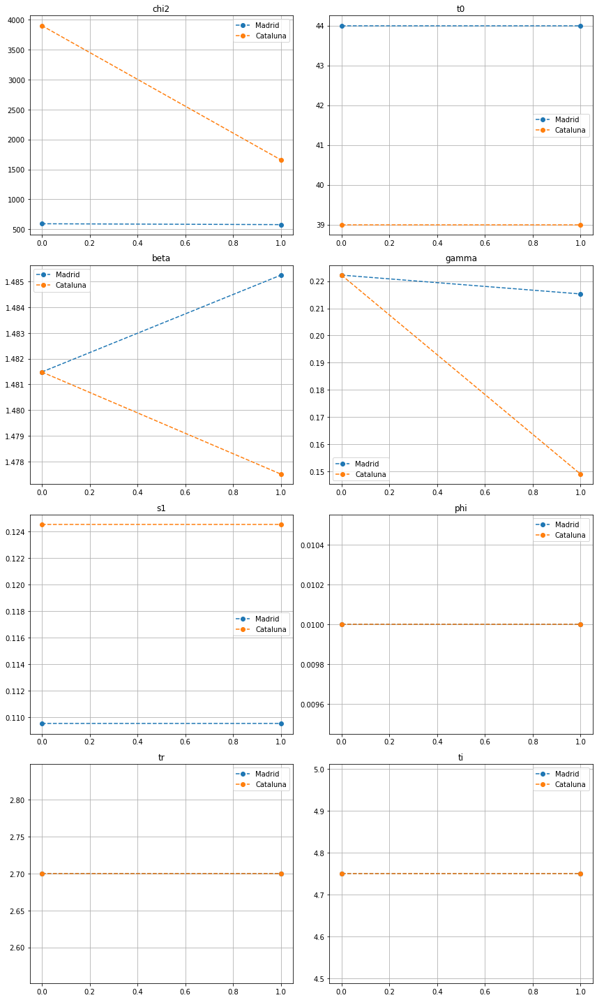

In [81]:
plot_ana_ccaa_evo(dpars)

In [38]:
### check - code and flow with some canames

IntProgress(value=0, description='fitting...', max=3)

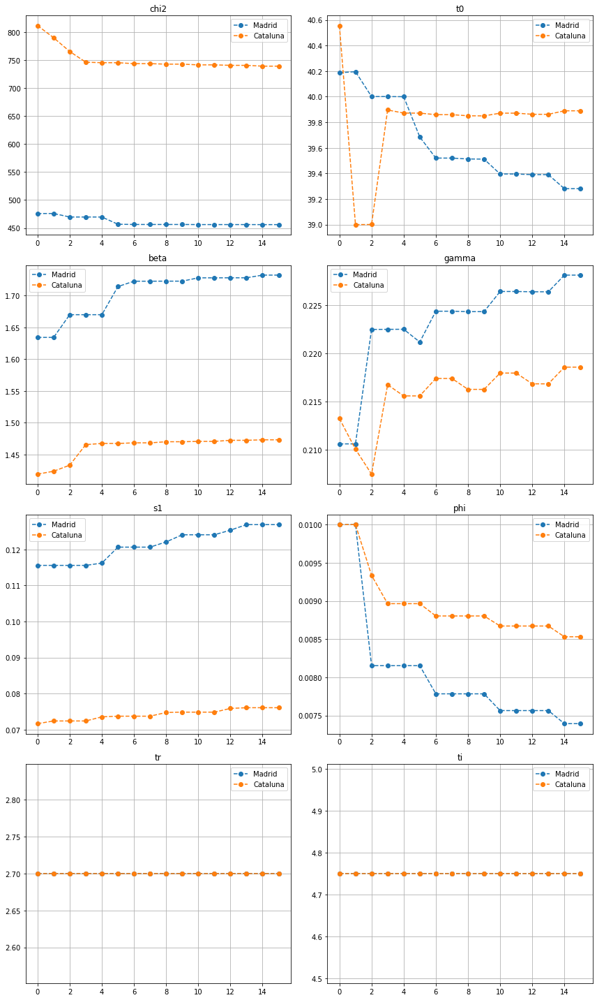

In [86]:
canames1 = ['Madrid', 'Cataluna']
masks    = 4 * (2 * (('s1', 't0', 'beta', 'gamma'),) + 2 * (('t0', 'beta', 'gamma', 'phi'),))
dpars    = ana_ccaa(canames1, kmasks = masks, verbose = False, bar = True)
dfr = pd.DataFrame(dpars)
dfr.to_csv('temp.cvs')
plot_ana_ccaa_evo(dpars)

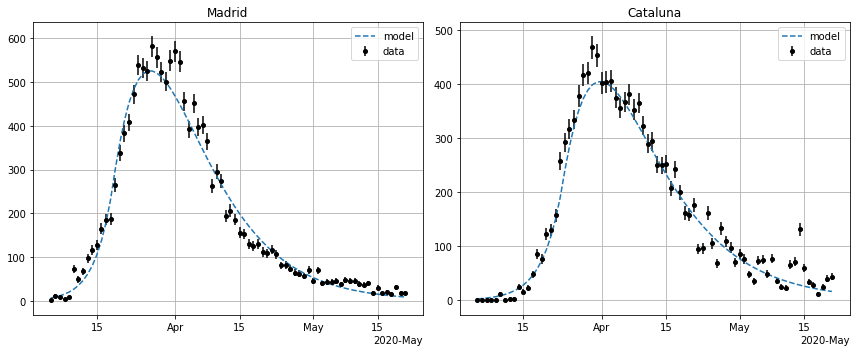

In [93]:
plot_ana_ccaa(dpars)

### run - CCAA - grave

IntProgress(value=0, description='fitting...', max=5)

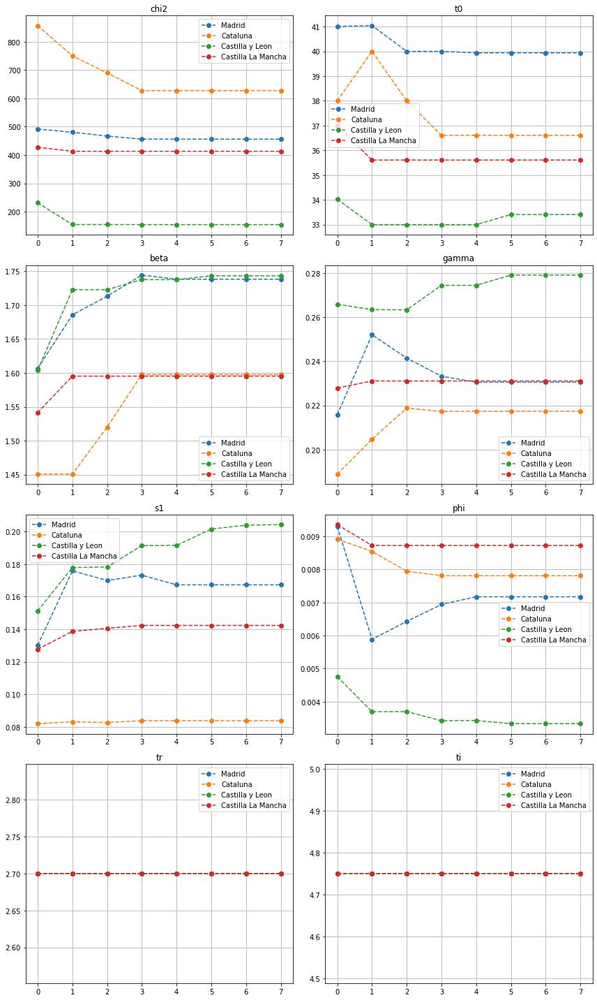

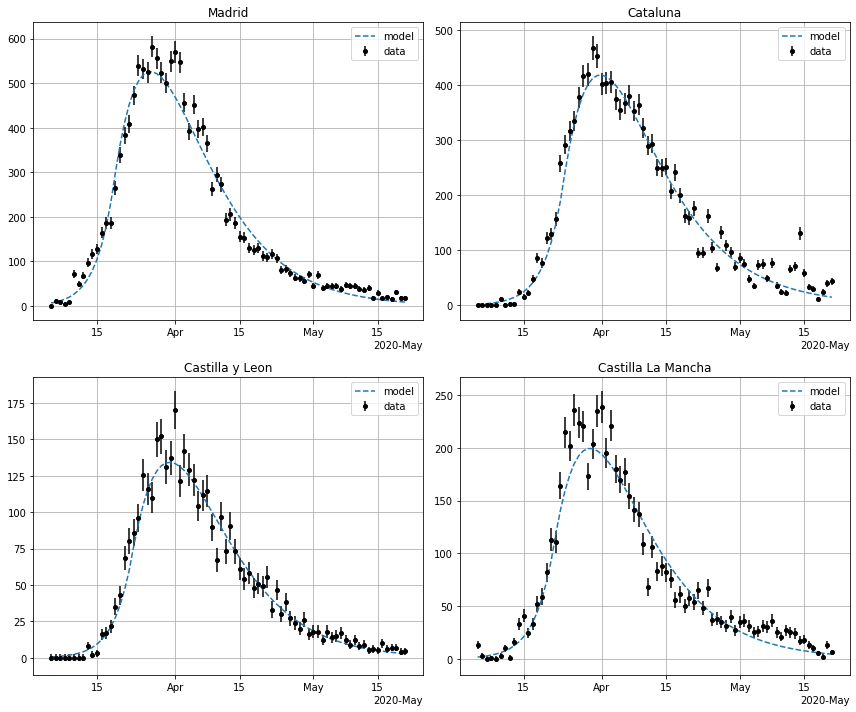

In [94]:
canames1 = ['Madrid', 'Cataluna', 'Castilla y Leon', 'Castilla La Mancha']
masks    = 8  * (('s1', 't0', 'beta', 'gamma', 'phi'),)
dpars    = ana_ccaa(canames1, kmasks = masks, verbose = False, bar = True)
dfr = pd.DataFrame(dpars)
dfr.to_csv('ccaa_grave_8complete.cvs')
plot_ana_ccaa_evo(dpars)
plot_ana_ccaa(dpars)

### run CCAA - medium

IntProgress(value=0, description='fitting...', max=5)

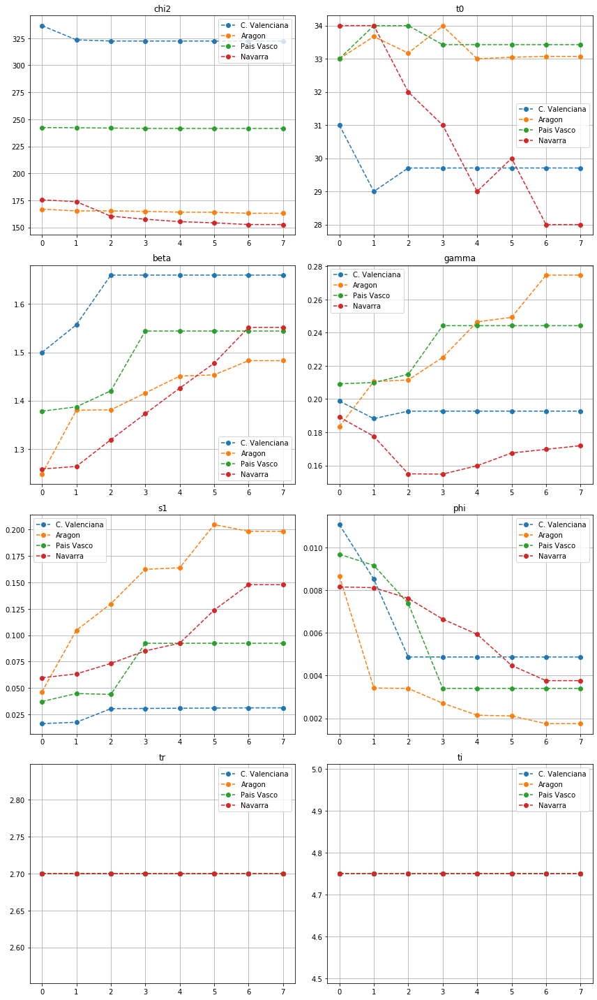

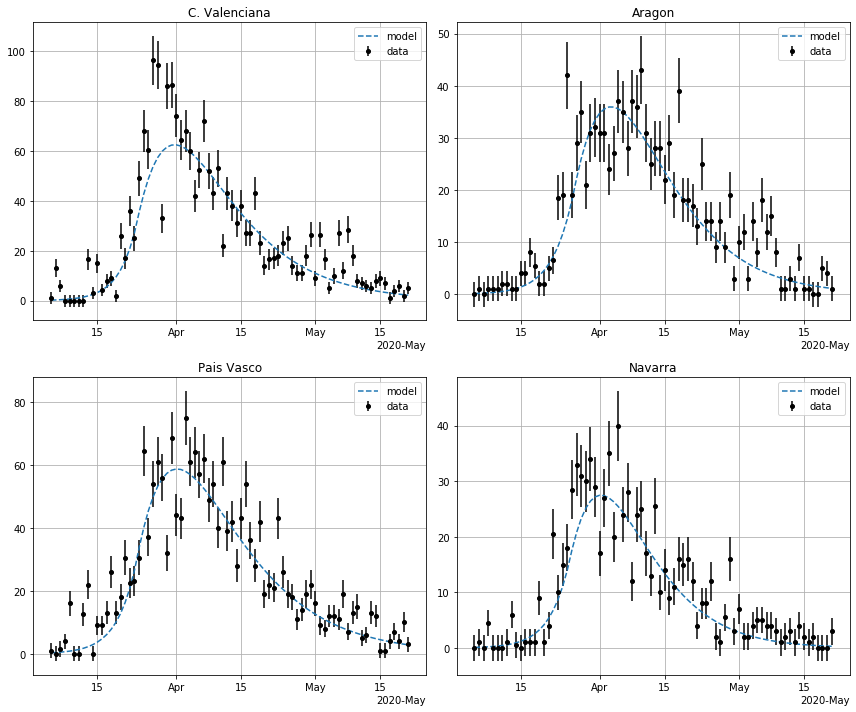

In [96]:
canames1 = ['C. Valenciana', 'Aragon', 'Pais Vasco', 'Navarra']
masks    = 8  * (('s1', 't0', 'beta', 'gamma', 'phi'),)
dpars    = ana_ccaa(canames1, kmasks = masks, verbose = False, bar = True)
dfr = pd.DataFrame(dpars)
dfr.to_csv('ccaa_medium_8complete.cvs')
plot_ana_ccaa_evo(dpars)
plot_ana_ccaa(dpars)

### run CCAA - soft

IntProgress(value=0, description='fitting...', max=5)

mle: warning


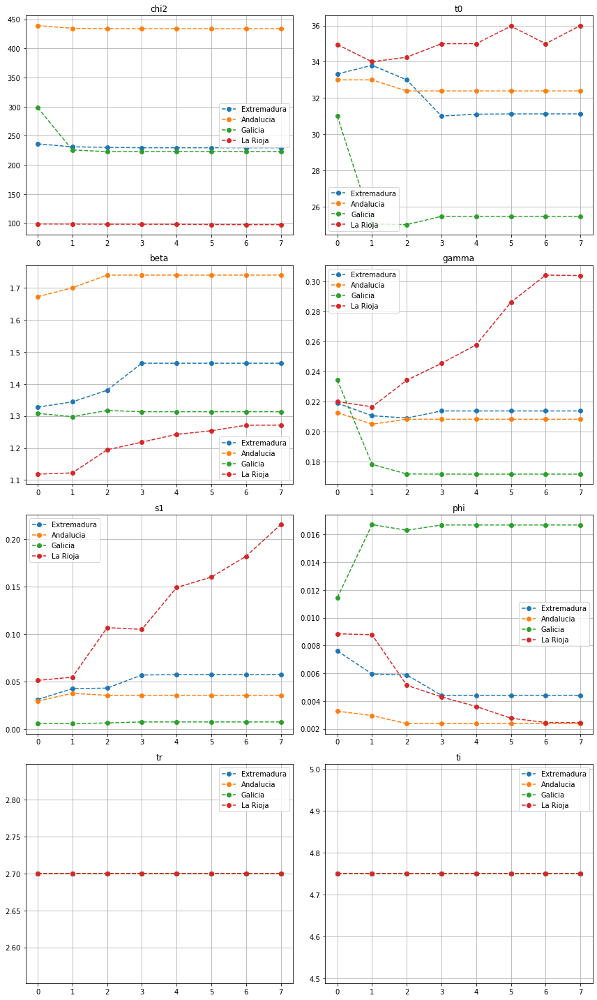

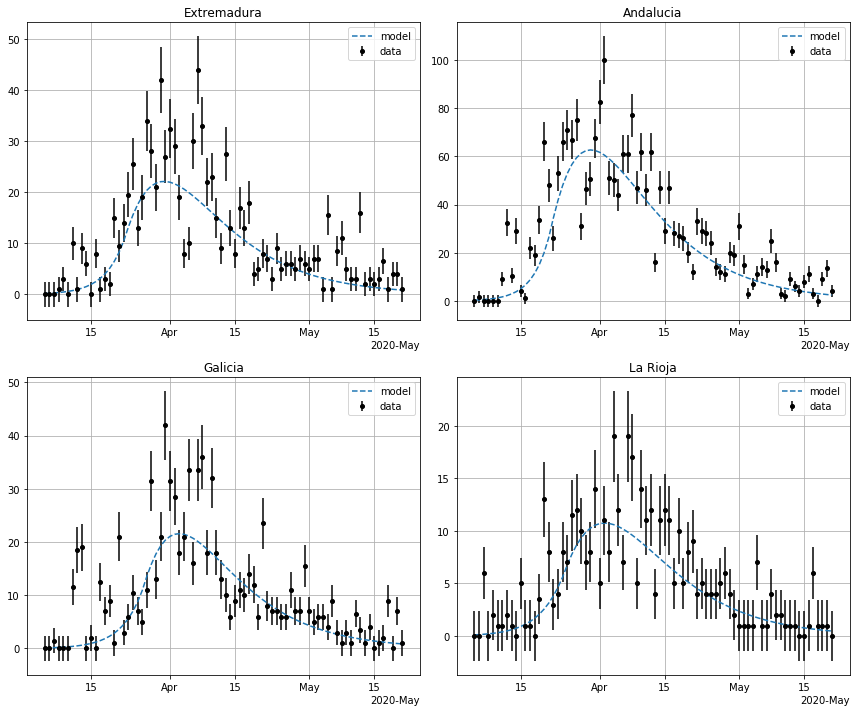

In [97]:
canames1 = ['Extremadura', 'Andalucia', 'Galicia', 'La Rioja']
masks    = 8  * (('s1', 't0', 'beta', 'gamma', 'phi'),)
dpars    = ana_ccaa(canames1, kmasks = masks, verbose = False, bar = True)
dfr = pd.DataFrame(dpars)
dfr.to_csv('ccaa_soft_8complete.cvs')
plot_ana_ccaa_evo(dpars)
plot_ana_ccaa(dpars)

### test CCAA - case phi-fix 

phi = 0.008

IntProgress(value=0, description='fitting...', max=3)

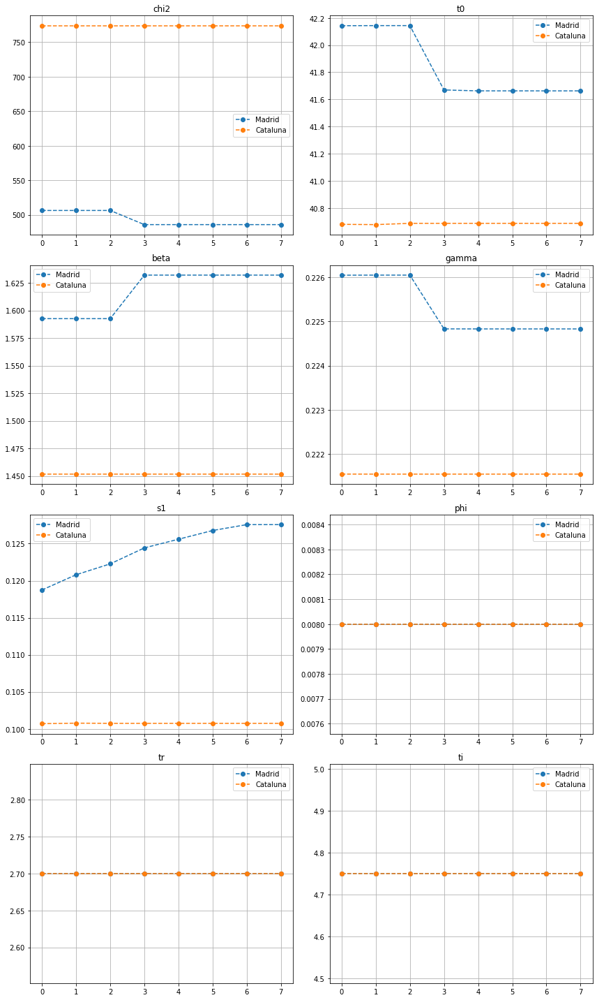

In [100]:
canames1 = ['Madrid', 'Cataluna']
masks    = 8 * (('s1', 't0', 'beta', 'gamma'),)
dpars    = ana_ccaa(canames1, kmasks = masks, verbose = False, bar = True)
dfr = pd.DataFrame(dpars)
dfr.to_csv('temp.cvs')
plot_ana_ccaa_evo(dpars)

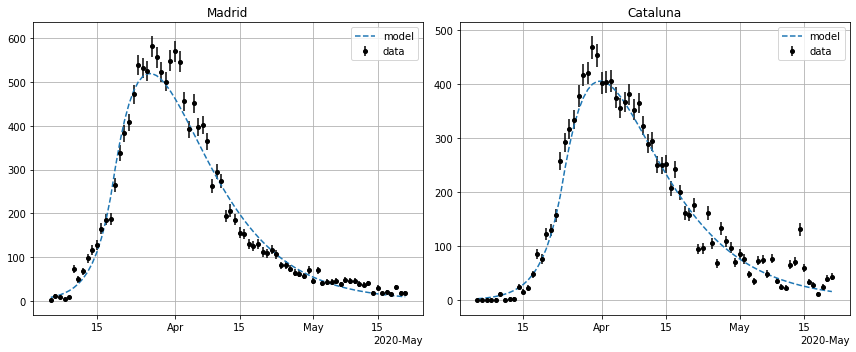

In [101]:
plot_ana_ccaa(dpars)

IntProgress(value=0, description='fitting...', max=5)

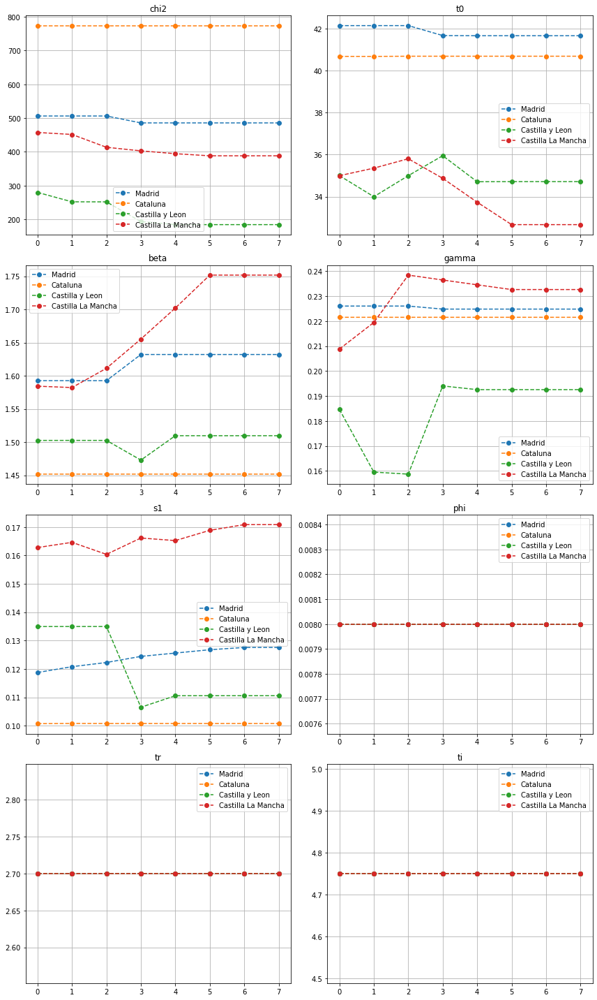

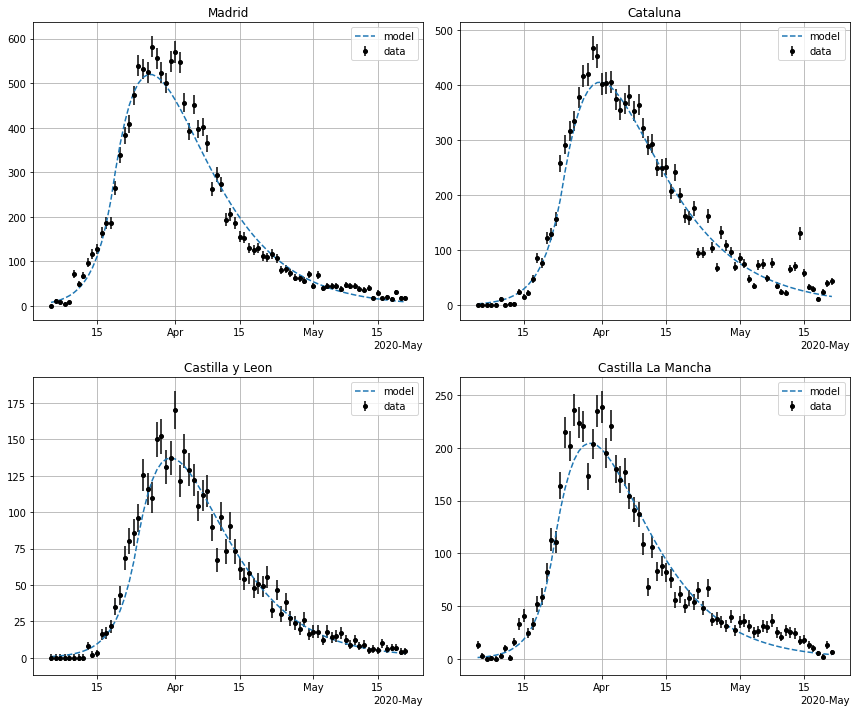

In [102]:
canames1 = ['Madrid', 'Cataluna', 'Castilla y Leon', 'Castilla La Mancha']
masks    = 8  * (('s1', 't0', 'beta', 'gamma'),)
dpars    = ana_ccaa(canames1, kmasks = masks, verbose = False, bar = True)
dfr = pd.DataFrame(dpars)
dfr.to_csv('ccaa_grave_8complete0.cvs')
plot_ana_ccaa_evo(dpars)
plot_ana_ccaa(dpars)

IntProgress(value=0, description='fitting...', max=5)

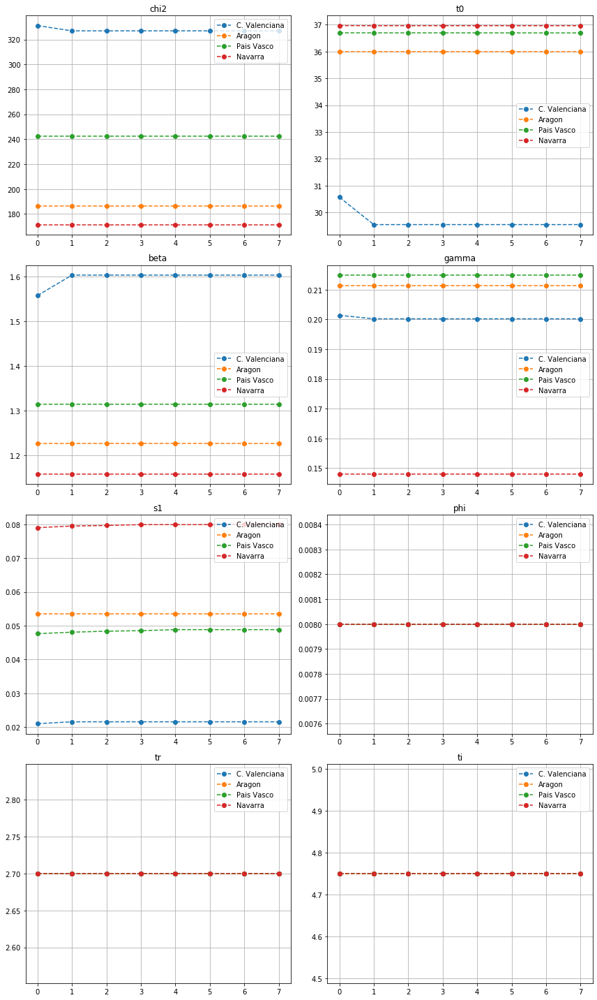

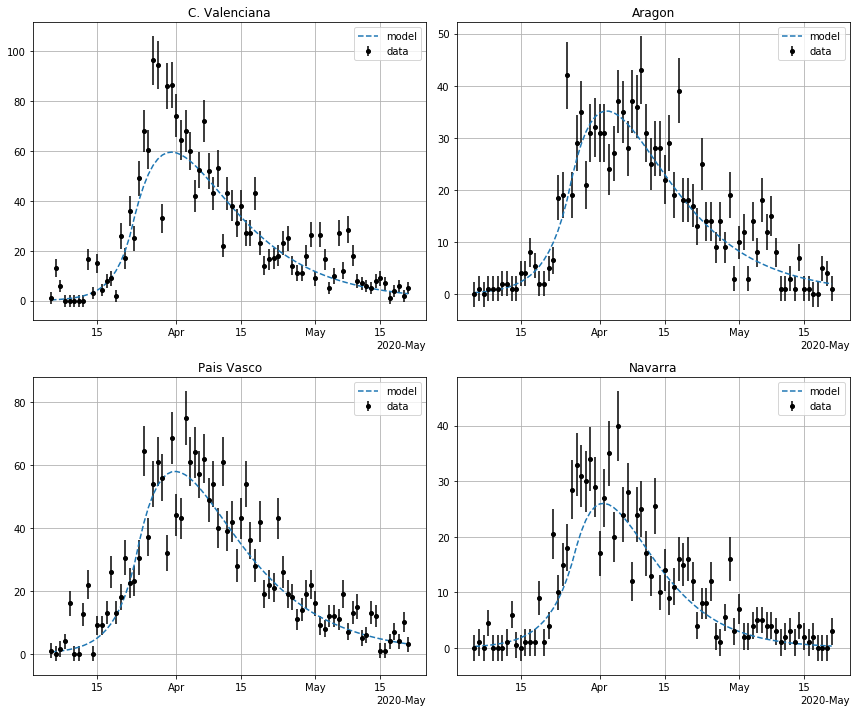

In [103]:
canames1 = ['C. Valenciana', 'Aragon', 'Pais Vasco', 'Navarra']
masks    = 8  * (('s1', 't0', 'beta', 'gamma'),)
dpars    = ana_ccaa(canames1, kmasks = masks, verbose = False, bar = True)
dfr = pd.DataFrame(dpars)
dfr.to_csv('ccaa_medium_8complete0.cvs')
plot_ana_ccaa_evo(dpars)
plot_ana_ccaa(dpars)

IntProgress(value=0, description='fitting...', max=5)

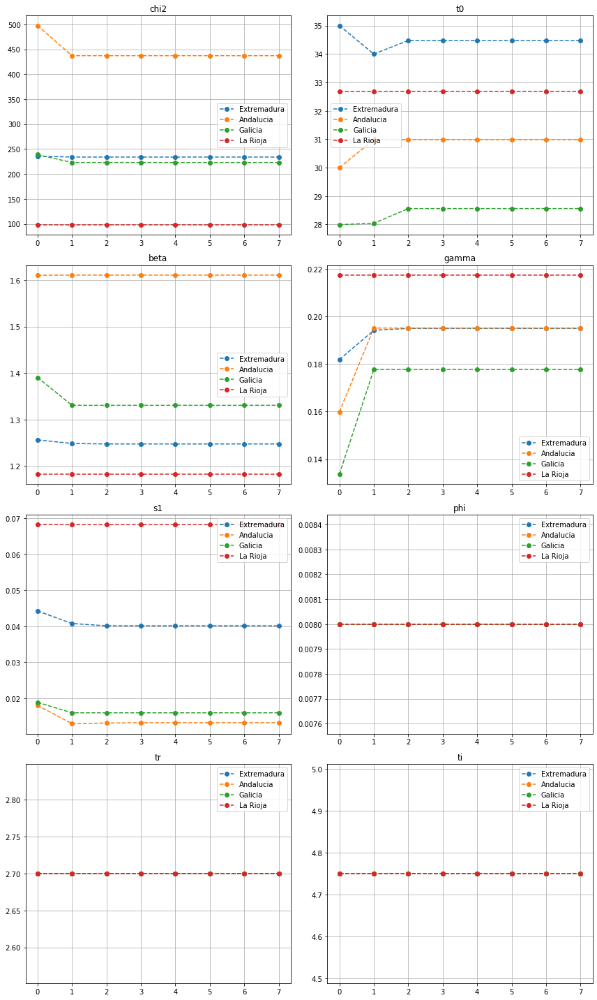

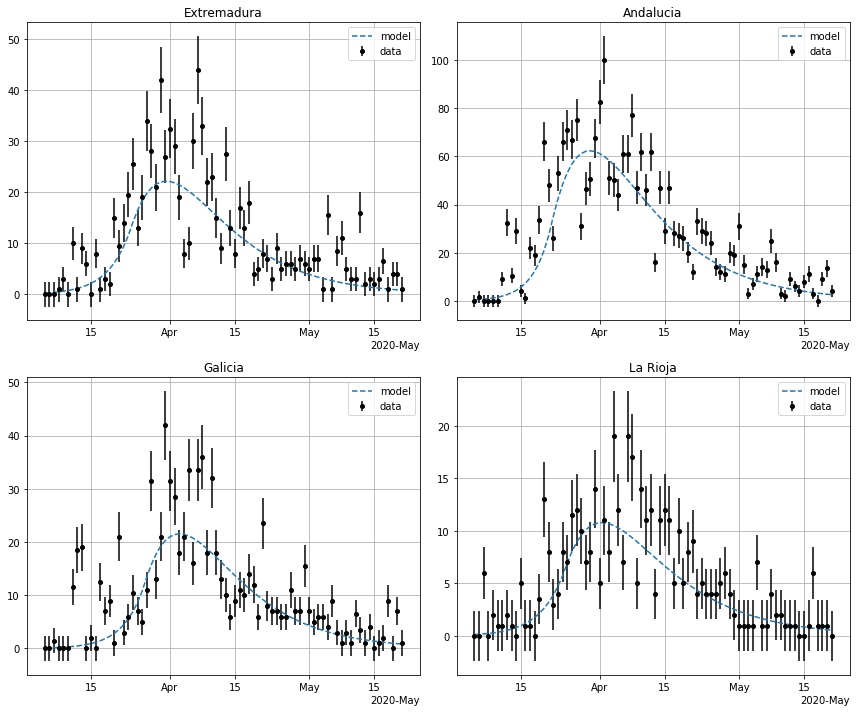

In [104]:
canames1 = ['Extremadura', 'Andalucia', 'Galicia', 'La Rioja']
masks    = 8  * (('s1', 't0', 'beta', 'gamma'),)
dpars    = ana_ccaa(canames1, kmasks = masks, verbose = False, bar = True)
dfr = pd.DataFrame(dpars)
dfr.to_csv('ccaa_soft_8complete0.cvs')
plot_ana_ccaa_evo(dpars)
plot_ana_ccaa(dpars)

### read back

In [139]:
dfr = pd.read_csv('ccaa_grave_8complete.csv')
dfr = dfr.rename(columns={'Unnamed: 0': 'pars'})
keys = dfr['pars']
gindex = {}
for i in range(len(keys)): gindex[i] = keys[i]
print(gindex)
dfr = dfr.rename(index = gindex)
irow = dfr.loc['chi2']['Madrid']
print(irow)

{0: 'beta', 1: 'chi2', 2: 'gamma', 3: 'n', 4: 'phi', 5: 's1', 6: 't0', 7: 'ti', 8: 'tm', 9: 'tr'}
[491.8527171946159, 480.4311126010089, 466.9060000081153, 456.0942761633668, 456.04591979089747, 456.0459197764578, 456.04591977644975, 456.045919776448]


[491.8527171946159, 480.4311126010089, 466.9060000081153, 456.0942761633668, 456.04591979089747, 456.0459197764578, 456.04591977644975, 456.045919776448]


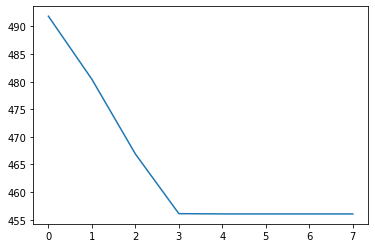

In [147]:
irow = irow.replace('[', '')
irow = irow.replace(']', '')
vals = [float(val) for val in irow.split(',')]
print(vals)
plt.plot(np.arange(len(vals)), vals);

In [113]:
dfr.rename(columns={'Unnamed: 0': 'pars'})

,pars,Madrid,Cataluna,Castilla y Leon,Castilla La Mancha,pars
0,beta,"[1.6065472485262575, 1.6856657058837374, 1.713...","[1.4509593041610533, 1.4506620004207469, 1.520...","[1.6039659266936053, 1.7227404963941968, 1.722...","[1.5414568853055877, 1.5952484150401538, 1.595...",beta
1,chi2,"[491.8527171946159, 480.4311126010089, 466.906...","[857.1830810125813, 750.246772418027, 690.0719...","[231.32911667292674, 154.49799837567713, 154.4...","[427.3152974628249, 413.2139329483245, 413.213...",chi2
2,gamma,"[0.21575678745394092, 0.25195842404361457, 0.2...","[0.18888560002199276, 0.2046959544704939, 0.21...","[0.2657897378813495, 0.2633471158190702, 0.263...","[0.22785047364808192, 0.23105900387496417, 0.2...",gamma
3,n,"[6578079.0, 6578079.0, 6578079.0, 6578079.0, 6...","[7600065.0, 7600065.0, 7600065.0, 7600065.0, 7...","[2409164.0, 2409164.0, 2409164.0, 2409164.0, 2...","[2026807.0, 2026807.0, 2026807.0, 2026807.0, 2...",n
4,phi,"[0.009302738541703971, 0.005884839020825984, 0...","[0.008914341246869444, 0.008545618485891505, 0...","[0.004753577246140839, 0.0036947263725788334, ...","[0.009355260818847518, 0.008725155540098875, 0...",phi
5,s1,"[0.13001267520238102, 0.17586827113870215, 0.1...","[0.08194484428546248, 0.08308837119327975, 0.0...","[0.15126663986794467, 0.17787120602301315, 0.1...","[0.12773063332886228, 0.1386084149133164, 0.14...",s1
6,t0,"[41.005364201905394, 41.03967364132515, 40.000...","[38.000112023233065, 39.9999746774122, 38.0000...","[34.02167708742813, 33.000105108003865, 33.000...","[36.99458273397987, 35.6084781519264, 35.60817...",t0
7,ti,"[4.75, 4.75, 4.75, 4.75, 4.75, 4.75, 4.75, 4.75]","[4.75, 4.75, 4.75, 4.75, 4.75, 4.75, 4.75, 4.75]","[4.75, 4.75, 4.75, 4.75, 4.75, 4.75, 4.75, 4.75]","[4.75, 4.75, 4.75, 4.75, 4.75, 4.75, 4.75, 4.75]",ti
8,tm,"[9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0]","[9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0]","[9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0]","[9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0]",tm
9,tr,"[2.7, 2.7, 2.7, 2.7, 2.7, 2.7, 2.7, 2.7]","[2.7, 2.7, 2.7, 2.7, 2.7, 2.7, 2.7, 2.7]","[2.7, 2.7, 2.7, 2.7, 2.7, 2.7, 2.7, 2.7]","[2.7, 2.7, 2.7, 2.7, 2.7, 2.7, 2.7, 2.7]",tr


In [58]:
plot_ana_cccaa_evo(dpars)

NameError: name 'plot_ana_cccaa_evo' is not defined

In [40]:
dfr = pd.DataFrame(dpars)
dfr.to_csv('temp.cvs')

In [41]:
dfr

,Madrid,Cataluna
beta,"[1.4814814814814814, 1.4852476714801957]","[1.4814814814814814, 1.4775119626430964]"
chi2,"[593.0155230556117, 578.6139569946818]","[3899.578749949709, 1658.4012829821313]"
gamma,"[0.2222222222222222, 0.21529062571248175]","[0.2222222222222222, 0.14898463730528655]"
n,"[6578079.0, 6578079.0]","[7600065.0, 7600065.0]"
phi,"[0.01, 0.01]","[0.01, 0.01]"
s1,"[0.10949999999999999, 0.10949999999999999]","[0.1245, 0.1245]"
t0,"[44.0, 44.0]","[39.0, 39.0]"
ti,"[4.75, 4.75]","[4.75, 4.75]"
tm,"[9.0, 9.0]","[9.0, 9.0]"
tr,"[2.7, 2.7]","[2.7, 2.7]"


 fit  Cataluna  masks  ('t0', 's1', 'beta', 'gamma', 'phi')
 fit  Cataluna  pars0  {'t0': 40, 'beta': 1.4814814814814814, 'gamma': 0.2222222222222222, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065, 'phi': 0.01, 's1': 0.12}
 fit  Cataluna  pars  {'t0': 38.000112023233065, 'beta': 1.4509593041610533, 'gamma': 0.18888560002199276, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.008914341246869444, 's1': 0.08194484428546248, 'chi2': 857.1830810125813}
 fit  Cataluna  masks  ('t0', 's1', 'beta', 'gamma', 'phi')
 fit  Cataluna  pars0  {'t0': 38.000112023233065, 'beta': 1.4509593041610533, 'gamma': 0.18888560002199276, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.008914341246869444, 's1': 0.08194484428546248}
 fit  Cataluna  pars  {'t0': 39.9999746774122, 'beta': 1.4506620004207469, 'gamma': 0.2046959544704939, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.008545618485891505, 's1': 0.08308837119327975, 'chi2': 750.246772418027}
 fit  Cataluna  masks  ('t

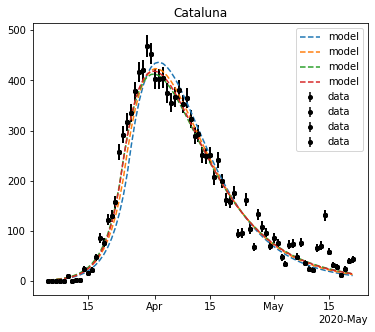

In [245]:
caname = 'Cataluna'
masks = 4 * (('t0', 's1', 'beta', 'gamma', 'phi'),)
dpars = ana_ca(caname, kmasks = masks, verbose = True)
print('dpars :', dpars)
for dpar in dpars: plot_ana_ca(caname, dpar)

 fit  Cataluna  masks  ('t0', 's1', 'beta', 'gamma', 'phi')
 fit  Cataluna  pars0  {'t0': 40, 'beta': 1.4814814814814814, 'gamma': 0.2222222222222222, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065, 'phi': 0.01, 's1': 0.12}
 fit  Cataluna  pars  {'t0': 38.000112023233065, 'beta': 1.4509593041610533, 'gamma': 0.18888560002199276, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.008914341246869444, 's1': 0.08194484428546248, 'chi2': 857.1830810125813}
 fit  Cataluna  masks  ('t0', 's1', 'beta', 'gamma', 'phi')
 fit  Cataluna  pars0  {'t0': 38.000112023233065, 'beta': 1.4509593041610533, 'gamma': 0.18888560002199276, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.008914341246869444, 's1': 0.08194484428546248}
 fit  Cataluna  pars  {'t0': 39.9999746774122, 'beta': 1.4506620004207469, 'gamma': 0.2046959544704939, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.008545618485891505, 's1': 0.08308837119327975, 'chi2': 750.246772418027}
 fit  Cataluna  masks  ('t

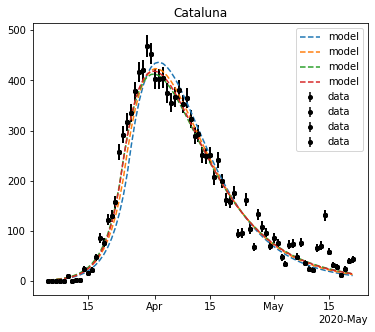

 fit  Cataluna  masks  ('t0', 's1', 'beta', 'gamma')
 fit  Cataluna  pars0  {'t0': 40, 'beta': 1.4814814814814814, 'gamma': 0.2222222222222222, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065, 'phi': 0.01, 's1': 0.12}
 fit  Cataluna  pars  {'t0': 40.55585279557287, 'beta': 1.4192182435243912, 'gamma': 0.21324688920125137, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.071651142609436, 'chi2': 811.5420704108237}
 fit  Cataluna  masks  ('t0', 's1', 'beta', 'gamma')
 fit  Cataluna  pars0  {'t0': 40.55585279557287, 'beta': 1.4192182435243912, 'gamma': 0.21324688920125137, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.071651142609436}
 fit  Cataluna  pars  {'t0': 39.00000031356778, 'beta': 1.4237684957757182, 'gamma': 0.21005054893838526, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.07239482727905018, 'chi2': 789.861909155396}
 fit  Cataluna  masks  ('t0', 's1', 'beta', 'gamma', 'phi')
 fit  Cataluna  pars0  {'t0': 39

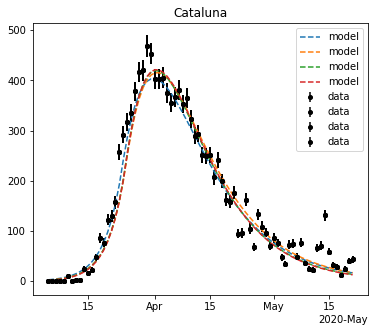

 fit  Cataluna  masks  ('t0', 's1', 'beta', 'gamma')
 fit  Cataluna  pars0  {'t0': 40, 'beta': 1.4814814814814814, 'gamma': 0.2222222222222222, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065, 'phi': 0.01, 's1': 0.12}
 fit  Cataluna  pars  {'t0': 40.55585279557287, 'beta': 1.4192182435243912, 'gamma': 0.21324688920125137, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.071651142609436, 'chi2': 811.5420704108237}
 fit  Cataluna  masks  ('t0', 's1', 'beta', 'gamma')
 fit  Cataluna  pars0  {'t0': 40.55585279557287, 'beta': 1.4192182435243912, 'gamma': 0.21324688920125137, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.071651142609436}
 fit  Cataluna  pars  {'t0': 39.00000031356778, 'beta': 1.4237684957757182, 'gamma': 0.21005054893838526, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.07239482727905018, 'chi2': 789.861909155396}
 fit  Cataluna  masks  ('t0', 's1', 'phi')
 fit  Cataluna  pars0  {'t0': 39.00000031356778, 

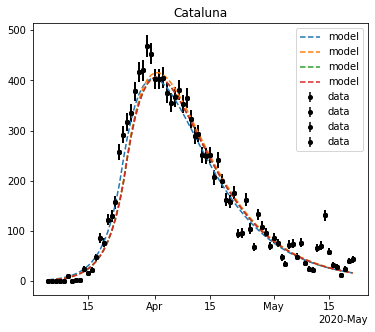

In [248]:
caname = 'Cataluna'
cmasks0 = 4 * (('t0', 's1', 'beta', 'gamma', 'phi'),)
cmasks1 = 2 * (('t0', 's1', 'beta', 'gamma'),) + 2 * (('t0', 's1', 'beta', 'gamma', 'phi'),) 
cmasks2 = 2 * (('t0', 's1', 'beta', 'gamma'),) + 2 * (('t0', 's1', 'phi'),) 

for cmasks in [cmasks0, cmasks1, cmasks2]:
    dpars = ana_ca(caname, kmasks = cmasks, verbose = True)
    print('dpars :', dpars)
    for dpar in dpars: plot_ana_ca(caname, dpar)
    plt.show()

dpars : [{'t0': 40.55585279557287, 'beta': 1.4192182435243912, 'gamma': 0.21324688920125137, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.071651142609436, 'chi2': 811.5420704108237}, {'t0': 39.00000031356778, 'beta': 1.4237684957757182, 'gamma': 0.21005054893838526, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.07239482727905018, 'chi2': 789.861909155396}]


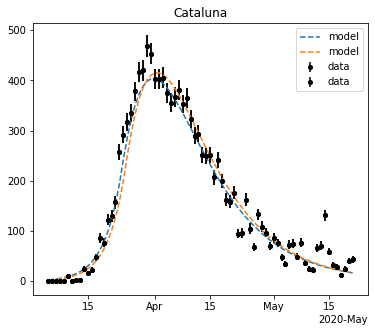

In [200]:
caname = 'Cataluna'
cmasks0 = 2 * (('t0', 's1', 'beta', 'gamma'),)
#cmasks1 = (('t0', 's1', 'beta'), ('t0', 's1', 'gamma'))
# cmasks2 = (('t0', 's1'), ('beta', 'gamma')) discarted

for cmasks in [cmasks0]:
    dpars = ana_ca(caname, kmasks = cmasks, verbose = False)
    print('dpars :', dpars)
    for dpar in dpars: plot_ana_ca(caname, dpar)
    plt.show()

dpars : [{'t0': 40.55585279557287, 'beta': 1.4192182435243912, 'gamma': 0.21324688920125137, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.071651142609436, 'chi2': 811.5420704108237}, {'t0': 39.00000031356778, 'beta': 1.4237684957757182, 'gamma': 0.21005054893838526, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.07239482727905018, 'chi2': 789.861909155396}, {'t0': 39.38180170886868, 'beta': 1.4277869272519155, 'gamma': 0.19922701028802886, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.08054300565466713, 'chi2': 762.8197829518152}, {'t0': 38.48007361388821, 'beta': 1.4595934897777776, 'gamma': 0.19791296013475648, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.08260536958357287, 'chi2': 737.9706410453144}, {'t0': 38.479668470121354, 'beta': 1.4595933885873968, 'gamma': 0.1979128479122405, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.08310648834040713, 'chi2': 737.

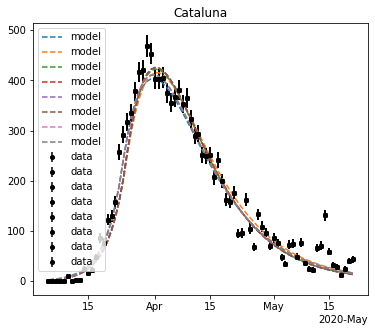

In [204]:
caname = 'Cataluna'
cmasks0 = 8 * (('t0', 's1', 'beta', 'gamma'),)
# cmasks2 = (('t0', 's1'), ('beta', 'gamma')) discarted

for cmasks in [cmasks0,]:
    dpars = ana_ca(caname, kmasks = cmasks, verbose = False)
    print('dpars :', dpars)
    for dpar in dpars: plot_ana_ca(caname, dpar)
    plt.show()

In [205]:
print([dpar['chi2'] for dpar in dpars])
print([dpar['t0'] for dpar in dpars])
print([dpar['s1'] for dpar in dpars])
print([dpar['beta'] for dpar in dpars])
print([dpar['gamma'] for dpar in dpars])

[811.5420704108237, 789.861909155396, 762.8197829518152, 737.9706410453144, 737.9706410310181, 737.970641031007, 717.9734460014156, 717.9734459642509]
[40.55585279557287, 39.00000031356778, 39.38180170886868, 38.48007361388821, 38.479668470121354, 38.479761259394124, 38.22770614914869, 38.22414638536755]
[0.071651142609436, 0.07239482727905018, 0.08054300565466713, 0.08260536958357287, 0.08310648834040713, 0.08419091765855574, 0.07998225025593704, 0.0800042647957927]
[1.4192182435243912, 1.4237684957757182, 1.4277869272519155, 1.4595934897777776, 1.4595933885873968, 1.459593388227606, 1.4846825142642426, 1.4846822263058885]
[0.21324688920125137, 0.21005054893838526, 0.19922701028802886, 0.19791296013475648, 0.1979128479122405, 0.19791285223183047, 0.2104252380068824, 0.21042523289484927]


{'t0': 38.22414638536755, 'beta': 1.4846822263058885, 'gamma': 0.21042523289484927, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009949218749999999, 's1': 0.0800042647957927, 'chi2': 717.6299383772631}
 fit  Cataluna  masks  ('phi',)
 fit  Cataluna  pars0  {'t0': 38.22414638536755, 'beta': 1.4846822263058885, 'gamma': 0.21042523289484927, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009949218749999999, 's1': 0.0800042647957927}
 fit  Cataluna  pars  {'t0': 38.22414638536755, 'beta': 1.4846822263058885, 'gamma': 0.21042523289484927, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009949218749999999, 's1': 0.0800042647957927, 'chi2': 717.6299383772631}
dpars : [{'t0': 38.22414638536755, 'beta': 1.4846822263058885, 'gamma': 0.21042523289484927, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009949218749999999, 's1': 0.0800042647957927, 'chi2': 717.6299383772631}]


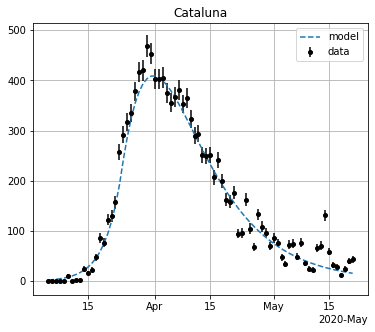

 fit  Cataluna  masks  ('t0', 'phi')
 fit  Cataluna  pars0  {'t0': 38.22414638536755, 'beta': 1.4846822263058885, 'gamma': 0.21042523289484927, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009949218749999999, 's1': 0.0800042647957927}
 fit  Cataluna  pars  {'t0': 38.24307951873822, 'beta': 1.4846822263058885, 'gamma': 0.21042523289484927, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009949447441656172, 's1': 0.0800042647957927, 'chi2': 717.6299313562758}
dpars : [{'t0': 38.24307951873822, 'beta': 1.4846822263058885, 'gamma': 0.21042523289484927, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009949447441656172, 's1': 0.0800042647957927, 'chi2': 717.6299313562758}]


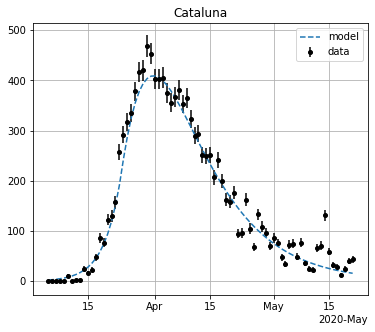

 fit  Cataluna  masks  ('s1', 'phi')
 fit  Cataluna  pars0  {'t0': 38.22414638536755, 'beta': 1.4846822263058885, 'gamma': 0.21042523289484927, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009949218749999999, 's1': 0.0800042647957927}
 fit  Cataluna  pars  {'t0': 38.22414638536755, 'beta': 1.4846822263058885, 'gamma': 0.21042523289484927, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009949483114105852, 's1': 0.07997159942044918, 'chi2': 717.6299315278625}
dpars : [{'t0': 38.22414638536755, 'beta': 1.4846822263058885, 'gamma': 0.21042523289484927, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009949483114105852, 's1': 0.07997159942044918, 'chi2': 717.6299315278625}]


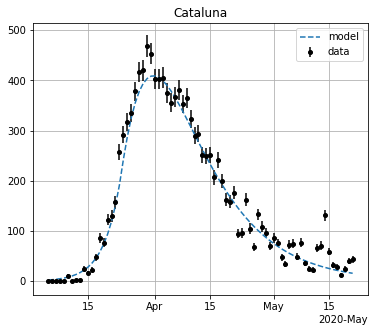

In [219]:
kpars0 = dpars[-1]
print(kpars0)
caname = 'Cataluna'
cmasks0 = (('phi',),)
cmasks1 = (('t0', 'phi'),)
cmasks2 = (('s1', 'phi'),)

for cmasks in [cmasks0, cmasks1, cmasks2]:
    dpars = ana_ca(caname, kpars = kpars0, kmasks = cmasks, verbose = True)
    print('dpars :', dpars)
    for dpar in dpars: plot_ana_ca(caname, dpar)
    plt.show()

IntProgress(value=0, description='fitting...', max=12)

 fit  Madrid  masks  ('t0', 's1', 'beta', 'gamma', 'phi')
 fit  Madrid  pars0  {'t0': 40, 'beta': 1.4814814814814814, 'gamma': 0.2222222222222222, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079, 'phi': 0.01, 's1': 0.12}
 fit  Madrid  pars  {'t0': 41.005364201905394, 'beta': 1.6065472485262575, 'gamma': 0.21575678745394092, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.009302738541703971, 's1': 0.13001267520238102, 'chi2': 491.8527171946159}
 fit  Madrid  masks  ('t0', 's1', 'beta', 'gamma', 'phi')
 fit  Madrid  pars0  {'t0': 41.005364201905394, 'beta': 1.6065472485262575, 'gamma': 0.21575678745394092, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.009302738541703971, 's1': 0.13001267520238102}
 fit  Madrid  pars  {'t0': 41.03967364132515, 'beta': 1.6856657058837374, 'gamma': 0.25195842404361457, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.005884839020825984, 's1': 0.17586827113870215, 'chi2': 480.4311126010089}
 fit  Madrid  masks  ('t0', 's1', '

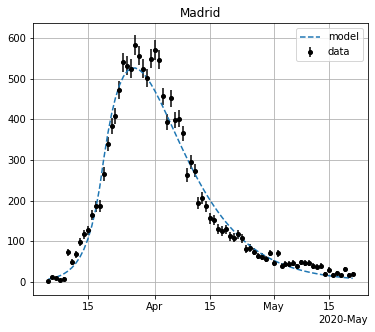

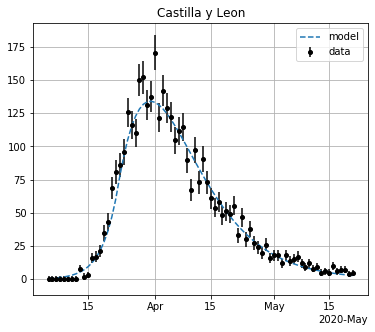

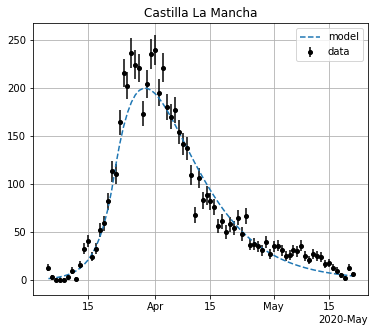

In [250]:
canames1 = ['Madrid', 'Castilla y Leon', 'Castilla La Mancha']
kmasks0 = 4 * (('t0', 's1', 'beta', 'gamma', 'phi'),)
dpars = ana_ccaa(canames1, kmasks = kmasks0, verbose = True)
for caname in canames1:
    plot_ana_ca(caname, dpars[caname][-1])
    plt.show()

IntProgress(value=0, description='fitting...', max=12)

 fit  Madrid  masks  ('t0', 's1', 'beta', 'gamma')
 fit  Madrid  pars0  {'t0': 40, 'beta': 1.4814814814814814, 'gamma': 0.2222222222222222, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079, 'phi': 0.01, 's1': 0.12}
 fit  Madrid  pars  {'t0': 40.18760302704424, 'beta': 1.6344165298517743, 'gamma': 0.21060787553458832, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.11559529791264259, 'chi2': 475.93662335846307}
 fit  Madrid  masks  ('t0', 's1', 'beta', 'gamma')
 fit  Madrid  pars0  {'t0': 40.18760302704424, 'beta': 1.6344165298517743, 'gamma': 0.21060787553458832, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.11559529791264259}
 fit  Madrid  pars  {'t0': 40.1956867436741, 'beta': 1.634416570831625, 'gamma': 0.21060793828072435, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.11559150769793344, 'chi2': 475.9366233552065}
 fit  Madrid  masks  ('t0', 's1', 'beta', 'gamma')
 fit  Madrid  pars0  {'t0': 40.1956867436741, 'be

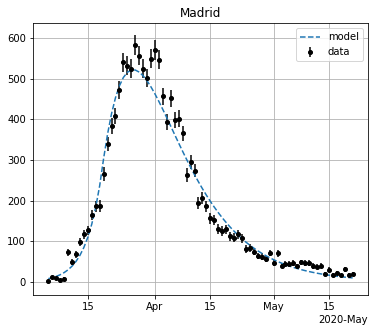

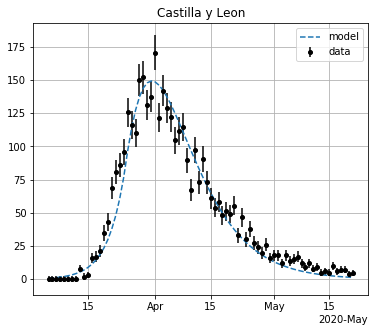

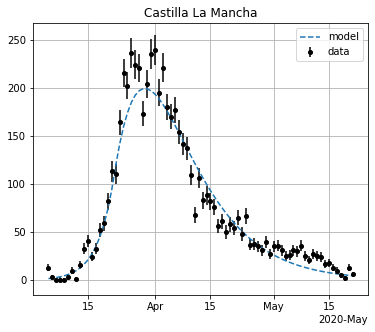

In [253]:
canames1 = ['Madrid', 'Castilla y Leon', 'Castilla La Mancha']
kmasks0 = 2 * (('t0', 's1', 'beta', 'gamma'),) + 2 * (('t0', 's1', 'phi'),)
dpars = ana_ccaa(canames1, kmasks = kmasks0, verbose = True)
for caname in canames1:
    plot_ana_ca(caname, dpars[caname][-1])
    plt.show()

IntProgress(value=0, description='fitting...', max=12)

 fit  Madrid  masks  ('t0', 's1', 'beta', 'gamma')
 fit  Madrid  pars0  {'t0': 40, 'beta': 1.4814814814814814, 'gamma': 0.2222222222222222, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079, 'phi': 0.01, 's1': 0.12}
 fit  Madrid  pars  {'t0': 40.18760302704424, 'beta': 1.6344165298517743, 'gamma': 0.21060787553458832, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.11559529791264259, 'chi2': 475.93662335846307}
 fit  Madrid  masks  ('t0', 's1', 'beta', 'gamma')
 fit  Madrid  pars0  {'t0': 40.18760302704424, 'beta': 1.6344165298517743, 'gamma': 0.21060787553458832, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.11559529791264259}
 fit  Madrid  pars  {'t0': 40.1956867436741, 'beta': 1.634416570831625, 'gamma': 0.21060793828072435, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.11559150769793344, 'chi2': 475.9366233552065}
 fit  Madrid  masks  ('t0', 's1', 'phi')
 fit  Madrid  pars0  {'t0': 40.1956867436741, 'beta': 1.634

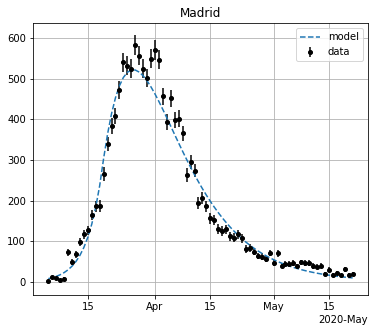

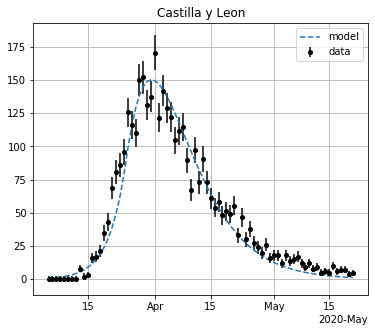

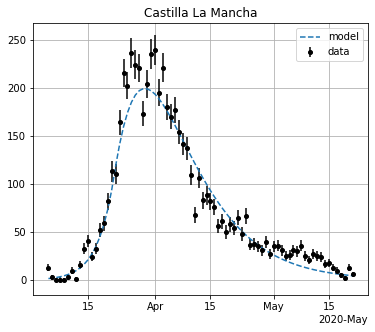

In [254]:
canames1 = ['Madrid', 'Castilla y Leon', 'Castilla La Mancha']
kmasks0 = 2 * (('t0', 's1', 'beta', 'gamma'),) + 2 * (('t0', 's1', 'phi'),)
dpars = ana_ccaa(canames1, kmasks = kmasks0, verbose = True)
for caname in canames1:
    plot_ana_ca(caname, dpars[caname][-1])
    plt.show()

In [228]:
print(dpars)

{'Madrid': [{'t0': 40.18760302704424, 'beta': 1.6344165298517743, 'gamma': 0.21060787553458832, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.11559529791264259, 'chi2': 475.93662335846307}, {'t0': 40.1956867436741, 'beta': 1.634416570831625, 'gamma': 0.21060793828072435, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.11559150769793344, 'chi2': 475.9366233552065}, {'t0': 40.19832997131974, 'beta': 1.6344165703535185, 'gamma': 0.21060794052453374, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.11559031972216816, 'chi2': 475.9366233552046}, {'t0': 40.19832997131974, 'beta': 1.6344165703535185, 'gamma': 0.21060794052453374, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.11559031972216816, 'chi2': 475.9366233552046}], 'Cataluna': [{'t0': 40.55585279557287, 'beta': 1.4192182435243912, 'gamma': 0.21324688920125137, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.071651142609

In [232]:
for caname in canames1:
    print(caname, ' chi2 ', [dpar['chi2'] for dpar in dpars[caname]])

Madrid  chi2  [475.93662335846307, 475.9366233552065, 475.9366233552046, 475.9366233552046]
Cataluna  chi2  [811.5420704108237, 789.861909155396, 762.8197829518152, 737.9706410453144]


In [241]:
kkpars = {}
for caname in canames1: kkpars[caname] = dpars[caname][-1]
canames1 = ['Madrid', 'Cataluna']
kmasks0 =  2 * (('t0', 's1', 'phi', 'beta', 'gamma'),)
dpars = ana_ccaa(canames1, kpars = None, kmasks = kmasks0, verbose = True)

IntProgress(value=0, description='fitting...', max=3)

 fit  Madrid  masks  ('t0', 's1', 'phi', 'beta', 'gamma')
 fit  Madrid  pars0  {'t0': 40.560782558147366, 'beta': 1.6695800068013558, 'gamma': 0.22230230547620927, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.008177785937167486, 's1': 0.11524734958938523}
 fit  Madrid  pars  {'t0': 39.003846057080835, 'beta': 1.7205319920854985, 'gamma': 0.22346112693680087, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.007885795418005815, 's1': 0.11919873945217868, 'chi2': 456.43119539903915}
 fit  Madrid  masks  ('t0', 's1', 'phi', 'beta', 'gamma')
 fit  Madrid  pars0  {'t0': 39.003846057080835, 'beta': 1.7205319920854985, 'gamma': 0.22346112693680087, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.007885795418005815, 's1': 0.11919873945217868}
 fit  Madrid  pars  {'t0': 39.99998762399354, 'beta': 1.7262848806910467, 'gamma': 0.22563777281029268, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.0076447437830320895, 's1': 0.12315483983027939, 'chi2': 45

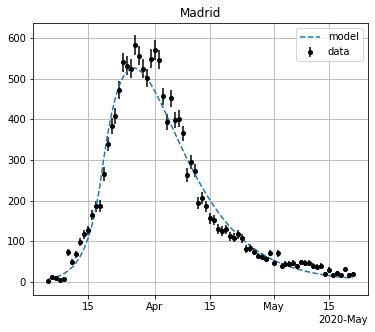

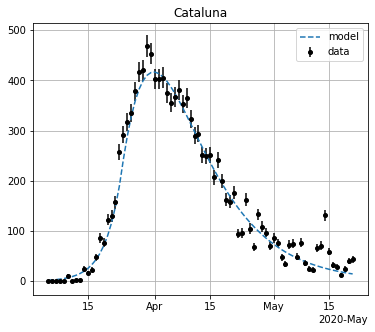

In [243]:
for caname in canames1:
    plot_ana_ca(caname, dpars[caname][-1])
    plt.show()

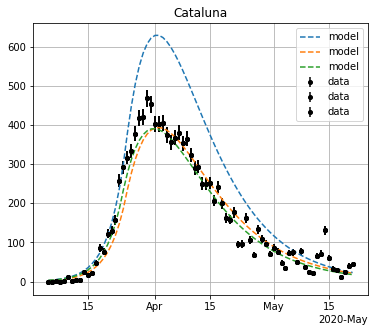

In [181]:
for dpar in dpars: plot_ana_ca(caname, dpar)

In [153]:
canames = ['Madrid', 'Castilla y Leon', 'Castilla La Mancha',
           'Cataluna', 'C. Valenciana', 'Aragon',
           'Pais Vasco', 'Navarra', 'La Rioja',
           'Cantabria', 'Asturias', 'Galicia',
           'Murcia', 'Andalucia', 'Extremadura',
           'Canarias', 'Baleares']

nn = {'Madrid': 6578079, 'Castilla y Leon': 2409164, 'Castilla La Mancha': 2026807, 
      'Cataluna': 7600065, 'C. Valenciana': 4963703, 'Aragon': 1308728, 'Pais Vasco': 2199088, 
      'Navarra': 647554, 'La Rioja': 315675, 'Cantabria': 580229, 'Asturias': 1028244, 
      'Galicia': 2701743, 'Murcia': 1478509, 'Andalucia': 8384408, 'Extremadura': 1072863, 
      'Baleares': 1128908, 'Canarias': 2127685}

TR, TI = 2.7, 4.75

#masks0 =  2  * (('t0', 's1', 'phi'), ('beta', 'gamma'))
masks0 =  2 * (('t0', 's1', 'phi'), ('s1', 'beta', 'gamma')) + ('t0', 's1', 'phi')


def ca_cases(caname):
    """ returns dates, cases of a given autonomous comunity
    """
    dates  = dfv.Date.values
    cases  = dfv[caname].values
    ucases = dfe[caname].values
    
    if (caname == 'Galicia'):
        sel0 = dates == npdate('2020-04-29')
        sel1 = dates == npdate('2020-04-28')
        cases[sel0] = cases[sel1]
        
    return dates, cases, ucases


def kpars0(caname, tr = TR, ti = TI):
    """ returns the default parameters for agive autonomous comunity
    """
        
    n0     = nn[caname]
    phi    = 0.01
    r0, r1 = 4, 0.6
    s1  = 0.05
    if (caname in ('Madrid', 'Cataluna', 'Castilla y Leon', 'Castilla La Mancha')): s1 = 0.12
    if (caname in ('Cantabria', 'Asturias', 'Galicia', 'Murcia', 'Andalucia', 'C. Valenciana',
               'Canarias', 'Baleares')): s1 = 0.02
    
    kpars =  {'t0': 40.0, 'beta': r0/tr, 'gamma': r1/tr, 'tr': tr, 'ti': TI, 
                   'tm': 9., 'n': n0, 'phi': phi, 's1': s1}
    return kpars
    

def ana_ca(caname, kpars = None, kmasks = None):
    """ a sequence of fits (controlled by the list of masks) data of caname community 
        returns a dictoinary with the estimated parameters in each fit in the sequence.
    """
    
    dates, cases, ucases = ca_cases(caname)
    ts                   = np.arange(len(dates))
    
    ikpars  = kpars0(caname) if kpars is None else kpars.copy() 
    if ('chi2' in ikpars.keys()): ikpars.pop('chi2')
    kmasks = kmask if kmask is not None else kmasks0
        
    dpars = []
    for kmask in kmasks:
        kpars, chi2 = usa.useirqm_chi2fit(dates, cases, kpars = ikpars, kmask = kmask)
        ikpars = kpars.copy(); ikpars['chi2'] = chi2
        dpars.append(ikpars)
    return dpars


def ana_ccaa(canames, kpars = None, kmasks = None, bar = True):
    
    if bar:
        nmax = len(canames) * len(kmasks)
        tbar = IntProgress(0, max = nmax + 1, description = 'fitting...'); display(tbar)
        if (bar): tbar.value += 1
     
    dpars = {}
    for caname in canames:
        ikpars = kpars[caname] if kpars is not None else None
        idpars = ana_ca(cananme, ikpars, kmasks)
        dpars[caname] = idpars
        if (bar): tbar.value += 1
    return dpars

def plot_ana_ccaa(canames, dpars):
    
    ncols = 2
    nrows = int(len(canames)/ncols) + int(canames%ncols)
    
    plt.figure(figsize = (6 * ncols, 5 * nrows))
    
    for caname in canames:
        
    return

    
def ana_ca(caname, kpars = None, masks = None):
    """ a sequence of fits (controlled by the list of masks) data of caname community 
        returns a dictoinary with the estimated parameters in each fit in the sequence.
    """
    
    dates, cases, ucases = ca_cases(caname)
    ts                   = np.arange(len(dates))
    
    kpars = kpars0(caname) if kpars is None else kpars 
    if ('chi2' in kpars.keys()): kpars.pop('chi2')
        
    masks = masks0         if masks is None else masks
    chi2  = 0.
    def _dpar(kpars, chi2):
        ikpars = kpars.copy(); ikpars['chi2'] = chi2
        return ikpars
    dpars = []
    for imask in masks:
        if ('chi2' in kpars.keys()): kpars.pop('chi2')
        kpars, chi2 = usa.useirqm_chi2fit(dates, cases, kpars = kpars, kmask = imask)
        ikpars = kpars.copy(); ikpars['chi2'] = chi2
        dpars.append(ikpars)
    return dpars




def ana_ca(caname, kpars = None, masks = None, fit = False):
    
    dates, cases, ucases = ca_cases(caname)
    ts                   = np.arange(len(dates))
    
    kpars = kpars0(caname) if kpars is None else kpars 
    if ('chi2' in kpars.keys()): kpars.pop('chi2')
        
    masks = masks0         if masks is None else masks
    chi2 = 0.
    if (fit):
        #tbar = IntProgress(0, max = len(masks), description = caname); display(tbar)
        for imask in masks:
            #tbar.value += 1
            kpars, chi2 = usa.useirqm_chi2fit(dates, cases, kpars = kpars, kmask = imask)
            #print(caname, 'chi2 : ', chi2, ', kpars: ', kpars, ', mask ', imask)
    fmodel      = usa.useirqm_fmodel(kpars = kpars)
    usa.plot_data_model(dates, cases, fmodel)
    plt.title(caname)
    return kpars, chi2


def ana_capars(canames = canames, capars = {}, masks = masks0, fit = False, ofilename = None):
    
    ncols, nrows = 3, int(len(canames)/3)
    if (len(canames) % 3 != 0): nrows += 1

    plt.figure(figsize = (ncols * 6, nrows * 5))
    
     
    tbar = IntProgress(0, max = len(canames), description = 'fit'); display(tbar)
       
    capars2, cachi2 = {}, {}
    for i, caname in enumerate(canames):
        ax    = plt.subplot(nrows, ncols, i + 1, axisbelow=True)
        kpars = capars[caname] if caname in capars.keys() else None
        #print(caname, masks, kpars)
        pars, chi2 = ana_ca(caname, kpars = kpars, masks = masks, fit = fit)
        tbar.value += 1
        capars2[caname] = pars
        cachi2 [caname] = chi2
        if (ofilename is not None): write_pars(caname, pars, chi2, ofilename)
        plt.title(caname)
    plt.tight_layout()
       
    return capars2, cachi2

def plot_capars(capars, cachi2, canames = None):
    
    canames = capars.keys() if canames is None else canames
    
    trs    = npa([capars[caname]['tr']    for caname in canames])
    betas  = npa([capars[caname]['beta']  for caname in canames])
    gammas = npa([capars[caname]['gamma'] for caname in canames])

    phis = npa([capars[caname]['phi'] for caname in canames])
    s1s  = npa([capars[caname]['s1']  for caname in canames])
    t0s  = npa([capars[caname]['t0']  for caname in canames])

    plt.figure(figsize = (8, 5))
    plt.plot(trs, ls = '', marker = '*', label = r'$T_R$');
    plt.plot(trs * betas, ls = '', marker = 'o', label = r'$R_0$');
    plt.plot(trs * gammas, ls = '', marker = '^', label = r'$R_1$');
    plt.legend(); plt.grid()
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    
    plt.figure(figsize = (8, 5))
    plt.plot(100 * s1s , ls = '', marker = '^', label = r'$s_1$');
    plt.plot(100 * phis, ls = '', marker = '^', label = r'$\phi_m$');
    plt.legend(); plt.grid();
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    
    plt.figure(figsize = (8, 5))
    plt.plot(t0s, ls = '', marker = '^', label = r'$t_0$');
    plt.legend(); plt.grid();
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    
    chis  = npa([cachi2[caname] for caname in canames])
    
    plt.figure(figsize = (8, 5))
    plt.plot(chi2, ls = '', marker = '^', label = r'$\chi^2$');
    plt.legend(); plt.grid();
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    return

def write_pars(caname, pars, chi2, ofilename):        
    f = open(ofilename, 'a') if ofilename is not None else None
    ss = str(caname)+', '+str(pars)+', '+str(chi2)+'\n'
    f.write(ss)
    f.close()
   
def to_df(kpars, kchi2):
    for key in kpars.keys():
        kpars[key]['chi2'] = kchi2[key]
    return pd.DataFrame(kpars)


Procedure:
    - run n-times (2) the initial masks:  (('t0', 's1', 'beta'), ('t0', 'phi', 'gamma')) 
    - run n-times (1) the refine massks: (('t0', 's1', 'phi'), ('beta', 'gamma') with initial s1 10% phi 1%

In [95]:
print({'t0': 38.4350458322709, 'beta': 1.4945648479851232, 'gamma': 0.20221056386927833, 
       'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.008129683834740938, 's1': 0.11053877506842705}, 729.6805356934162)

{'t0': 38.4350458322709, 'beta': 1.4945648479851232, 'gamma': 0.20221056386927833, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.008129683834740938, 's1': 0.11053877506842705} 729.6805356934162


(('t0', 's1', 'phi'), ('beta', 'gamma'))
{'t0': 38.4350458322709, 'beta': 1.4945648479851232, 'gamma': 0.20221056386927833, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.008129683834740938, 's1': 0.11053877506842705}
chis [729.6805356934162]


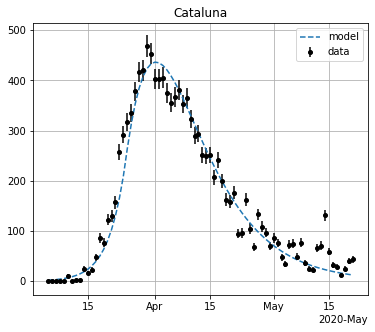

In [99]:
fit    = True
caname = 'Cataluna'
#masks0 =   (('t0', 's1') , ('beta', 'gamma'), ('t0', 'phi'))
#masks1 =   (('t0', 's1', 'beta'), ('t0', 'phi', 'gamma'))
masks2 =   1 * (('t0', 's1', 'phi'), ('beta', 'gamma'))
kpars, kchi2 = [], []
for imasks in [masks2,]:
    print(imasks)
    ikpars, ichi2 = ana_ca(caname, masks = imasks, fit = fit)
    kpars.append(ikpars.copy()); kchi2.append(ichi2)
    print(ikpars)
print('chis', kchi2)

IntProgress(value=0, description='fit', max=17)

Madrid {'t0': 40.6631717631003, 'beta': 1.5661995670268805, 'gamma': 0.18622613570230911, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.12, 'chi2': 0.0}
Castilla y Leon {'t0': 32.66622553582464, 'beta': 1.413767144021723, 'gamma': 0.16803306349835717, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 2409164.0, 'phi': 0.01, 's1': 0.12, 'chi2': 0.0}
Castilla La Mancha {'t0': 35.583008607563954, 'beta': 1.505713108477026, 'gamma': 0.20372946998745708, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 2026807.0, 'phi': 0.01, 's1': 0.12, 'chi2': 0.0}
Cataluna {'t0': 37.557781458118015, 'beta': 1.4948226070499842, 'gamma': 0.19756720386818188, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.12, 'chi2': 0.0}
C. Valenciana {'t0': 34.00043666729813, 'beta': 1.3500258329975496, 'gamma': 0.15235947218901752, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 4963703.0, 'phi': 0.01, 's1': 0.02, 'chi2': 0.0}
Aragon {'t0': 27.441067728142166, 'beta': 1.2175582655593709, 'gamma': 0.161

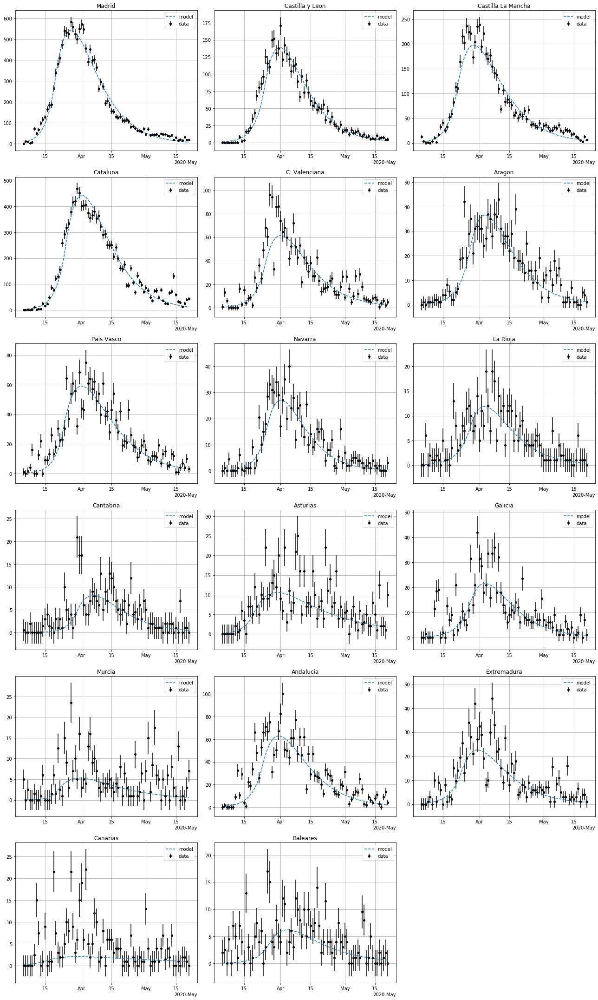

In [110]:
file_tail = '200618_1830'
fit       = True
masks0    =  (('t0', 's1', 'phi'), ('beta', 'gamma'))
capars1, cachi21 = ana_capars(canames = canames, masks = masks0, fit = fit, ofilename = 'capars_'+file_tail+'.txt')
dfpars1   = to_df(capars1, cachi21)

In [111]:
print(dfpars1)

             Madrid  Castilla y Leon  Castilla La Mancha      Cataluna  \
beta   1.560917e+00     1.407901e+00        1.500076e+00  1.492892e+00   
chi2   4.698061e+02     2.246124e+02        4.327663e+02  7.488554e+02   
gamma  1.950473e-01     1.804043e-01        2.131153e-01  2.095527e-01   
n      6.578079e+06     2.409164e+06        2.026807e+06  7.600065e+06   
phi    1.035804e-02     8.254679e-03        1.189906e-02  6.734585e-03   
s1     1.169176e-01     1.109560e-01        1.096599e-01  1.356657e-01   
t0     4.128395e+01     3.647067e+01        3.603051e+01  3.921501e+01   
ti     4.750000e+00     4.750000e+00        4.750000e+00  4.750000e+00   
tm     9.000000e+00     9.000000e+00        9.000000e+00  9.000000e+00   
tr     2.700000e+00     2.700000e+00        2.700000e+00  2.700000e+00   

       C. Valenciana        Aragon    Pais Vasco        Navarra  \
beta    1.334698e+00  1.212590e+00  1.549857e+00       1.371768   
chi2    3.435923e+02  1.681269e+02  2.446241e+02   

IntProgress(value=0, description='fit', max=17)

Madrid {'t0': 40.6631717631003, 'beta': 1.5661995670268805, 'gamma': 0.18622613570230911, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.12}
Castilla y Leon {'t0': 32.66622553582464, 'beta': 1.413767144021723, 'gamma': 0.16803306349835717, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 2409164.0, 'phi': 0.01, 's1': 0.12}
Castilla La Mancha {'t0': 35.583008607563954, 'beta': 1.505713108477026, 'gamma': 0.20372946998745708, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 2026807.0, 'phi': 0.01, 's1': 0.12}
Cataluna {'t0': 37.557781458118015, 'beta': 1.4948226070499842, 'gamma': 0.19756720386818188, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.12}
C. Valenciana {'t0': 34.00043666729813, 'beta': 1.3500258329975496, 'gamma': 0.15235947218901752, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 4963703.0, 'phi': 0.01, 's1': 0.02}
Aragon {'t0': 27.441067728142166, 'beta': 1.2175582655593709, 'gamma': 0.1617444757352847, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 1308728.0, 

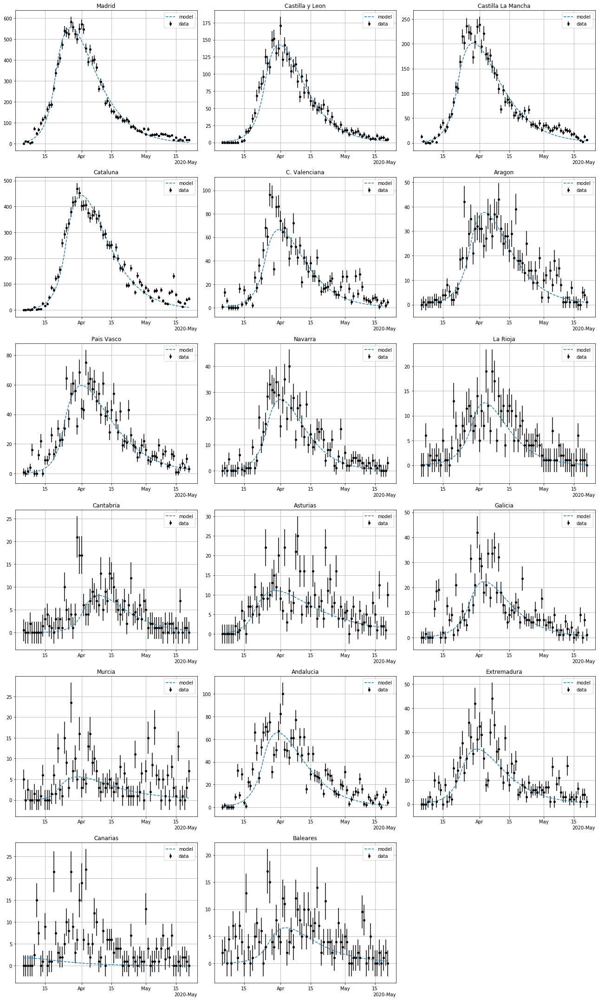

In [112]:
file_tail = '200618_1830'
fit       = True
masks0    =  (('t0', 's1', 'phi'),)
capars1, cachi21 = ana_capars(canames = canames, masks = masks0, fit = fit, ofilename = 'capars_'+file_tail+'.txt')
dfpars1   = to_df(capars1, cachi21)

In [113]:
print(dfpars1)

             Madrid  Castilla y Leon  Castilla La Mancha      Cataluna  \
beta   1.566200e+00     1.413767e+00        1.505713e+00  1.494823e+00   
chi2   4.860553e+02     2.312276e+02        4.396020e+02  7.818460e+02   
gamma  1.862261e-01     1.680331e-01        2.037295e-01  1.975672e-01   
n      6.578079e+06     2.409164e+06        2.026807e+06  7.600065e+06   
phi    1.035804e-02     8.254679e-03        1.189906e-02  6.734585e-03   
s1     1.169176e-01     1.109560e-01        1.096599e-01  1.356657e-01   
t0     4.128395e+01     3.647067e+01        3.603051e+01  3.921501e+01   
ti     4.750000e+00     4.750000e+00        4.750000e+00  4.750000e+00   
tm     9.000000e+00     9.000000e+00        9.000000e+00  9.000000e+00   
tr     2.700000e+00     2.700000e+00        2.700000e+00  2.700000e+00   

       C. Valenciana        Aragon    Pais Vasco        Navarra  \
beta    1.350026e+00  1.217558e+00  1.551436e+00       1.374294   
chi2    3.651661e+02  1.705838e+02  2.447785e+02   

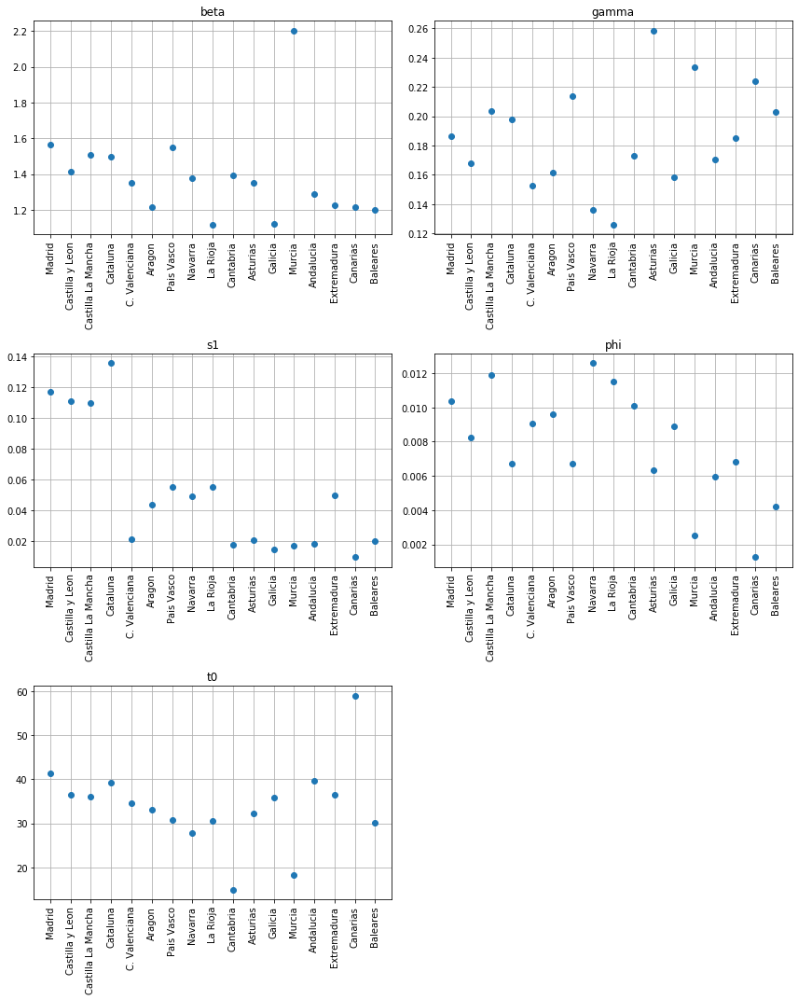

In [152]:
val = dfpars1.loc['s1']

nrows, ncols = 3, 2
plt.figure(figsize = (6 * ncols, 5 * nrows))

for i, name in enumerate(['beta', 'gamma', 's1', 'phi', 't0']):
    plt.subplot(nrows, ncols, i + 1)
    val = dfpars1.loc[name]
    plt.plot(val.keys(), val.values, ls = '', marker = 'o');  
    plt.xticks(rotation = 'vertical'); plt.grid(); plt.title(name)
    val = dfpars1.loc['s1']
plt.tight_layout()

(Index(['Madrid', 'Castilla y Leon', 'Castilla La Mancha', 'Cataluna',
        'C. Valenciana', 'Aragon', 'Pais Vasco', 'Navarra', 'La Rioja',
        'Cantabria', 'Asturias', 'Galicia', 'Murcia', 'Andalucia',
        'Extremadura', 'Canarias', 'Baleares'],
       dtype='object'),
 array([0.01035804, 0.00825468, 0.01189906, 0.00673458, 0.00907035,
        0.00963047, 0.00669439, 0.0125914 , 0.01151296, 0.01007017,
        0.00633575, 0.00888979, 0.00249527, 0.00592706, 0.00681209,
        0.00126011, 0.00420412]))

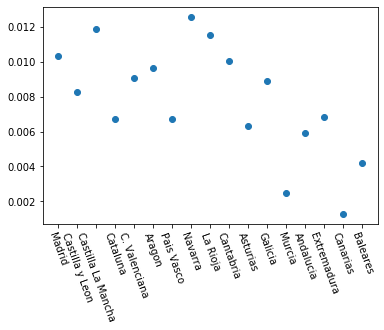

In [144]:
val = dfpars1.loc['phi']
plt.plot(val.keys(), val.values, ls = '', marker = 'o'); plt.xticks(rotation = '-70')
val.keys(), val.values

### Select masks!

#### first pass

(('t0', 's1', 'phi'), ('s1', 'beta', 'gamma'), ('t0', 's1', 'phi'), ('s1', 'beta', 'gamma'))
{'t0': 41.326048683846835, 'beta': 1.4725396533099606, 'gamma': 0.24331173813932383, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.005559266944499562, 's1': 0.12095129720894368, 'chi2': 770.9645359080334}
(('t0', 's1', 'beta'), ('t0', 'phi', 'gamma'), ('t0', 's1', 'beta'), ('t0', 'phi', 'gamma'))
{'t0': 38.30770799897615, 'beta': 1.4654649992314017, 'gamma': 0.19331139392927726, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009999954622151742, 's1': 0.09140534137274103, 'chi2': 747.9610544197975}
(('t0', 's1'), ('s1', 'beta'), ('phi', 'gamma'), ('t0', 's1'), ('s1', 'beta'), ('phi', 'gamma'))
{'t0': 39.974999999999994, 'beta': 1.41113315915189, 'gamma': 0.21551760787278468, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.014722749330730426, 's1': 0.040858930823729774, 'chi2': 993.2837409850318}


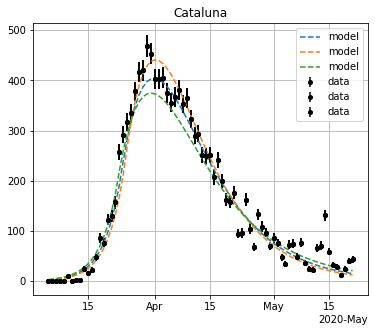

In [9]:
fit    = True
caname = 'Cataluna'
masks0 =  2 * (('t0', 's1', 'phi') , ('s1', 'beta', 'gamma'))
masks1 =  2 * (('t0', 's1', 'beta'), ('t0', 'phi', 'gamma'))
masks2 =  2 * (('t0', 's1'), ('s1', 'beta'), ('phi', 'gamma'))
kpars = []
for imasks in [masks0, masks1, masks2]:
    print(imasks)
    ikpars, ichi2 = ana_ca(caname, masks = imasks, fit = fit)
    ikpars['chi2'] = ichi2; kpars.append(ikpars.copy())
    print(ikpars)

In [12]:
kpars0 = kpars[1]
print(kpars0)
kpars0.pop('chi2')

{'t0': 38.30770799897615, 'beta': 1.4654649992314017, 'gamma': 0.19331139392927726, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009999954622151742, 's1': 0.09140534137274103, 'chi2': 747.9610544197975}


747.9610544197975

Define initial masks:

- initial mask: 2 * (('t0', 's1', 'beta'), ('t0', 'phi', 'gamma'))

#### second pass

{'t0': 38.30770799897615, 'beta': 1.4654649992314017, 'gamma': 0.19331139392927726, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009999954622151742, 's1': 0.09140534137274103}
mle: warning
741.3014545108731 {'t0': 38.378824086492735, 'beta': 1.4654649992314017, 'gamma': 0.19331139392927726, 'tr': 2.6999999999715185, 'ti': 4.769112593680619, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009999954622151742, 's1': 0.08747934113723985}
747.9610544197975 {'t0': 38.30770799897615, 'beta': 1.4654649992314017, 'gamma': 0.19331139392927726, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009999954622151742, 's1': 0.09140534137274103}
747.9610544197975 {'t0': 38.30770799897615, 'beta': 1.4654649992314017, 'gamma': 0.19331139392927726, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009999954622151742, 's1': 0.09140534137274103}


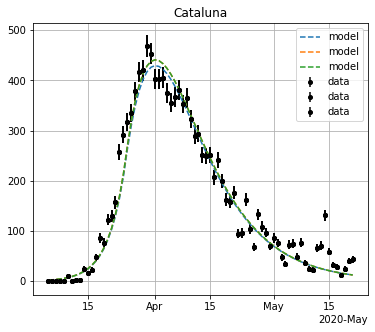

In [13]:
fit    = True
caname = 'Cataluna'
kpars1 = {'t0': 38.30770799897615, 'beta': 1.4654649992314017, 'gamma': 0.19331139392927726, 
          'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009999954622151742, 's1': 0.09140534137274103}
print(kpars1)

fit    = False
caname = 'Cataluna'
masks0 = (('t0', 'tr'), ('s1' , 'ti'))
masks1 = (('t0', 'ti'), ('s1', 'tr'))
masks1 = (('tr', 'ti'), ('s1' , 't0'))
kkpars = []
for imasks in [masks0, masks1, masks2]:
    ikpars, ichi2 = ana_ca(caname, kpars = kpars1, masks = imasks, fit = True)
    kpars.append(ikpars.copy())
    print(ichi2, ikpars)

- Small differences, prefer no masks or masks0 = (('t0', 'tr'), ('s1' , 'ti'))

### One or two passes? Madrid - Cataluna

IntProgress(value=0, description='fit', max=2)

{'Madrid': 463.86779307213226, 'Cataluna': 787.0386291463191}
{'Madrid': {'t0': 40.72673597057974, 'beta': 1.5662231253702616, 'gamma': 0.18623099778370378, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.012574238993529878, 's1': 0.10172661955555659}, 'Cataluna': {'t0': 38.69078672514735, 'beta': 1.4724461133388576, 'gamma': 0.18752437835950114, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009999999792689136, 's1': 0.09597977104249052}}


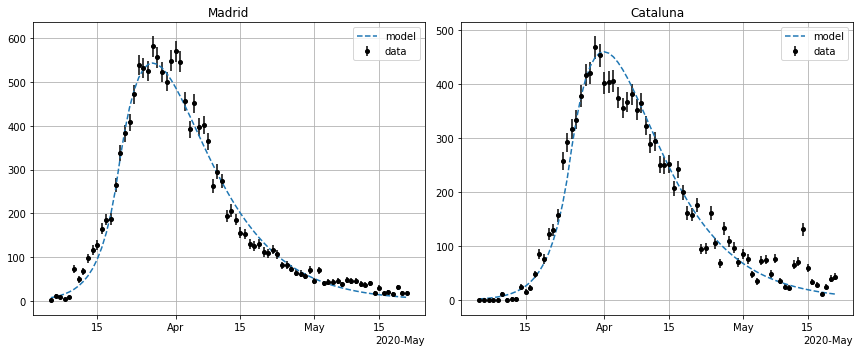

In [19]:
fit      = True
masks0   =  (('t0', 's1', 'beta'), ('t0', 'phi', 'gamma'))
canames1 = ['Madrid', 'Cataluna']
capars1, cachi21 = ana_capars(canames = canames1, masks = masks0, fit = fit, ofilename = 'temp.txt')
print(cachi21)
print(capars1)

IntProgress(value=0, description='fit', max=2)

{'Madrid': 463.8676648554682, 'Cataluna': 747.9610544197975}
{'Madrid': {'t0': 40.69485997879238, 'beta': 1.566211281064442, 'gamma': 0.18622854793669258, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.012575114255953937, 's1': 0.10180904224837362}, 'Cataluna': {'t0': 38.30770799897615, 'beta': 1.4654649992314017, 'gamma': 0.19331139392927726, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009999954622151742, 's1': 0.09140534137274103}}


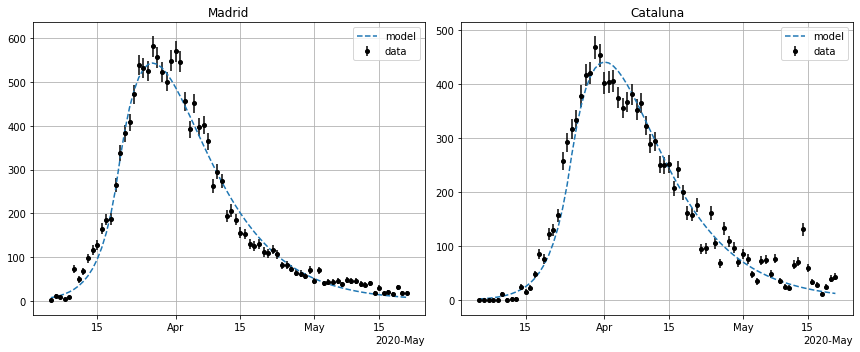

In [21]:
fit      = True
canames1 = ['Madrid', 'Cataluna']
capars1, cachi21 = ana_capars(canames = canames1, capars = capars1, masks = masks0, fit = fit, ofilename = 'temp.txt')
print(cachi21)
print(capars1)

IntProgress(value=0, description='fit', max=2)

mle: warning
{'Madrid': 463.86717075314857, 'Cataluna': 741.3014545108731}
{'Madrid': {'t0': 40.64362041047826, 'beta': 1.566211281064442, 'gamma': 0.18622854793669258, 'tr': 2.7001039655492143, 'ti': 4.750060684117489, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.012575114255953937, 's1': 0.10185301791693124}, 'Cataluna': {'t0': 38.378824086492735, 'beta': 1.4654649992314017, 'gamma': 0.19331139392927726, 'tr': 2.6999999999715185, 'ti': 4.769112593680619, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.009999954622151742, 's1': 0.08747934113723985}}


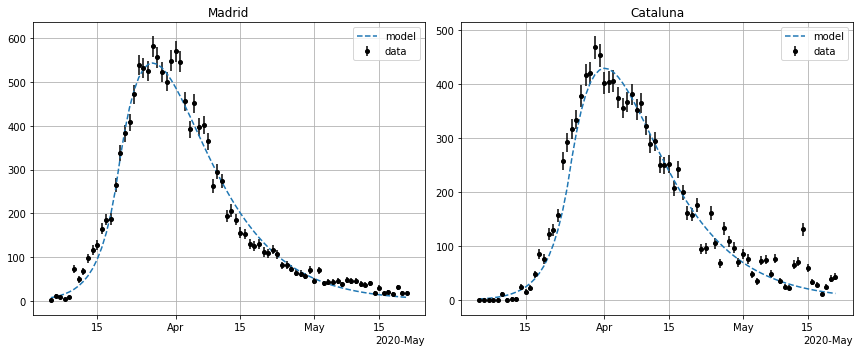

In [25]:
fit      = True
masks1    = (('t0', 'tr'), ('s1' , 'ti'))
canames1  = ['Madrid', 'Cataluna']
capars2, cachi22 = ana_capars(canames = canames1, masks = masks1, capars = capars1, fit = fit, ofilename = 'temp.txt')
print(cachi22)
print(capars2)

Partial conclusions:
    
   - first  masks: one pass is good enough, second pass minor improvement
   - second masks: improves a little bit

### Fit comunities

#### first masks: one pass

IntProgress(value=0, description='fit', max=17)

NameError: name 'cachi2' is not defined

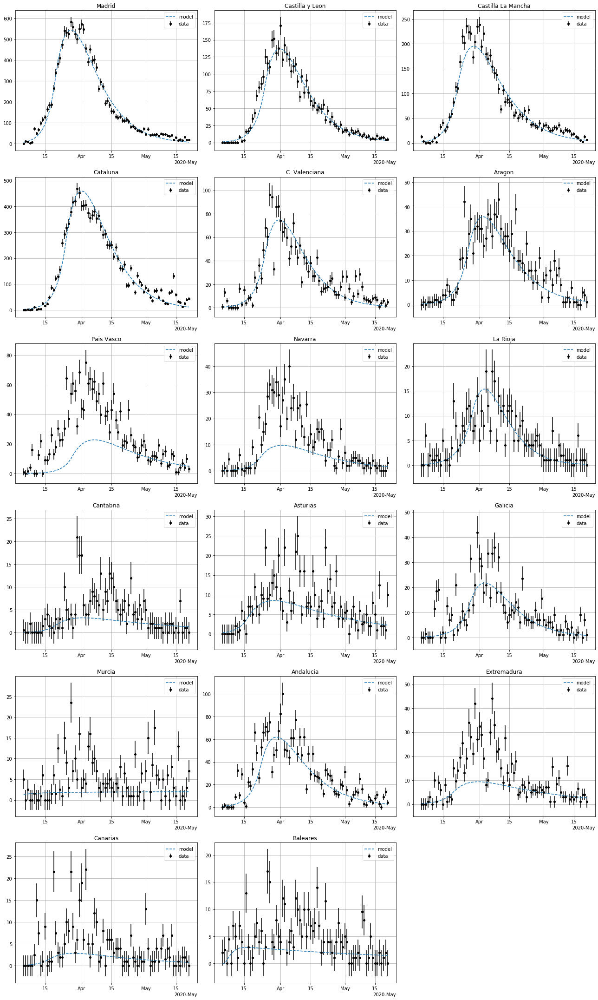

In [27]:
file_tail = '_200618_1600'
fit       = True
masks0    =  (('t0', 's1', 'beta'), ('t0', 'phi', 'gamma'))
capars1, cachi21 = ana_capars(canames = canames, masks = masks0, fit = True, ofilename = 'capars_'+file_tail+'.txt')
dfpars1   = to_df(capars1, cachi21)

In [32]:
dfpars1   = to_df(capars1, cachi21)
for key in capars1.keys(): capars1[key].pop('chi2')

IntProgress(value=0, description='fit', max=17)

mle: warning


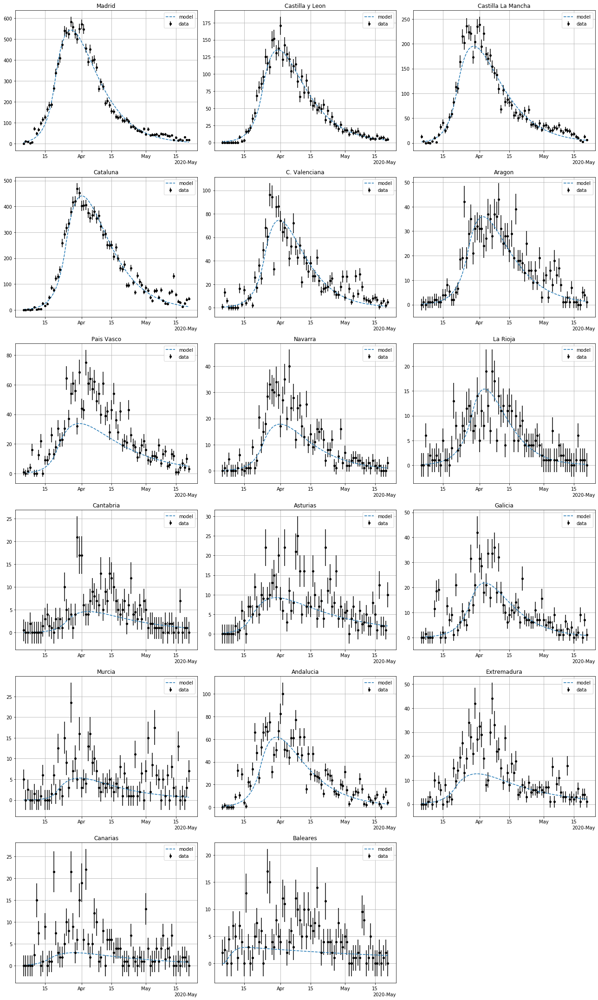

In [33]:
capars1b, cachi21b = ana_capars(canames = canames, masks = masks0, capars = capars1,
                                fit = True, ofilename = 'capars_' + file_tail +'.txt')
dfpars1b = to_df(capars1b, cachi21b)

In [35]:
print(cachi21b)
for key in capars1b.keys(): capars1b[key].pop('chi2')

{'Madrid': 463.8676648554682, 'Castilla y Leon': 198.64372799676886, 'Castilla La Mancha': 439.7639381416304, 'Cataluna': 747.9610544197975, 'C. Valenciana': 389.9698048427501, 'Aragon': 169.69609830425262, 'Pais Vasco': 450.7766005025405, 'Navarra': 205.2638361585274, 'La Rioja': 132.31042472021264, 'Cantabria': 134.8744415308232, 'Asturias': 180.8886153229803, 'Galicia': 222.0534739571537, 'Murcia': 205.3942715251, 'Andalucia': 454.8916398024389, 'Extremadura': 299.7712453029281, 'Canarias': 215.05048096415908, 'Baleares': 220.34777164176316}


IntProgress(value=0, description='fit', max=17)

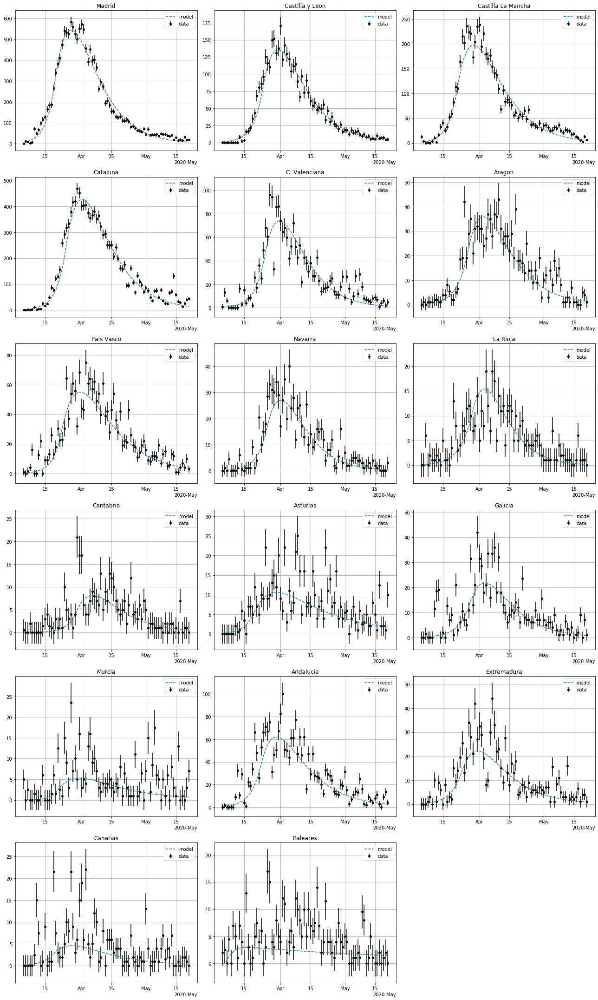

In [36]:
capars1c, cachi21c = ana_capars(canames = canames, masks = masks0, capars = capars1b,
                                fit = True, ofilename = 'capars_' + file_tail +'.txt')
dfpars1c = to_df(capars1c, cachi21c)

In [47]:
print(cachi21c)
#for key in capars1c.keys(): capars1c[key].pop('chi2')
for key in capars1c.keys(): capars1c[key]['phi'] = 0.01
for key in capars1c.keys(): capars1c[key]['s1']  = 0.10

{'Madrid': 463.86753831205107, 'Castilla y Leon': 198.41293218500144, 'Castilla La Mancha': 422.40872960143696, 'Cataluna': 717.5746527858033, 'C. Valenciana': 385.41326584224754, 'Aragon': 169.68828996486408, 'Pais Vasco': 249.91768160469294, 'Navarra': 155.01169391957703, 'La Rioja': 132.28956158198633, 'Cantabria': 108.18145818906086, 'Asturias': 177.49643481698982, 'Galicia': 222.05343237826196, 'Murcia': 205.3934897169686, 'Andalucia': 454.83633267528205, 'Extremadura': 233.26723632399293, 'Canarias': 203.9573963092863, 'Baleares': 220.34777164176313}


In [48]:
print(capars1c['Murcia'])

{'t0': 12.48935511660366, 'beta': 2.2023881801480085, 'gamma': 0.23365103604671206, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 1478509.0, 'phi': 0.01, 's1': 0.1}


### Refine: force phi = 1%

IntProgress(value=0, description='fit', max=2)

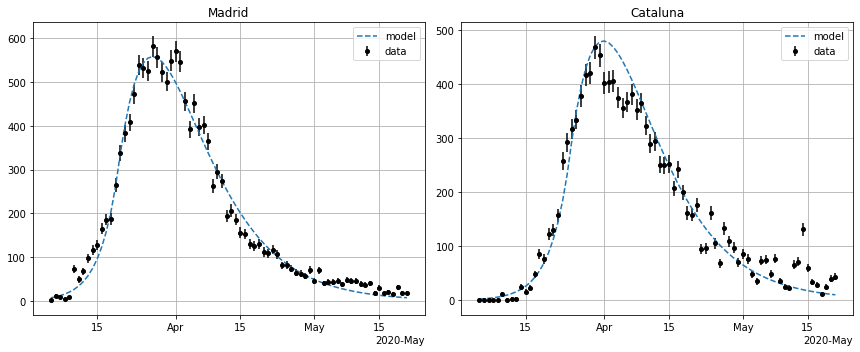

In [49]:
file_tail = '_200618_1600'
fit       = True
masks0    =  (('t0', 's1', 'beta'), ('t0', 'gamma'))
capars1, cachi21 = ana_capars(canames = canames1, masks = masks0, 
                              capars = capars1c, fit = True, ofilename = 'capars_'+file_tail+'.txt')
dfpars1   = to_df(capars1, cachi21)

In [52]:
print(dfpars1)
#for key in capars1b.keys(): capars1c[key].pop('chi2')

             Madrid      Cataluna
beta   1.609835e+00  1.512655e+00
chi2   4.716315e+02  8.267463e+02
gamma  1.922680e-01  1.806510e-01
n      6.578079e+06  7.600065e+06
phi    1.000000e-02  1.000000e-02
s1     1.065100e-01  1.004552e-01
t0     4.044578e+01  3.742443e+01
ti     4.750000e+00  4.750000e+00
tm     9.000000e+00  9.000000e+00
tr     2.700000e+00  2.700000e+00


770.9645359080334 {'t0': 41.326048683846835, 'beta': 1.4725396533099606, 'gamma': 0.24331173813932383, 'tr': 2.7, 'ti': 4.75, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.005559266944499562, 's1': 0.12095129720894368}


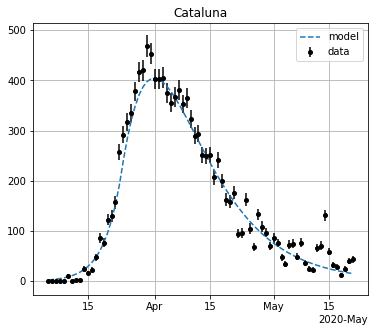

In [14]:
masks = (('t0', 'tr'), ('s1', 'beta'), ('phi', 'gamma'))
kpars, chi2 = ana_ca('Cataluna', fit = True)
print(chi2, kpars)

IntProgress(value=0, description='fit', max=2)

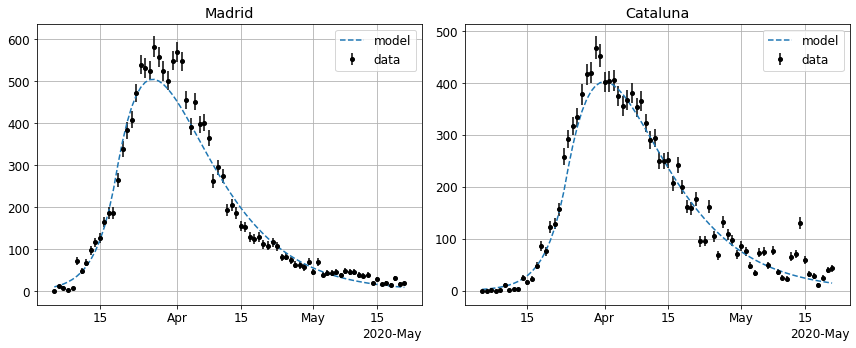

In [161]:
canames1 = ['Madrid', 'Cataluna']
capars, cachi2 = ana_capars(canames = canames1, masks = masks0, fit = True, ofilename = 'temp.txt')

IntProgress(value=0, description='fit', max=2)

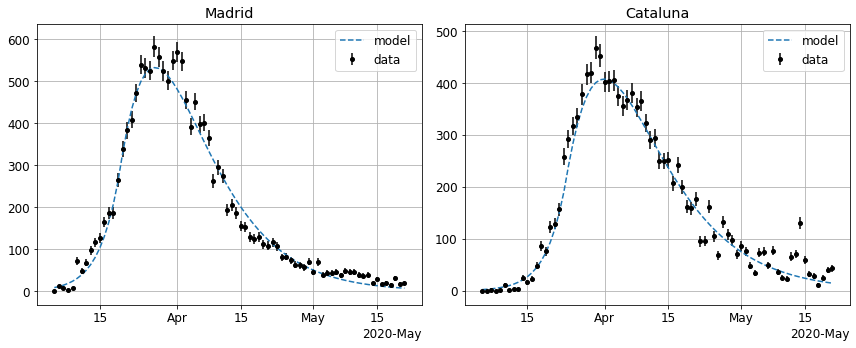

In [163]:
masks   = (('t0', 'tr'), ('s1', 'beta'), ('phi', 'gamma'))
#masks = (('t0', 'tr'), ('s1', 'beta'), ('phi', 'gamma'))
capars, cachi2 = ana_capars(masks = masks, canames = canames1, capars = capars, fit = True, ofilename = 'temp.txt')

In [164]:
print(capars)

{'Madrid': {'t0': 45.776654083274394, 'beta': 1.541266729545211, 'gamma': 0.21828584524075678, 'tr': 2.702408426264885, 'ti': 5.0, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.006817867253283662, 's1': 0.15988309401948006}, 'Cataluna': {'t0': 40.48524332583922, 'beta': 1.5280468815603725, 'gamma': 0.23025910109678766, 'tr': 2.905305898213926, 'ti': 5.0, 'tm': 9.0, 'n': 7600065.0, 'phi': 0.004817277195243981, 's1': 0.1455748599450376}}


IntProgress(value=0, description='fit', max=2)

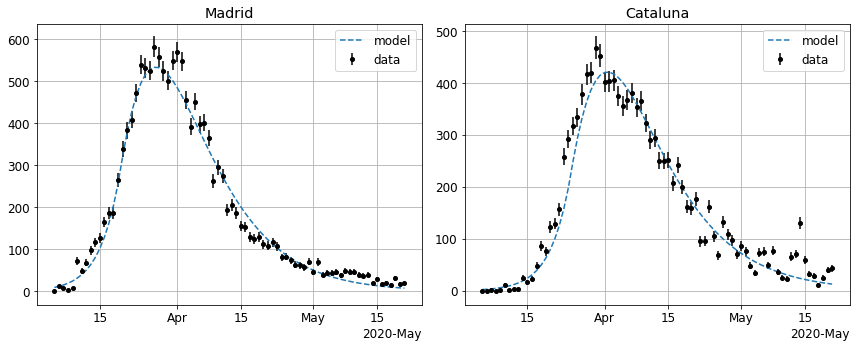

In [123]:
masks   = (('beta', 'tr', 's1'), ('gamma', 'tr', 'phi'), ('t0',))
capars, cachi2 = ana_capars(masks = masks, canames = canames1, capars = capars, 
                            fit = True, ofilename = 'temp.txt')

In [133]:
dfpars = to_df(capars, cachi2)
dfpars.head()

,Madrid,Cataluna
beta,1.835971e+00,1.745625e+00
chi2,6.784924e+00,1.016243e+01
gamma,2.393538e-01,2.293622e-01
n,6.578079e+06,7.600065e+06
phi,9.363197e-03,7.833393e-03


In [ ]:
### Fit to all comunites

IntProgress(value=0, description='fit', max=17)

IntProgress(value=0, description='fit', max=17)

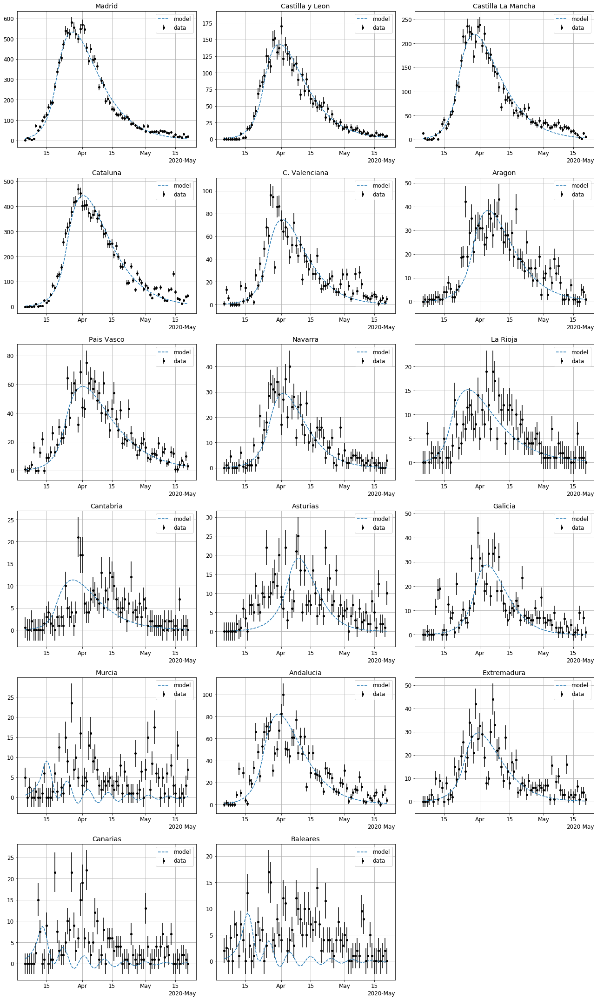

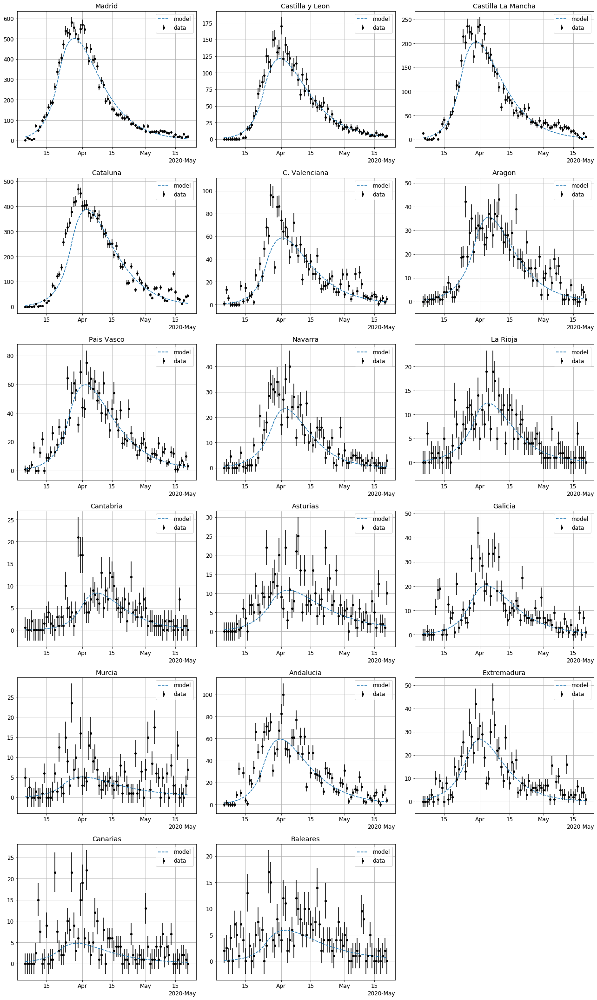

In [134]:
capars, cachi2 = ana_capars(canames = canames, fit = True, ofilename = 'capars_200618_1530.txt')
masks = (('t0', 'tr'), ('s1', 'beta'), ('phi', 'gamma'))
capars, cachi2 = ana_capars(canames = canames, masks = masks, fit = True, ofilename = 'capars_200618_1530.txt')
dfpars = to_df(capars, cachi2)

IntProgress(value=0, description='fit', max=17)

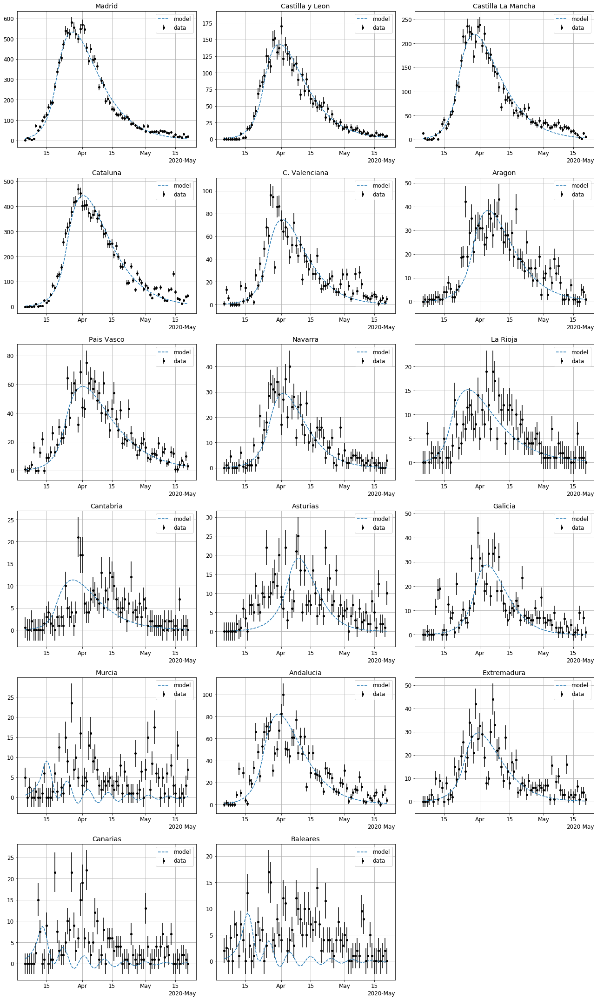

In [136]:
ofilename = 'capars_200611_2130.txt'
capars, cachi2 = ana_capars(canames = canames, fit = True, ofilename = ofilename)
dfpars0 = to_df(capars, cachi2)

IntProgress(value=0, description='fit', max=17)

mle: warning
mle: warning


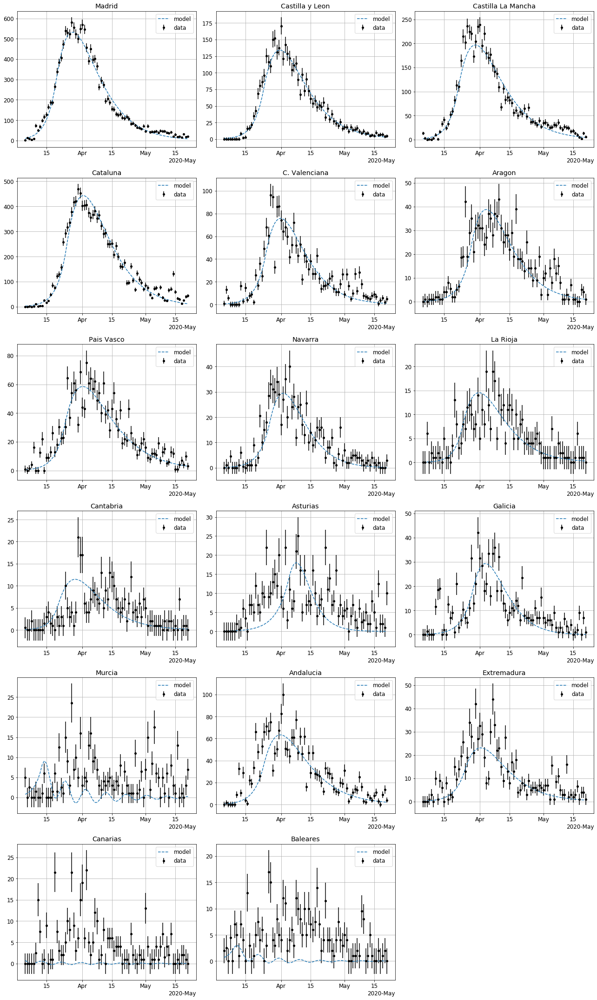

In [139]:
for caname in canames: capars[caname].pop('chi2')
masks   = (('t0', 'tr'), ('s1', 'beta'), ('phi', 'gamma'))
capars1, cachi21 = ana_capars(masks = masks, canames = canames, capars = capars, 
                            fit = True, ofilename = ofilename)
dfpars1 = to_df(capars1, cachi21)

#### - code

In [94]:
def save_ana_ca(caname, tr = 2., kpars = None, masks = None, fit = False):
    dates, cases, ucases = ca_cases(caname)
    ts                   = np.arange(len(dates))

    n0  = nn[caname]
    phi = 0.01
    s1  = 0.6 * np.sum(cases)/(n0 * phi)
    fi  = tr/2.
    
    kpars =  {'t0': 40.0, 'beta': 2./fi, 'gamma': 0.2/fi, 'tr': 2.*fi, 'ti': 5.5, 
               'tm': 10., 'n': n0, 'phi': phi, 's1': s1} if kpars is None else kpars
    #masks = (('t0', 's1'), ('beta', 'gamma'), ('t0', 'phi'), ('phi', 's1'), ('beta', 'tr'), ('gamma', 'tr'))
    #masks = 2*(('t0', 's1'), ('beta', 'gamma'), ('phi', 'tr'))
    masks = (('t0', 's1'), ('beta', 'gamma')) if masks is None else masks
    chi2 = 0.
    if (fit):
        tbar = IntProgress(0, max = len(masks))
        display(tbar)
        for imask in masks:
            tbar.value += 1
            kpars, chi2 = usa.useirqm_chi2fit(dates, cases, kpars = kpars, kmask = imask)
            print(caname, 'chi2 : ', chi2, ', kpars: ', kpars)
    fmodel      = usa.useirqm_fmodel(kpars = kpars)
    usa.plot_data_model(dates, cases, fmodel)
    plt.title(caname)
    return kpars, chi2


In [95]:
kpars, chi2 = ana_ca('Cataluna', fit = True)

NameError: name 'cases' is not defined

Cataluna chi2 :  12.893493758170983 , kpars:  {'t0': 37.0, 'beta': 2.0, 'gamma': 0.2, 'tr': 2.0, 'ti': 5.5, 'tm': 10.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.10074994424389791}
Cataluna chi2 :  9.46530163786501 , kpars:  {'t0': 37.0, 'beta': 1.9722199952548896, 'gamma': 0.21806379991754782, 'tr': 2.0, 'ti': 5.5, 'tm': 10.0, 'n': 7600065.0, 'phi': 0.01, 's1': 0.10074994424389791}
Cataluna chi2 :  9.06124927275481 , kpars:  {'t0': 37.0, 'beta': 1.9722199952548896, 'gamma': 0.21806379991754782, 'tr': 2.1085208671825137, 'ti': 5.5, 'tm': 10.0, 'n': 7600065.0, 'phi': 0.007626664035456076, 's1': 0.10074994424389791}
Cataluna chi2 :  9.06124927275481 , kpars:  {'t0': 37.0, 'beta': 1.9722199952548896, 'gamma': 0.21806379991754782, 'tr': 2.1085208671825137, 'ti': 5.5, 'tm': 10.0, 'n': 7600065.0, 'phi': 0.007626664035456076, 's1': 0.10074994424389791}
Cataluna chi2 :  8.870748978917813 , kpars:  {'t0': 37.0, 'beta': 1.965334899475539, 'gamma': 0.23084285449545502, 'tr': 2.1085208671825137, 'ti': 

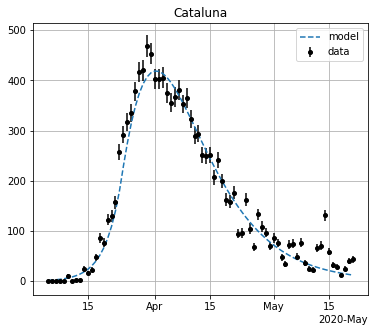

In [52]:
kpars, chi2 = ana_ca('Cataluna', fit = True)

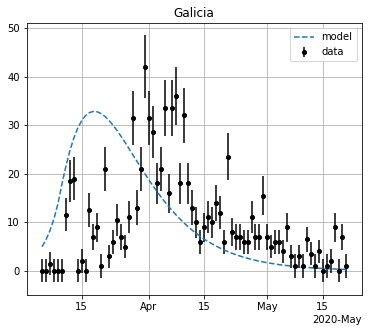

In [79]:
kpars, chi2 = ana_ca('Galicia', fit = False)

Madrid chi2 :  8.628566433978767 , kpars:  {'t0': 41.0, 'beta': 2.0, 'gamma': 0.2, 'tr': 2.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.13205439612385317}
Madrid chi2 :  6.449723248668784 , kpars:  {'t0': 41.0, 'beta': 2.05562710702361, 'gamma': 0.22796420996324748, 'tr': 2.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.13205439612385317}
Castilla y Leon chi2 :  2.4480829353383204 , kpars:  {'t0': 33.0, 'beta': 2.0, 'gamma': 0.2, 'tr': 2.0, 'ti': 5.5, 'tm': 10.0, 'n': 2409164.0, 'phi': 0.01, 's1': 0.10176844540263763}
Castilla y Leon chi2 :  2.4215073012746657 , kpars:  {'t0': 33.0, 'beta': 1.9980807100928286, 'gamma': 0.2028836266412576, 'tr': 2.0, 'ti': 5.5, 'tm': 10.0, 'n': 2409164.0, 'phi': 0.01, 's1': 0.10176844540263763}
Castilla La Mancha chi2 :  6.458058270631439 , kpars:  {'t0': 36.0, 'beta': 2.0, 'gamma': 0.2, 'tr': 2.0, 'ti': 5.5, 'tm': 10.0, 'n': 2026807.0, 'phi': 0.01, 's1': 0.18510112210980123}
Castilla La Mancha chi2 :  6.144415394739681

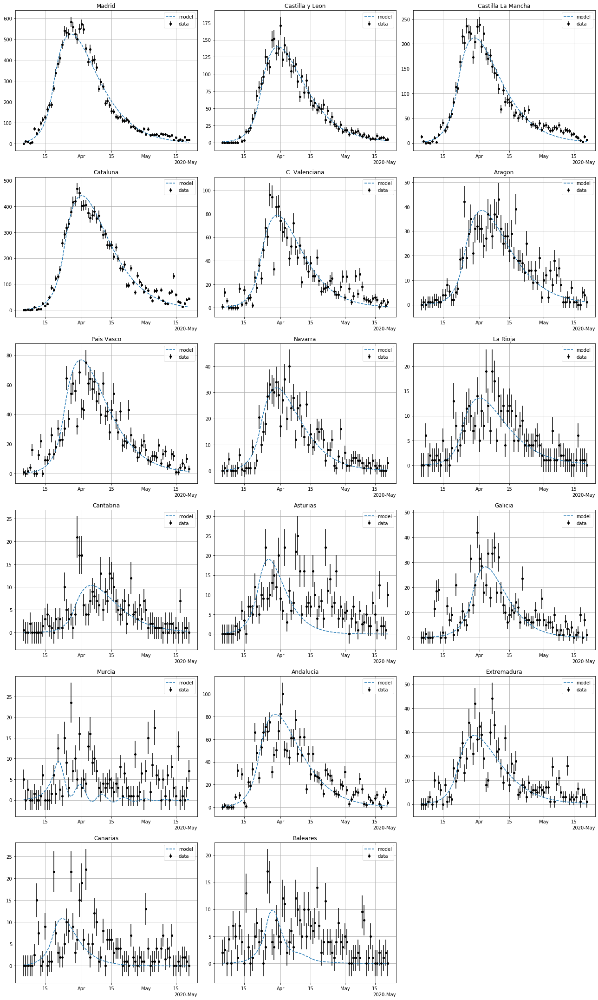

In [86]:
canames = ['Madrid', 'Castilla y Leon', 'Castilla La Mancha',
           'Cataluna', 'C. Valenciana', 'Aragon',
           'Pais Vasco', 'Navarra', 'La Rioja',
           'Cantabria', 'Asturias', 'Galicia',
           'Murcia', 'Andalucia', 'Extremadura',
           'Canarias', 'Baleares']

ncols, nrows = 3, 6
plt.figure(figsize = (ncols * 6, nrows * 5))

capars = {}
for i, caname in enumerate(canames):
    ax = plt.subplot(nrows, ncols, i + 1, axisbelow=True)
    pars, chi2 = ana_ca(caname, fit = True)
    capars[caname] = pars
    plt.title(caname)
plt.tight_layout()

Madrid chi2 :  6.512318009112994 , kpars:  {'t0': 41.122518887916, 'beta': 2.05562710702361, 'gamma': 0.22796420996324748, 'tr': 2.078759369104167, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.008504261589019992, 's1': 0.13205439612385317}
Castilla y Leon chi2 :  2.304196391130497 , kpars:  {'t0': 33.58129347721639, 'beta': 1.9980807100928286, 'gamma': 0.2028836266412576, 'tr': 2.1213299106731673, 'ti': 5.5, 'tm': 10.0, 'n': 2409164.0, 'phi': 0.007627971951791981, 's1': 0.10176844540263763}
Castilla La Mancha chi2 :  6.1365672419525215 , kpars:  {'t0': 36.003982967121146, 'beta': 1.9937724797512335, 'gamma': 0.22318894683876514, 'tr': 2.0012156888970836, 'ti': 5.5, 'tm': 10.0, 'n': 2026807.0, 'phi': 0.009660380938598702, 's1': 0.18510112210980123}
Cataluna chi2 :  9.182063234072633 , kpars:  {'t0': 37.64566462246839, 'beta': 1.9722199952548896, 'gamma': 0.21806379991754782, 'tr': 2.1085212544504426, 'ti': 5.5, 'tm': 10.0, 'n': 7600065.0, 'phi': 0.007626998421459507, 's1': 0.10074994

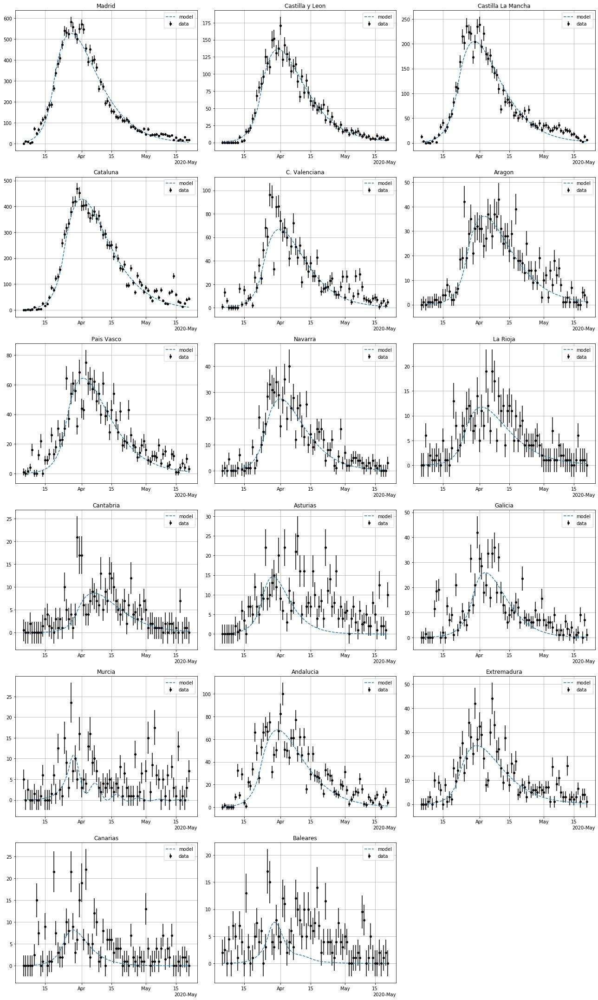

In [93]:
ncols, nrows = 3, 6
plt.figure(figsize = (ncols * 6, nrows * 5))

capars2 = {}
masks   = (('t0', 'phi', 'tr'),)
for i, caname in enumerate(canames):
    ax = plt.subplot(nrows, ncols, i + 1, axisbelow=True)
    pars, chi2 = ana_ca(caname, kpars = capars[caname], masks = masks, fit = True)
    capars2[caname] = pars
    plt.title(caname)
plt.tight_layout()

In [94]:
f = open('capars.py', 'w')
f.write(str(capars2))
f.close()
#capars2

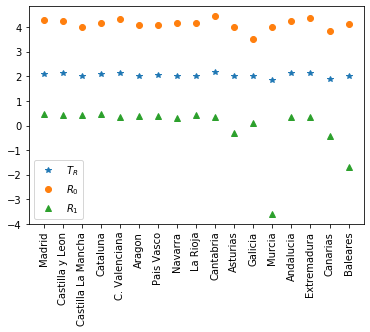

In [95]:
trs    = npa([capars2[caname]['tr']    for caname in canames])
betas  = npa([capars2[caname]['beta']  for caname in canames])
gammas = npa([capars2[caname]['gamma'] for caname in canames])

phis = npa([capars2[caname]['phi'] for caname in canames])
s1s  = npa([capars2[caname]['s1']  for caname in canames])
t0s  = npa([capars2[caname]['t0']  for caname in canames])

plt.plot(trs, ls = '', marker = '*', label = r'$T_R$');
plt.plot(trs * betas, ls = '', marker = 'o', label = r'$R_0$');
plt.plot(trs * gammas, ls = '', marker = '^', label = r'$R_1$');
plt.legend();
plt.xticks(np.arange(len(canames)), canames, rotation = 90);

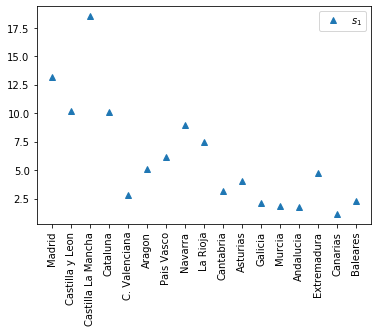

In [104]:
plt.plot(100 * s1s, ls = '', marker = '^', label = r'$s_1$');
plt.legend();
plt.xticks(np.arange(len(canames)), canames, rotation = 90);

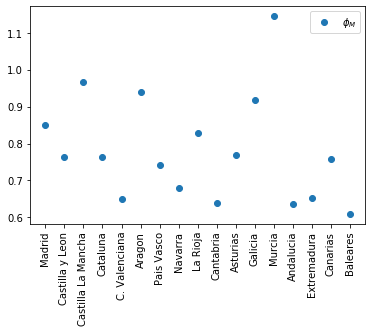

In [102]:
plt.plot(100 * phis, ls = '', marker = 'o', label = r'$\phi_M$');
plt.legend();
plt.xticks(np.arange(len(canames)), canames, rotation = 90);

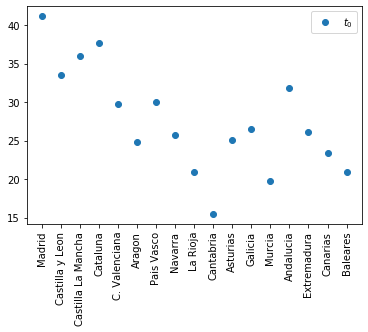

In [103]:
plt.plot(t0s, ls = '', marker = 'o', label = r'$t_0$');
plt.legend();
plt.xticks(np.arange(len(canames)), canames, rotation = 90);

Madrid chi2 :  9.966515022465378 , kpars:  {'t0': 50.0, 'beta': 1.3333333333333333, 'gamma': 0.13333333333333333, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.1203533736824991}
Madrid chi2 :  8.94979637057572 , kpars:  {'t0': 50.0, 'beta': 1.3389383242546802, 'gamma': 0.14025803555693828, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.1203533736824991}
Castilla y Leon chi2 :  3.6339972905040314 , kpars:  {'t0': 40.0, 'beta': 1.3333333333333333, 'gamma': 0.13333333333333333, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 2409164.0, 'phi': 0.01, 's1': 0.0935801796805863}
Castilla y Leon chi2 :  3.5344180846901363 , kpars:  {'t0': 40.0, 'beta': 1.3306373211244744, 'gamma': 0.126705659367144, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 2409164.0, 'phi': 0.01, 's1': 0.0935801796805863}
Castilla La Mancha chi2 :  8.011335338926106 , kpars:  {'t0': 43.0, 'beta': 1.3333333333333333, 'gamma': 0.13333333333333333, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 202680

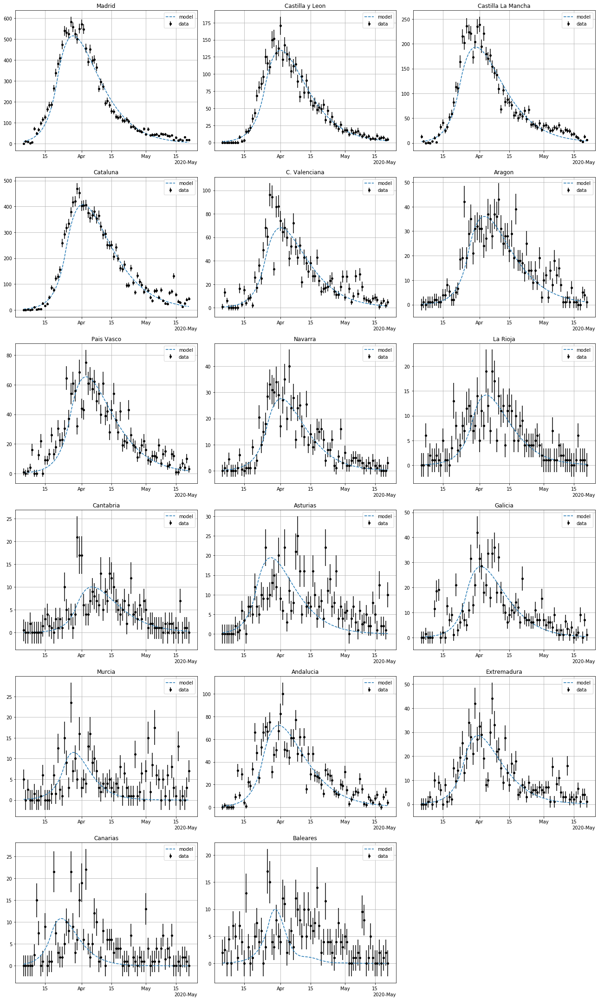

In [105]:
ncols, nrows = 3, 6
plt.figure(figsize = (ncols * 6, nrows * 5))

capars = {}
for i, caname in enumerate(canames):
    ax = plt.subplot(nrows, ncols, i + 1, axisbelow=True)
    pars, chi2 = ana_ca(caname, tr = 3, fit = True)
    capars[caname] = pars
    plt.title(caname)
plt.tight_layout()

Madrid chi2 :  8.94979637057572 , kpars:  {'t0': 50.0, 'beta': 1.3389383242546802, 'gamma': 0.14025803555693828, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.1203533736824991}
Madrid chi2 :  9.069126223892026 , kpars:  {'t0': 50.0, 'beta': 1.338938421205337, 'gamma': 0.14025805264855595, 'tr': 2.999999623828464, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.1203533736824991}
Castilla y Leon chi2 :  3.5332070338635377 , kpars:  {'t0': 40.25869029219017, 'beta': 1.3306373211244744, 'gamma': 0.126705659367144, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 2409164.0, 'phi': 0.009951973582580913, 's1': 0.0935801796805863}
mle: warning
Castilla y Leon chi2 :  3.0051668364359485 , kpars:  {'t0': 40.25869029219017, 'beta': 0.8105332192600496, 'gamma': 0.026990983194107754, 'tr': 11.366182822851727, 'ti': 5.5, 'tm': 10.0, 'n': 2409164.0, 'phi': 0.009951973582580913, 's1': 0.0935801796805863}
Castilla La Mancha chi2 :  7.364148612807367 , kpars:  {'t0': 43.263329

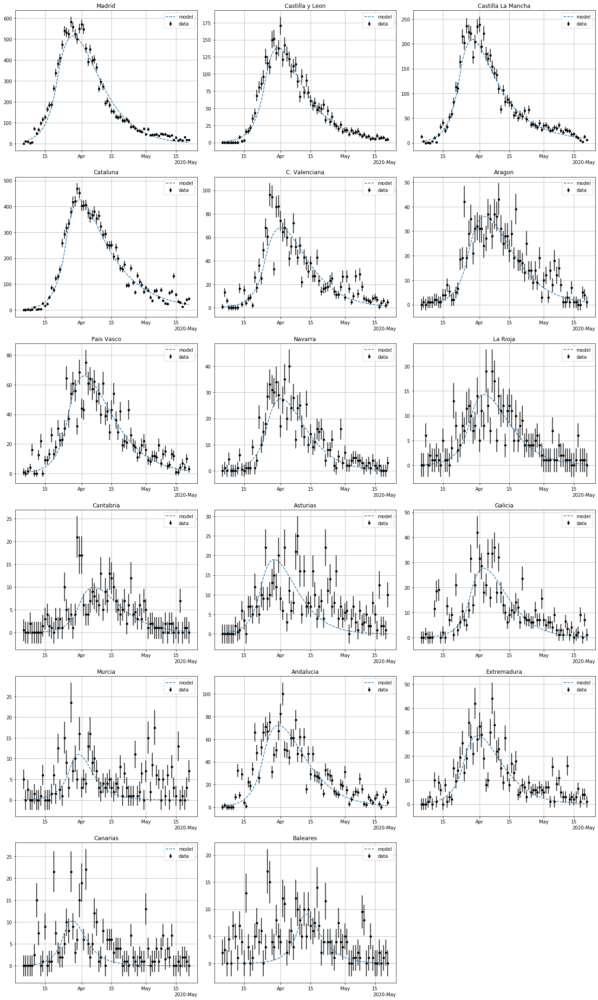

In [107]:
ncols, nrows = 3, 6
plt.figure(figsize = (ncols * 6, nrows * 5))

capars2 = {}
masks   = (('t0', 'phi'), ('beta', 'gamma', 'tr'))
for i, caname in enumerate(canames):
    ax = plt.subplot(nrows, ncols, i + 1, axisbelow=True)
    pars, chi2 = ana_ca(caname, kpars = capars[caname], masks = masks, fit = True)
    capars2[caname] = pars
    cachi2 [caname] = chi2
    plt.title(caname)
plt.tight_layout()

In [108]:
f = open('capars3.py', 'w')
f.write(str(capars2))
f.close()
#capars2

## --- code ana

In [32]:
x = {}
'hello' in x.keys() 

False

In [60]:
canames = ['Madrid', 'Castilla y Leon', 'Castilla La Mancha',
           'Cataluna', 'C. Valenciana', 'Aragon',
           'Pais Vasco', 'Navarra', 'La Rioja',
           'Cantabria', 'Asturias', 'Galicia',
           'Murcia', 'Andalucia', 'Extremadura',
           'Canarias', 'Baleares']

def ana_ca(caname, tr = 2., kpars = None, masks = None, fit = False):
    
    dates, cases, ucases = ca_cases(caname)
    ts                   = np.arange(len(dates))

    n0  = nn[caname]
    phi = 0.01
    s1  = 0.6 * np.sum(cases)/(n0 * phi)
    fi  = tr/2.
    
    kpars =  {'t0': 40.0, 'beta': 2./fi, 'gamma': 0.2/fi, 'tr': 2.*fi, 'ti': 5.5, 
               'tm': 10., 'n': n0, 'phi': phi, 's1': s1} if kpars is None else kpars
    #masks = (('t0', 's1'), ('beta', 'gamma'), ('t0', 'phi'), ('phi', 's1'), ('beta', 'tr'), ('gamma', 'tr'))
    #masks = 2*(('t0', 's1'), ('beta', 'gamma'), ('phi', 'tr'))
    #print('kpars', kpars)
    masks = (('t0', 's1'), ('beta', 'gamma')) if masks is None else masks
    chi2 = 0.
    if (fit):
        tbar = IntProgress(0, max = len(masks), description = caname); display(tbar)
        for imask in masks:
            tbar.value += 1
            kpars, chi2 = usa.useirqm_chi2fit(dates, cases, kpars = kpars, kmask = imask)
            #print(caname, 'chi2 : ', chi2, ', kpars: ', kpars, ', mask ', imask)
    fmodel      = usa.useirqm_fmodel(kpars = kpars)
    usa.plot_data_model(dates, cases, fmodel)
    plt.title(caname)
    return kpars, chi2


def ana_capars(masks, canames = canames, capars = {}, fit = False, ofilename = None):
    ncols, nrows = 3, int(len(canames)/3)
    if (len(canames) % 3 != 0): nrows += 1

    plt.figure(figsize = (ncols * 6, nrows * 5))
    
    f = open(ofilename, 'w') if ofilename is not None else None
      
    capars2, cachi2 = {}, {}
    for i, caname in enumerate(canames):
        ax    = plt.subplot(nrows, ncols, i + 1, axisbelow=True)
        kpars = capars[caname] if caname in capars.keys() else None
        pars, chi2 = ana_ca(caname, kpars = kpars, masks = masks, fit = fit)
        if (f is not None):
            ss = str(caname)+', '+str(pars)+', '+str(chi2)+'\n'
            f.write(ss)
        else: 
            print(caname, chi2, pars)
        capars2[caname] = pars
        cachi2 [caname] = chi2
        plt.title(caname)
    plt.tight_layout()
    
    if (f is not None): f.close()
    
    return capars2, cachi2

def plot_capars(capars, cachi2, canames = None):
    
    canames = capars.keys() if canames is None else canames
    
    trs    = npa([capars[caname]['tr']    for caname in canames])
    betas  = npa([capars[caname]['beta']  for caname in canames])
    gammas = npa([capars[caname]['gamma'] for caname in canames])

    phis = npa([capars[caname]['phi'] for caname in canames])
    s1s  = npa([capars[caname]['s1']  for caname in canames])
    t0s  = npa([capars[caname]['t0']  for caname in canames])

    plt.figure(figsize = (8, 5))
    plt.plot(trs, ls = '', marker = '*', label = r'$T_R$');
    plt.plot(trs * betas, ls = '', marker = 'o', label = r'$R_0$');
    plt.plot(trs * gammas, ls = '', marker = '^', label = r'$R_1$');
    plt.legend(); plt.grid()
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    
    plt.figure(figsize = (8, 5))
    plt.plot(100 * s1s , ls = '', marker = '^', label = r'$s_1$');
    plt.plot(100 * phis, ls = '', marker = '^', label = r'$s_1$');
    plt.legend(); plt.grid();
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    
    plt.figure(figsize = (8, 5))
    plt.plot(t0s, ls = '', marker = '^', label = r'$t_0$');
    plt.legend(); plt.grid();
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    
    chis  = npa([cachi2[caname] for caname in canames])
    
    plt.figure(figsize = (8, 5))
    plt.plot(chi2, ls = '', marker = '^', label = r'$t_0$');
    plt.legend(); plt.grid();
    plt.xticks(np.arange(len(canames)), canames, rotation = 90);
    return

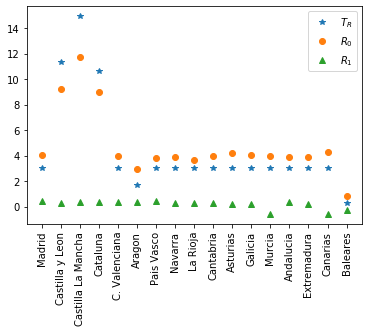

In [109]:
trs    = npa([capars2[caname]['tr']    for caname in canames])
betas  = npa([capars2[caname]['beta']  for caname in canames])
gammas = npa([capars2[caname]['gamma'] for caname in canames])

phis = npa([capars2[caname]['phi'] for caname in canames])
s1s  = npa([capars2[caname]['s1']  for caname in canames])
t0s  = npa([capars2[caname]['t0']  for caname in canames])

plt.plot(trs, ls = '', marker = '*', label = r'$T_R$');
plt.plot(trs * betas, ls = '', marker = 'o', label = r'$R_0$');
plt.plot(trs * gammas, ls = '', marker = '^', label = r'$R_1$');
plt.legend();
plt.xticks(np.arange(len(canames)), canames, rotation = 90);

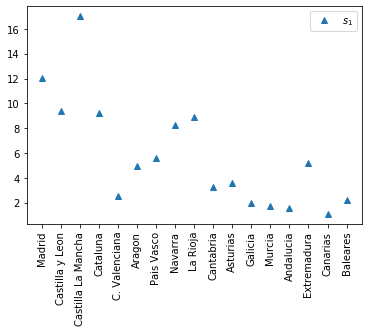

In [110]:
plt.plot(100 * s1s, ls = '', marker = '^', label = r'$s_1$');
plt.legend();
plt.xticks(np.arange(len(canames)), canames, rotation = 90);

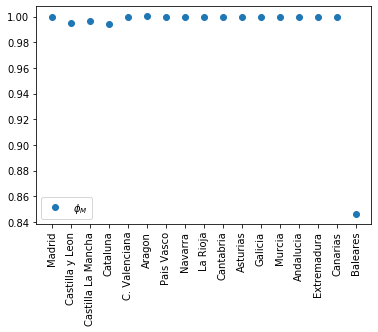

In [111]:
plt.plot(100 * phis, ls = '', marker = 'o', label = r'$\phi_M$');
plt.legend();
plt.xticks(np.arange(len(canames)), canames, rotation = 90);

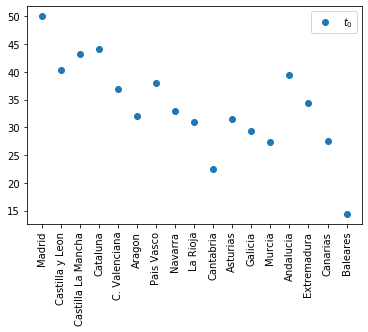

In [112]:
plt.plot(t0s, ls = '', marker = 'o', label = r'$t_0$');
plt.legend();
plt.xticks(np.arange(len(canames)), canames, rotation = 90);

Madrid chi2 :  8.94979637057572 , kpars:  {'t0': 50.0, 'beta': 1.3389383242546802, 'gamma': 0.14025803555693828, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.1203533736824991}
Madrid chi2 :  8.949795501365685 , kpars:  {'t0': 50.0, 'beta': 1.3389383533936372, 'gamma': 0.14025803555693828, 'tr': 2.9999999318536372, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.1203533736824991}
Madrid chi2 :  8.949795501365685 , kpars:  {'t0': 50.0, 'beta': 1.3389383533936372, 'gamma': 0.14025803555693828, 'tr': 2.9999999318536372, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.1203533736824991}
Castilla y Leon chi2 :  3.5332070338635377 , kpars:  {'t0': 40.25869029219017, 'beta': 1.3306373211244744, 'gamma': 0.126705659367144, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 2409164.0, 'phi': 0.009951973582580913, 's1': 0.0935801796805863}
Castilla y Leon chi2 :  3.5283141277141548 , kpars:  {'t0': 40.25869029219017, 'beta': 1.3174560128199078, 'gamma': 0.1267

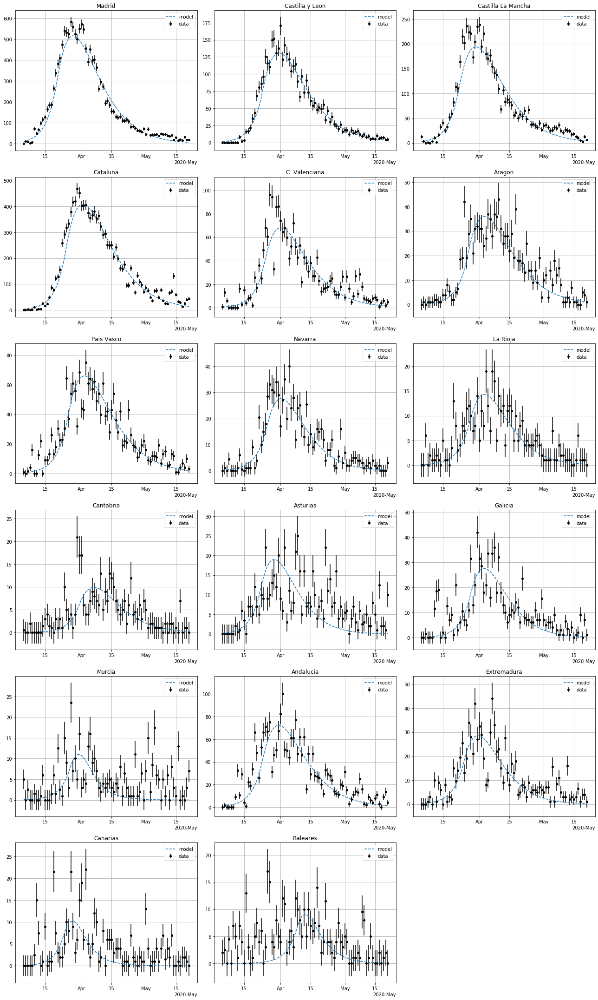

In [114]:
ncols, nrows = 3, 6
plt.figure(figsize = (ncols * 6, nrows * 5))

capars2 = {}
masks   = (('t0', 'phi'), ('beta', 'tr'), ('gamma', 'tr'))
for i, caname in enumerate(canames):
    ax = plt.subplot(nrows, ncols, i + 1, axisbelow=True)
    pars, chi2 = ana_ca(caname, kpars = capars[caname], masks = masks, fit = True)
    capars2[caname] = pars
    plt.title(caname)
plt.tight_layout()

Madrid chi2 :  8.94979637057572 , kpars:  {'t0': 50.0, 'beta': 1.3389383242546802, 'gamma': 0.14025803555693828, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.1203533736824991}
Madrid chi2 :  8.949795501365685 , kpars:  {'t0': 50.0, 'beta': 1.3389383533936372, 'gamma': 0.14025803555693828, 'tr': 2.9999999318536372, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.1203533736824991}
Madrid chi2 :  8.949795501365685 , kpars:  {'t0': 50.0, 'beta': 1.3389383533936372, 'gamma': 0.14025803555693828, 'tr': 2.9999999318536372, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.1203533736824991}
Castilla y Leon chi2 :  3.5332070338635377 , kpars:  {'t0': 40.25869029219017, 'beta': 1.3306373211244744, 'gamma': 0.126705659367144, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 2409164.0, 'phi': 0.009951973582580913, 's1': 0.0935801796805863}
Castilla y Leon chi2 :  3.5283141277141548 , kpars:  {'t0': 40.25869029219017, 'beta': 1.3174560128199078, 'gamma': 0.1267

ValueError: too many values to unpack (expected 2)

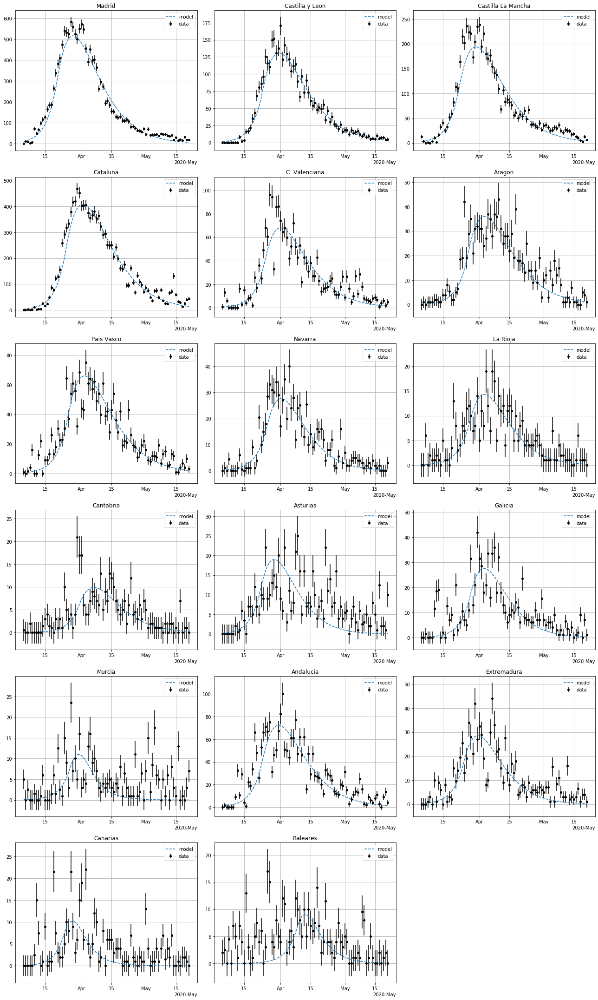

In [137]:
masks   = (('t0', 'phi'), ('beta', 'tr'), ('gamma', 'tr'))
capars3, cachi3 = ana_capars(masks, capars = capars, fit = True)

### Here

IntProgress(value=0, description='Madrid', max=2)

IntProgress(value=0, description='Castilla y Leon', max=2)

IntProgress(value=0, description='Castilla La Mancha', max=2)

IntProgress(value=0, description='Cataluna', max=2)

IntProgress(value=0, description='C. Valenciana', max=2)

IntProgress(value=0, description='Aragon', max=2)

IntProgress(value=0, description='Pais Vasco', max=2)

IntProgress(value=0, description='Navarra', max=2)

IntProgress(value=0, description='La Rioja', max=2)

IntProgress(value=0, description='Cantabria', max=2)

IntProgress(value=0, description='Asturias', max=2)

IntProgress(value=0, description='Galicia', max=2)

IntProgress(value=0, description='Murcia', max=2)

IntProgress(value=0, description='Andalucia', max=2)

IntProgress(value=0, description='Extremadura', max=2)

IntProgress(value=0, description='Canarias', max=2)

IntProgress(value=0, description='Baleares', max=2)

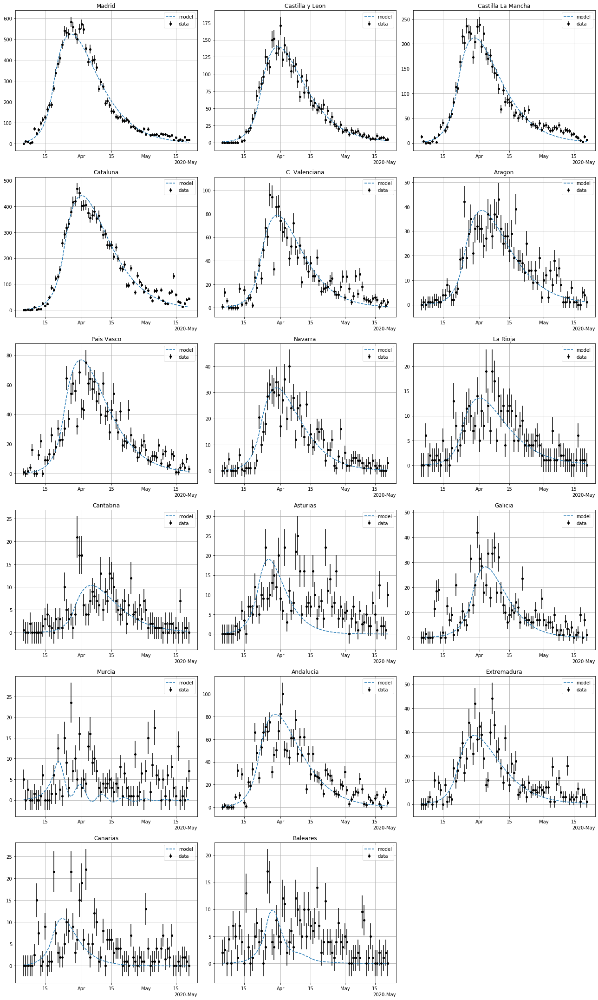

In [79]:
masks   = (('s1', 't0'), ('beta', 'gamma'))
capars1, cachi21 = ana_capars(masks, canames = canames, capars = {}, fit = True, ofilename = 'capars0.txt')

IntProgress(value=0, description='Madrid', max=3)

IntProgress(value=0, description='Castilla y Leon', max=3)

IntProgress(value=0, description='Castilla La Mancha', max=3)

IntProgress(value=0, description='Cataluna', max=3)

IntProgress(value=0, description='C. Valenciana', max=3)

IntProgress(value=0, description='Aragon', max=3)

IntProgress(value=0, description='Pais Vasco', max=3)

IntProgress(value=0, description='Navarra', max=3)

IntProgress(value=0, description='La Rioja', max=3)

IntProgress(value=0, description='Cantabria', max=3)

IntProgress(value=0, description='Asturias', max=3)

IntProgress(value=0, description='Galicia', max=3)

IntProgress(value=0, description='Murcia', max=3)

mle: warning


IntProgress(value=0, description='Andalucia', max=3)

IntProgress(value=0, description='Extremadura', max=3)

IntProgress(value=0, description='Canarias', max=3)

IntProgress(value=0, description='Baleares', max=3)

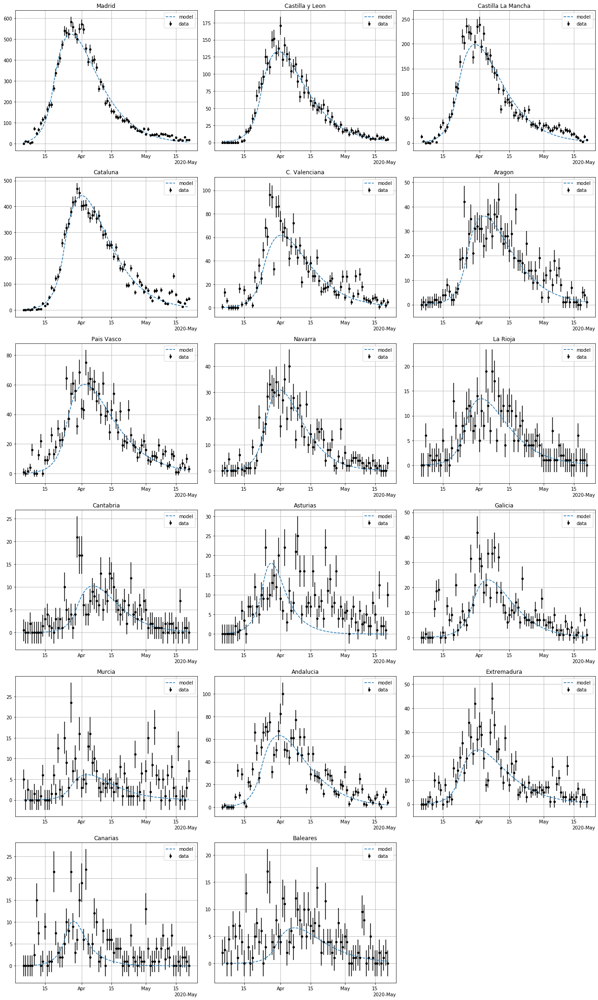

In [81]:
masks   = (('t0', 'tr'), ('s1', 'beta'), ('phi', 'gamma'))
capars2, cachi22 = ana_capars(masks, canames = canames, capars = capars1, 
                              fit = True, ofilename = 'capars1.txt')

IntProgress(value=0, description='Madrid', max=3)

IntProgress(value=0, description='Castilla y Leon', max=3)

IntProgress(value=0, description='Castilla La Mancha', max=3)

IntProgress(value=0, description='Cataluna', max=3)

IntProgress(value=0, description='C. Valenciana', max=3)

IntProgress(value=0, description='Aragon', max=3)

IntProgress(value=0, description='Pais Vasco', max=3)

IntProgress(value=0, description='Navarra', max=3)

IntProgress(value=0, description='La Rioja', max=3)

IntProgress(value=0, description='Cantabria', max=3)

IntProgress(value=0, description='Asturias', max=3)

IntProgress(value=0, description='Galicia', max=3)

IntProgress(value=0, description='Murcia', max=3)

IntProgress(value=0, description='Andalucia', max=3)

IntProgress(value=0, description='Extremadura', max=3)

IntProgress(value=0, description='Canarias', max=3)

IntProgress(value=0, description='Baleares', max=3)

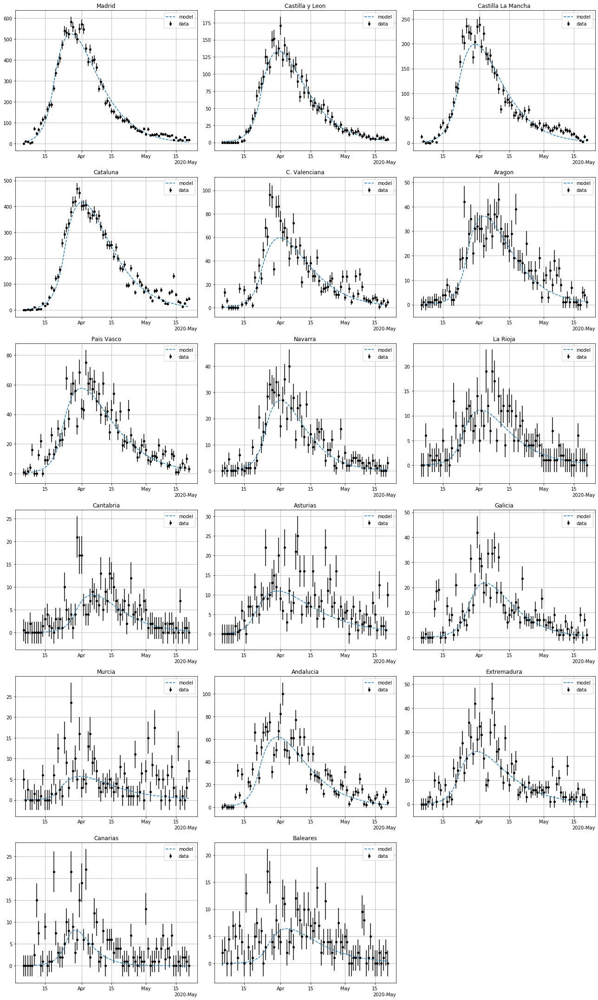

In [82]:
masks   = (('beta', 'tr', 's1'), ('gamma', 'tr', 'phi'), ('t0',))
capars3, cachi32 = ana_capars(masks, canames = canames, capars = capars2, 
                              fit = True, ofilename = 'capars2.txt')

In [78]:
capars3, cachi23

({'Madrid': {'t0': 41.337178058807396,
   'beta': 2.056455539148531,
   'gamma': 0.23195672973982434,
   'tr': 2.0915579833242206,
   'ti': 5.5,
   'tm': 10.0,
   'n': 6578079.0,
   'phi': 0.008192580498532866,
   's1': 0.13187670071253066},
  'Cataluna': {'t0': 37.21370233836275,
   'beta': 1.8930768031424505,
   'gamma': 0.21604050798780694,
   'tr': 2.2675931380497905,
   'ti': 5.5,
   'tm': 10.0,
   'n': 7600065.0,
   'phi': 0.007778268003709921,
   's1': 0.0952234204432649}},
 {'Madrid': 6.387937882970191, 'Cataluna': 9.25297380273259})

IntProgress(value=0, description='Madrid', max=2)

mle: warning


IntProgress(value=0, description='Cataluna', max=2)

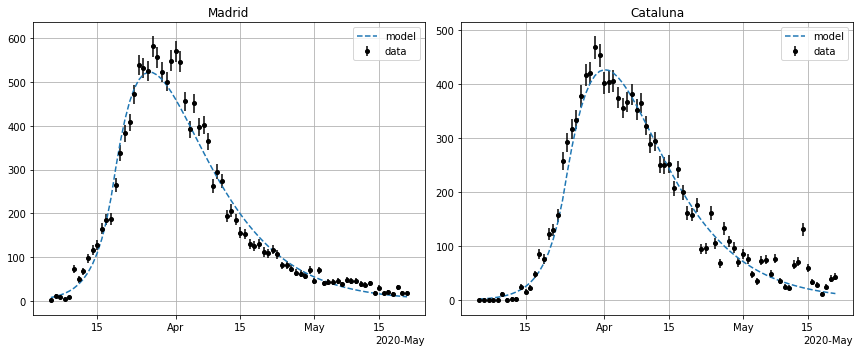

In [65]:
masks   = (('t0', 'phi', 's1'), ('beta', 'gamma', 'tr'))
canames1 = ['Madrid', 'Cataluna']
capars3, cachi23 = ana_capars(masks, canames = canames1, capars = capars2, 
                              fit = True, ofilename = 'temp.txt')

In [180]:
import ipywidgets as widgets
from ipywidgets import IntProgress
from IPython.display import display
import time



Help on function display in module IPython.core.display:

display(*objs, include=None, exclude=None, metadata=None, transient=None, display_id=None, **kwargs)
    Display a Python object in all frontends.
    
    By default all representations will be computed and sent to the frontends.
    Frontends can decide which representation is used and how.
    
    In terminal IPython this will be similar to using :func:`print`, for use in richer
    frontends see Jupyter notebook examples with rich display logic.
    
    Parameters
    ----------
    objs : tuple of objects
        The Python objects to display.
    raw : bool, optional
        Are the objects to be displayed already mimetype-keyed dicts of raw display data,
        or Python objects that need to be formatted before display? [default: False]
    include : list, tuple or set, optional
        A list of format type strings (MIME types) to include in the
        format data dict. If this is set *only* the format types included

0

AttributeError: 'function' object has no attribute 'clear'

In [146]:
capars3

NameError: name 'capars3' is not defined

### --- Definition of pars0

total  14661.0 , % populatÇion - s1  0.2785957724131924


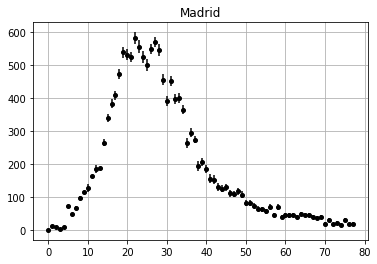

In [109]:
caname = 'Madrid'
dates, cases, ucases = ca_cases(caname)
ts                   = np.arange(len(dates))

xdata  = ts, cases

n0, phim = nn['Madrid'], 0.008
s1       = np.sum(cases)/ (n0 * phim)
print('total ', np.sum(cases), ', % populatÇion - s1 ', s1)

plt.errorbar(ts, cases, yerr = ucases, ls = '', marker = 'o', ms = 4, color = 'black')
plt.title(caname); plt.grid(); #c19ma.formatter(plt.gca());

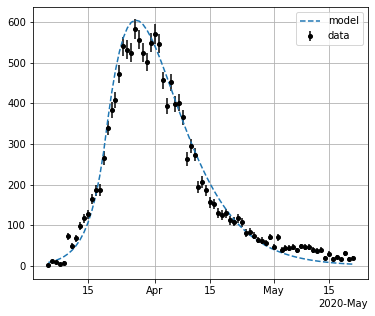

In [110]:
import c19.useir_ana as usa

n0 = nn['Madrid']

kpars =  {'t0': 42.0, 'beta': 2., 'gamma': 0.18, 'tr': 2., 'ti': 5.5, 
         'tm': 10., 'n': n0, 'phi': 0.01, 's1': 0.5 * s1}
fmodel = usa.useirq_fmodel(kpars = kpars)
usa.plot_data_model(dates, cases, fmodel)

8.298072212808181 {'t0': 42.29704575196092, 'beta': 2.0, 'gamma': 0.2, 'tr': 2.0, 'ti': 5.5, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.009082260856528628, 's1': 0.16107462554086666}
6.936895071739105 {'t0': 42.29704575196092, 'beta': 1.9955919543032645, 'gamma': 0.2271214331513547, 'tr': 2.0, 'ti': 5.5, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.009082260856528628, 's1': 0.16107462554086666}
6.800900628676569 {'t0': 42.60017952422183, 'beta': 1.9955919543032645, 'gamma': 0.2271214331513547, 'tr': 2.0, 'ti': 5.5, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.008798505993225146, 's1': 0.15581004721992825}
6.555374388836003 {'t0': 42.60017952422183, 'beta': 1.9843548111819103, 'gamma': 0.2389030668262233, 'tr': 2.010452569747075, 'ti': 5.5, 'tm': 9.0, 'n': 6578079.0, 'phi': 0.008798505993225146, 's1': 0.15581004721992825}


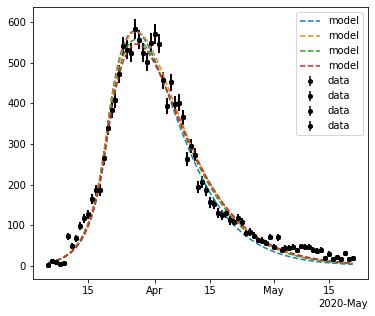

In [111]:
kpars =  {'t0': 42.0, 'beta': 2., 'gamma': 0.2, 'tr': 2., 'ti': 5.5, 
         'tm': 9., 'n': n0, 'phi': 0.015, 's1': 0.5 * s1}
#kpars =  {'t0': 39.0, 'beta': 1.78, 'gamma': 0.40, 'tr': 1.9, 'ti': 5.5, 
#         'tm': 1.9, 'n': 3000000.0, 'phi': 0.016, 's1': 0.0354}
masks = (('t0', 'phi', 's1'), ('beta', 'gamma'), ('t0', 'phi', 's1'), ('beta', 'gamma', 'tr'))
for imask in masks:
    kpars, chi2 = usa.useirqm_chi2fit(dates, cases, kpars = kpars, kmask = imask)
    fmodel      = usa.useirqm_fmodel(kpars = kpars)
    usa.plot_data_model(dates, cases, fmodel)
    print(chi2, kpars)

total  3757.5 , % population - s1  0.1559669661343105


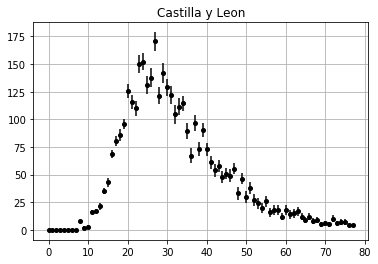

In [80]:
caname = 'Castilla y Leon'
dates, cases, ucases = ca_cases(caname)
ts                   = np.arange(len(dates))

xdata  = ts, cases

n0, phim = nn['Castilla y Leon'], 0.01
s1       = np.sum(cases)/ (n0 * phim)
print('total ', np.sum(cases), ', % population - s1 ', s1)

plt.errorbar(ts, cases, yerr = ucases, ls = '', marker = 'o', ms = 4, color = 'black')
plt.title(caname); plt.grid(); #c19ma.formatter(plt.gca());

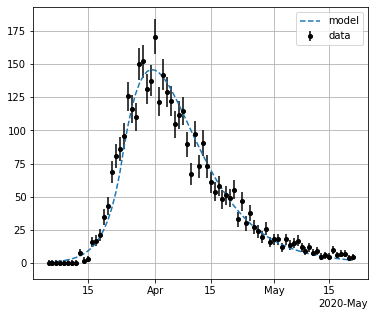

In [106]:
kpars =  {'t0': 35.0, 'beta': 2., 'gamma': 0.18, 'tr': 2., 'ti': 5.5, 
         'tm': 10., 'n': n0, 'phi': 0.010, 's1': 0.8 * s1}
kpars = {'t0': 32.628202681415445, 'beta': 1.1784669301281951, 'gamma': 0.0440684155209541, 'tr': 9.131583436722604, 'ti': 5.5, 'tm': 9.0, 'n': 2409164.0, 'phi': 0.006786888204621562, 's1': 0.12980858631827444}
kpars = {'t0': 33.80409138072298, 'beta': 1.9585138262342427, 'gamma': 0.20806571045940012, 'tr': 2.008473313428096, 'ti': 5.5, 'tm': 9.0, 'n': 2409164.0, 'phi': 0.009362884656686186, 's1': 0.10806856759234126}
fmodel = usa.useirq_fmodel(kpars = kpars)
usa.plot_data_model(dates, cases, fmodel)

6.551771368003652 {'t0': 41.125, 'beta': 1.3333333333333333, 'gamma': 0.13333333333333333, 'tr': 3.0, 'ti': 5.5, 'tm': 9.0, 'n': 2409164.0, 'phi': 0.01, 's1': 0.10917687629401734}
4.316975168829468 {'t0': 41.125, 'beta': 1.3333333333333333, 'gamma': 0.13333333333333333, 'tr': 3.0, 'ti': 5.5, 'tm': 9.0, 'n': 2409164.0, 'phi': 0.01, 's1': 0.10371803247931648}
4.030438280696348 {'t0': 41.125, 'beta': 1.3296139597200887, 'gamma': 0.14820591187360482, 'tr': 3.0, 'ti': 5.5, 'tm': 9.0, 'n': 2409164.0, 'phi': 0.01, 's1': 0.10371803247931648}
3.839628218152674 {'t0': 41.4774710159021, 'beta': 1.3296139597200887, 'gamma': 0.14820591187360482, 'tr': 3.0, 'ti': 5.5, 'tm': 9.0, 'n': 2409164.0, 'phi': 0.009357775749646725, 's1': 0.10053594083307879}
3.2113138009261966 {'t0': 41.4774710159021, 'beta': 0.828870607206962, 'gamma': 0.03887957964322965, 'tr': 9.514813233676428, 'ti': 5.5, 'tm': 9.0, 'n': 2409164.0, 'phi': 0.009357775749646725, 's1': 0.10053594083307879}


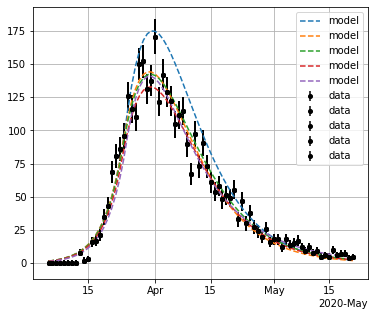

In [107]:
TR = 3
fi = TR/2.
kpars =  {'t0': 35.0, 'beta': 2./fi, 'gamma': 0.2/fi, 'tr': 2. * fi, 'ti': 5.5, 
         'tm': 9., 'n': n0, 'phi': 0.010, 's1': 0.7 * s1}
#kpars =  {'t0': 39.0, 'beta': 1.78, 'gamma': 0.40, 'tr': 1.9, 'ti': 5.5, 
#         'tm': 1.9, 'n': 3000000.0, 'phi': 0.016, 's1': 0.0354}
masks = (('t0',), ('s1',), ('beta', 'gamma'), ('t0', 'phi', 's1'), ('beta', 'gamma', 'tr'))
for imask in masks:
    kpars, chi2 = usa.useirqm_chi2fit(dates, cases, kpars = kpars, kmask = imask)
    fmodel      = usa.useirqm_fmodel(kpars = kpars)
    usa.plot_data_model(dates, cases, fmodel)
    print(chi2, kpars)

11.45671693621479 {'t0': 50.39999999999998, 'beta': 1.3333333333333333, 'gamma': 0.12, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.12885054474110152}
8.67826047064083 {'t0': 50.39999999999998, 'beta': 1.3629132617536603, 'gamma': 0.15218073112814462, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.12885054474110152}
8.67826047064083 {'t0': 50.39999999999998, 'beta': 1.3629132617536603, 'gamma': 0.15218073112814462, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.12885054474110152}
8.67826047064083 {'t0': 50.39999999999998, 'beta': 1.3629132617536603, 'gamma': 0.15218073112814462, 'tr': 3.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.12885054474110152}


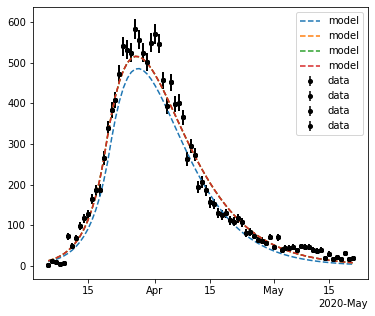

In [64]:
TR = 3.
fi = 3/2.
kpars =  {'t0': 42.0, 'beta': 2./fi, 'gamma': 0.18/fi, 'tr': TR, 'ti': 5.5, 
         'tm': 10., 'n': n0, 'phi': 0.01, 's1': 0.5 * s1}
#kpars =  {'t0': 39.0, 'beta': 1.78, 'gamma': 0.40, 'tr': 1.9, 'ti': 5.5, 
#         'tm': 1.9, 'n': 3000000.0, 'phi': 0.016, 's1': 0.0354}
masks = 2*(('t0', 's1'), ('beta', 'gamma'))
for imask in masks:
    kpars, chi2 = usa.useirqm_chi2fit(dates, cases, kpars = kpars, kmask = imask)
    fmodel      = usa.useirqm_fmodel(kpars = kpars)
    usa.plot_data_model(dates, cases, fmodel)
    print(chi2, kpars)

26.71085209557636 {'t0': 43.575, 'beta': 1.3333333333333333, 'gamma': 0.13333333333333333, 'tr': 5.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.12885054474110144}
9.111784334999024 {'t0': 43.575, 'beta': 1.3331942009215716, 'gamma': 0.10240643200726443, 'tr': 5.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.12885054474110144}
7.475043429130874 {'t0': 42.48562500000001, 'beta': 1.3331942009215716, 'gamma': 0.10240643200726443, 'tr': 5.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.13368244016889275}
6.537187252297472 {'t0': 42.48562500000001, 'beta': 1.3452508119207176, 'gamma': 0.09186792004807656, 'tr': 5.0, 'ti': 5.5, 'tm': 10.0, 'n': 6578079.0, 'phi': 0.01, 's1': 0.13368244016889275}


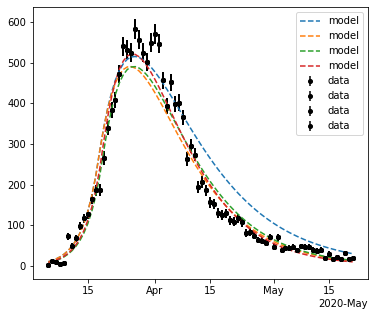

In [65]:
TR = 5.
fi = 3/2.
kpars =  {'t0': 42.0, 'beta': 2./fi, 'gamma': 0.2/fi, 'tr': TR, 'ti': 5.5, 
         'tm': 10., 'n': n0, 'phi': 0.01, 's1': 0.5 * s1}
#kpars =  {'t0': 39.0, 'beta': 1.78, 'gamma': 0.40, 'tr': 1.9, 'ti': 5.5, 
#         'tm': 1.9, 'n': 3000000.0, 'phi': 0.016, 's1': 0.0354}
masks = 2*(('t0', 's1'), ('beta', 'gamma'))
for imask in masks:
    kpars, chi2 = usa.useirqm_chi2fit(dates, cases, kpars = kpars, kmask = imask)
    fmodel      = usa.useirqm_fmodel(kpars = kpars)
    usa.plot_data_model(dates, cases, fmodel)
    print(chi2, kpars)

### uSEIR-quenched with t0

total  14033
mle: warning


{'t0': 27.22771502086421,
 'beta': 3.9743340412221855,
 'gamma': 0.38892460605675927,
 'tr': 1.574824890950996,
 'ti': 5.5,
 'tm': 9.8,
 'n': 3000000.0,
 'phi': 0.014189043705958852,
 's1': 0.23457388898251244}

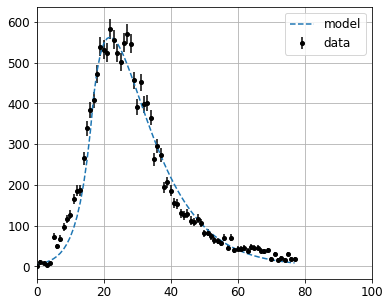

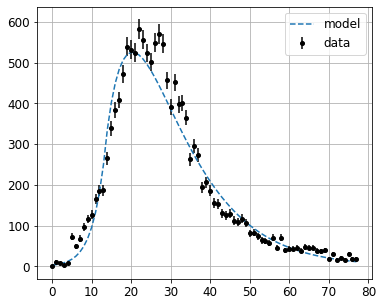

In [310]:
ufun = lambda pars : us._t0(pars, us._useirvarext)

pars = getpars(t0 = 35, beta = 1.8, gamma = 0.1, s1 = 0.20, tr = 3.)
times, xmcdata = us.rvs(pars, ufun = ufun)

xmcs, ymcs = xmcdata
print('total ', np.sum(ymcs))

#usa.plot_fit_data(xmcdata, pars, ufun= ufun)
usa.plot_fit_data(xdata, pars, ufun= ufun)
plt.xlim((0, 100));

kpars = {'t0': 35, 'beta' : 1.8, 'gamma' : 0.1, 's1' : 0.20, 'tr' : 5.}
ana_ca('Madrid', kpars = kpars)

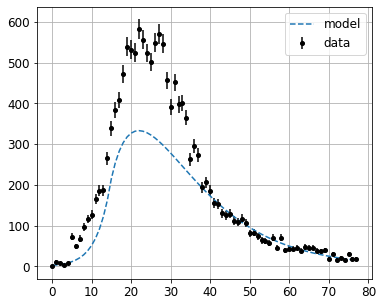

In [287]:
usa.plot_fit_data(xdata, pars, ufun= ufun)

In [127]:
def fit(fun, pars, mask = None, method = 'Delder-Mead'):
    res = cfit.minimize(pars, fun, mask = mask, method = method)

In [240]:
kmask0 = (('t0', 'phi', 's1'), ('beta', 'gamma', 'tr'))

def ana_ca(caname, kpars = {}, kmasks = kmask0, ax = None): 
    for i, kmask in enumerate(kmasks):
        ok = i == len(kmasks) - 1
        kpars = ana_ca_fit(caname, kpars, kmask, plot = ok, ax = ax)
        #print('mask: ', kmask)
        #print('pars: ', kpars)
    return kpars
    #kmask  = ('ti', 'tm')

def ana_ca_fit(caname, kpars, kmask, plot = True, ax = None):
    dates, cases, ucases = ca_cases(caname)
    ts                   = np.arange(len(dates))
    xdata  = ts, cases

    ufun = lambda pars : us._t0(pars, us._useirvarext)
    fun    = us.res(xdata, ufun = ufun)

    return ana_fit(xdata, fun, kpars, kmask, ufun, plot = plot, ax = ax)

def ana_fit(xdata, fun, kpars, kmask, ufun, plot, ax = None):
    xpars = getpars(**kpars)
    xmask = getmask(kmask)
    res   = cfit.minimize(xpars, fun, mask = xmask, method = 'Nelder-Mead')
    #print('initial pars   ', getparsdir(xpars))
    #print('estimated pars ', getparsdir(res))
    #print('initial guess  ', kmask, xpars[xmask])
    #print('estimated pars ', kmask, res[xmask])
    #print('fun value ', np.sum(fun(res)), ', initial ', np.sum(fun(xpars)))
    #usa.plot_fit_data(xdata, xpars, ufun = ufun)
    if (plot):
        usa.plot_fit_data(xdata, res  , ufun = ufun, ax = ax)
    return getparsdir(res)

### testing different parameters

{'t0': 43.0,
 'beta': 1.718595332557614,
 'gamma': 0.2,
 'tr': 3.6089703829738884,
 'ti': 5.5,
 'tm': 7.0,
 'n': 3000000.0,
 'phi': 0.016,
 's1': 0.11}

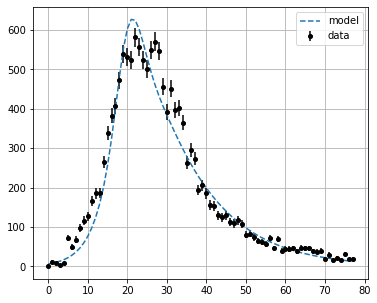

In [216]:
kpars = {'beta': 2., 'tr': 3}
kmask = ('beta', 'tr')
ana_ca_fit('Madrid', kpars, kmask)

/Users/hernando/investigacion/bio/c19/c19/useir.py:35: RuntimeWarning: invalid value encountered in true_divide
  return lambda x: xp(x)/norma


{'t0': 53.222073955726486,
 'beta': 5.0,
 'gamma': 0.6299999999999992,
 'tr': 1.0,
 'ti': 5.5,
 'tm': 7.0,
 'n': 3000000.0,
 'phi': 0.027425916590367236,
 's1': 0.10241697133106084}

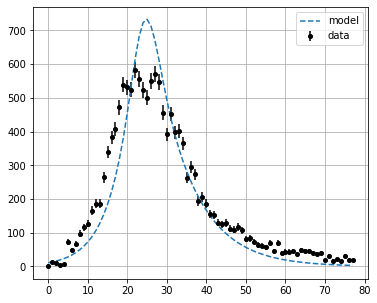

In [259]:
r0, r1 = 5., 0.6
kpars = {'t0': 41.4, 'beta': r0/1., 'gamma': r1/1., 'tr': 1., 'n': 3e6, 'phi': 0.017, 's1': 0.12}
ana_ca('Madrid', kpars)

/Users/hernando/investigacion/bio/c19/c19/useir.py:35: RuntimeWarning: invalid value encountered in true_divide
  return lambda x: xp(x)/norma


{'t0': 42.294665306931556,
 'beta': 3.1172733948929716,
 'gamma': 0.4724109490713252,
 'tr': 1.0000030726213893,
 'ti': 5.5,
 'tm': 7.0,
 'n': 3000000.0,
 'phi': 0.016343152249815758,
 's1': 0.12574220285724708}

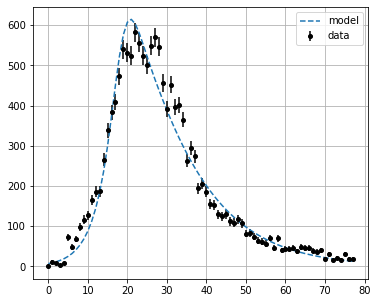

In [260]:
kpars = {'t0': 41.4, 'beta': r0/2., 'gamma': r1/2., 'tr': 2., 'n': 3e6, 'phi': 0.017, 's1': 0.12}
ana_ca('Madrid', kpars)

{'t0': 47.3849543239091,
 'beta': 1.5199098793006631,
 'gamma': 0.19653788284534918,
 'tr': 3.4089234384963816,
 'ti': 5.5,
 'tm': 7.0,
 'n': 3000000.0,
 'phi': 0.01867477732164819,
 's1': 0.11363539328832636}

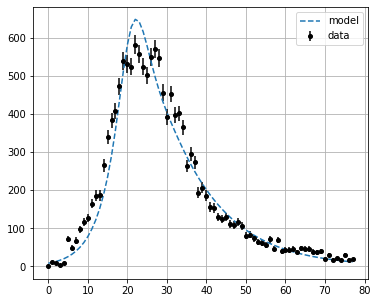

In [261]:
kpars = {'t0': 41.4, 'beta': r0/3., 'gamma': r1/3., 'tr': 3., 'n': 3e6, 'phi': 0.017, 's1': 0.12}
ana_ca('Madrid', kpars)

{'t0': 50.18113117426208,
 'beta': 1.509174965775129,
 'gamma': 0.22031496222402633,
 'tr': 3.041330757205394,
 'ti': 5.5,
 'tm': 7.0,
 'n': 3000000.0,
 'phi': 0.019259651622391908,
 's1': 0.11836763573792294}

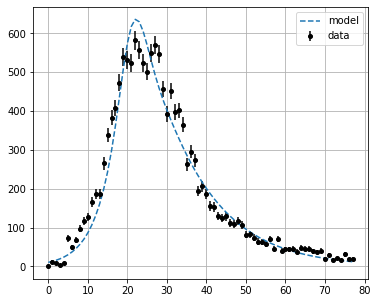

In [262]:
kpars = {'t0': 41.4, 'beta': r0/4., 'gamma': r1/4., 'tr': 4., 'n': 3e6, 'phi': 0.017, 's1': 0.12}
ana_ca('Madrid', kpars)

{'t0': 52.048004431558816,
 'beta': 1.616828818285906,
 'gamma': 0.25912617042779285,
 'tr': 2.375385977715603,
 'ti': 5.5,
 'tm': 7.0,
 'n': 3000000.0,
 'phi': 0.025160068610011188,
 's1': 0.08495774784597696}

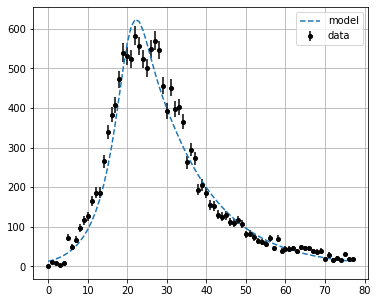

In [263]:
kpars = {'t0': 41.4, 'beta': r0/5., 'gamma': r1/5., 'tr': 5., 'n': 3e6, 'phi': 0.017, 's1': 0.12}
ana_ca('Madrid', kpars)

{'t0': 41.37497582339802,
 'beta': 2.568234674181266,
 'gamma': 0.3361491329278037,
 'tr': 1.910693044862603,
 'ti': 5.5,
 'tm': 7.0,
 'n': 3000000.0,
 'phi': 0.01747617800739982,
 's1': 0.11906264340434865}

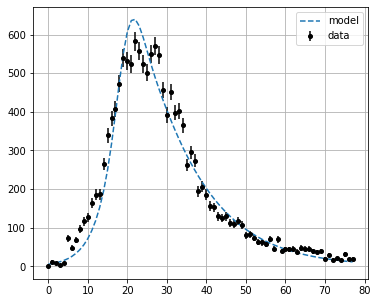

In [217]:
ana_ca('Madrid')

/Users/hernando/investigacion/bio/c19/c19/useir.py:35: RuntimeWarning: invalid value encountered in true_divide
  return lambda x: xp(x)/norma
/Users/hernando/investigacion/bio/c19/c19/useir.py:35: RuntimeWarning: invalid value encountered in true_divide
  return lambda x: xp(x)/norma


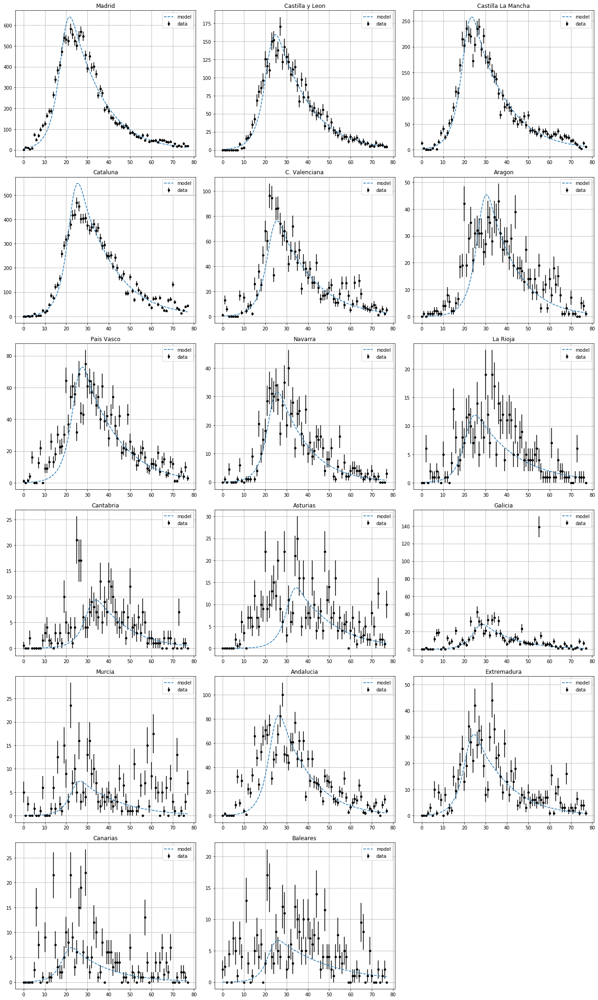

In [221]:
canames = ['Madrid', 'Castilla y Leon', 'Castilla La Mancha',
           'Cataluna', 'C. Valenciana', 'Aragon',
           'Pais Vasco', 'Navarra', 'La Rioja',
           'Cantabria', 'Asturias', 'Galicia',
           'Murcia', 'Andalucia', 'Extremadura',
           'Canarias', 'Baleares']

ncols, nrows = 3, 6
plt.figure(figsize = (ncols * 6, nrows * 5))

blind = False
capars = {}
for i, caname in enumerate(canames):
    ax = plt.subplot(nrows, ncols, i + 1, axisbelow=True)
    pars = ana_ca(caname, ax = ax)
    capars[caname] = pars
    plt.title(caname)
plt.tight_layout()

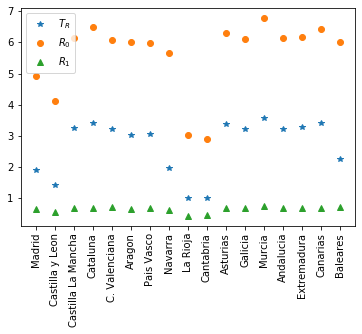

In [235]:
trs    = npa([capars[caname]['tr'] for caname in canames])
betas  = npa([capars[caname]['beta'] for caname in canames])
gammas = npa([capars[caname]['gamma'] for caname in canames])
plt.plot(trs, ls = '', marker = '*', label = r'$T_R$');
plt.plot(trs * betas, ls = '', marker = 'o', label = r'$R_0$');
plt.plot(trs * gammas, ls = '', marker = '^', label = r'$R_1$');
plt.legend();
plt.xticks(np.arange(len(canames)), canames, rotation = 90);

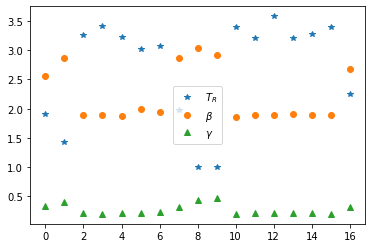

In [227]:
trs    = npa([capars[caname]['tr'] for caname in canames])
betas  = npa([capars[caname]['beta'] for caname in canames])
gammas = npa([capars[caname]['gamma'] for caname in canames])
plt.plot(trs, ls = '', marker = '*', label = r'$T_R$');
plt.plot(betas, ls = '', marker = 'o', label = r'$\beta$');
plt.plot(gammas, ls = '', marker = '^', label = r'$\gamma$');
plt.legend();

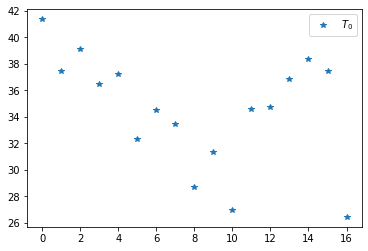

In [229]:
t0s = npa([capars[caname]['t0'] for caname in canames])
phis  = npa([capars[caname]['phi'] for caname in canames])
s1s = npa([capars[caname]['s1'] for caname in canames])
plt.plot(t0s, ls = '', marker = '*', label = r'$T_0$');
#plt.plot(betas, ls = '', marker = 'o', label = r'$\beta$');
#plt.plot(gammas, ls = '', marker = '^', label = r'$\gamma$');
plt.legend();

In [ ]:
t0s = npa([capars[caname]['t0'] for caname in canames])
plt.plot(t0s, ls = '', marker = '*', label = r'$T_0$');
plt.legend();

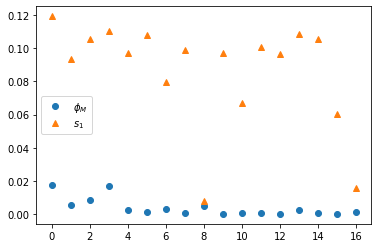

In [230]:
plt.plot(phis, ls = '', marker = 'o', label = r'$\phi_M$');
plt.plot(s1s, ls = '', marker = '^', label = r'$s_1$');
plt.legend();